In [10]:
import pandas as pd

In [152]:
from __future__ import division

In [11]:
from matplotlib import rcParams as rpc

In [12]:
rpc["figure.max_open_warning"] = 512
rpc["figure.figsize"] = (12,9)

In [13]:
import numpy as np

In [14]:
import matplotlib as mpl

In [66]:
from tqdm.notebook import tqdm as tqdm_notebook

In [16]:
import matplotlib.pyplot as plt

In [17]:
from sklearn.model_selection import cross_val_score
from sklearn.datasets import make_blobs
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import VotingClassifier

In [18]:
!ls

Untitled.ipynb	full_tracks_triplets   tuning_cuts.ipynb
clusters.ipynb	ntuplets.txt	       vertex_trimming.ipynb
doublets.ipynb	phase2_detector.ipynb
full_tracks	pixeltracks.txt


In [19]:
layermodules = [[303042564, 303087652],
 [304091140, 304185380],
 [305139716, 305217572],
 [306188292, 306298916],
 [352588804, 352601216],
 [352850948, 352863360],
 [353113092, 353125504],
 [353375236, 353387648],
 [353637380, 353649792],
 [353899524, 353911936],
 [354161668, 354174080],
 [354423812, 354436224],
 [354685956, 354702528],
 [354948100, 354964672],
 [355210244, 355226816],
 [355472388, 355488960],
 [344200196, 344212608],
 [344462340, 344474752],
 [344724484, 344736896],
 [344986628, 344999040],
 [345248772, 345261184],
 [345510916, 345523328],
 [345773060, 345785472],
 [346035204, 346047616],
 [346297348, 346313920],
 [346559492, 346576064],
 [346821636, 346838208],
 [347083780, 347100352]]

In [20]:
def eta(r,z):
    theta = np.arctan2(r,z)
    return -np.log(np.tan(theta/2))
    

In [21]:
def chiCut(pt):
        
    vals = [0.68177776, 0.74609577, -0.08035491, 0.00315399]
    ret = (vals[0] + pt * (vals[1] + pt * (vals[2] + pt * vals[3])))
    ret = ret * 30.0
    
    return ret
        

In [22]:
!ls -tlrh

total 8.1G
-rw-r--r-- 1 adrianodif cms 1.6M Sep  2 13:09 Untitled.ipynb
-rw-r--r-- 1 adrianodif cms  20K Sep  2 13:09 clusters.ipynb
-rw-r--r-- 1 adrianodif cms  80K Sep  2 13:09 doublets.ipynb
-rw-r--r-- 1 adrianodif cms 2.2M Sep  2 13:09 phase2_detector.ipynb
-rw-r--r-- 1 adrianodif cms  62K Sep  2 13:09 vertex_trimming.ipynb
-rw-r--r-- 1 adrianodif cms 730K Sep  2 13:09 ntuplets.txt
-rw-r--r-- 1 adrianodif cms  13M Sep  2 13:09 pixeltracks.txt
-rw-r--r-- 1 adrianodif cms 377M Sep  2 14:55 full_tracks_triplets
-rw-r--r-- 1 adrianodif cms 7.7G Sep  4 11:35 full_tracks
-rw-r--r-- 1 adrianodif cms 6.6M Sep  4 11:41 tuning_cuts.ipynb


In [23]:
NAMES = ["dummy"]
NAMES = NAMES + [ f + "_"+str(i) for i in range(0,13) for f in ["x","y","z","k","pdg","sizeY","sizeX","det"]]
NAMES.append("n")
NAMES.append("chi2")
NAMES.append("pt")
NAMES.append("eta")
NAMES.append("qual")
NAMES.append("zip")
NAMES.append("tip")
NAMES.append("flip")
NAMES = np.array(NAMES)
NAMES.flatten()
tracks_val = pd.read_table("full_tracks",sep=" - ",names=NAMES,error_bad_lines=False,nrows=1200000)

/cvmfs/cms.cern.ch/slc7_amd64_gcc820/external/py2-ipykernel/4.10.1-bcolbf2/lib/python2.7/site-packages/ipykernel_launcher.py:13: FutureWarning: read_table is deprecated, use read_csv instead.
  del sys.path[0]
/cvmfs/cms.cern.ch/slc7_amd64_gcc820/external/py2-ipykernel/4.10.1-bcolbf2/lib/python2.7/site-packages/ipykernel_launcher.py:13: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  del sys.path[0]


In [24]:
tracks_val = tracks_val.drop("dummy",axis=1)

In [25]:
tracks_val.head()

,x_0,y_0,z_0,k_0,pdg_0,sizeY_0,sizeX_0,det_0,x_1,y_1,...,sizeX_12,det_12,n,chi2,pt,eta,qual,zip,tip,flip
0,-4.381560,0.376310,-25.6000,159210,-211,1,1,344200232,-6.305630,0.579807,...,-999.9,-999.9,3,0.128279,0.597717,-1.99385,0,-9.80777,0.179244,0
1,2.352200,-2.243990,-18.3297,96296,-211,2,22,303083524,4.635260,-4.472370,...,-999.9,-999.9,3,27.519800,2.720000,1.31782,0,-23.98200,-0.081077,1
2,-1.985390,-1.903700,-15.5770,137180,-211,4,1,303071240,-4.276560,-4.118490,...,-999.9,-999.9,3,1.526610,1.819850,1.90323,0,-24.61590,0.062408,1
3,-2.870400,-0.087295,-16.1433,96,211,5,1,303063044,-5.912130,-0.294568,...,-999.9,-999.9,3,71.024700,4.100660,1.80179,0,-24.62690,0.084383,1
4,0.232846,-2.784620,-18.8171,714,211,2,5,303079428,0.440434,-5.892930,...,-999.9,-999.9,3,0.956259,1.024380,1.50209,0,-24.79840,0.045320,1


In [26]:
tracks_val = tracks_val.astype(float)

In [27]:
tracks_val = tracks_val[~np.isnan(tracks_val["eta"])]

In [28]:
len(tracks_val)

1200000

In [29]:
tracks_val.to_hdf("full_tracks.h5","data",complevel=0)

In [30]:
tracks_val = tracks_val.sample(frac=1.0)

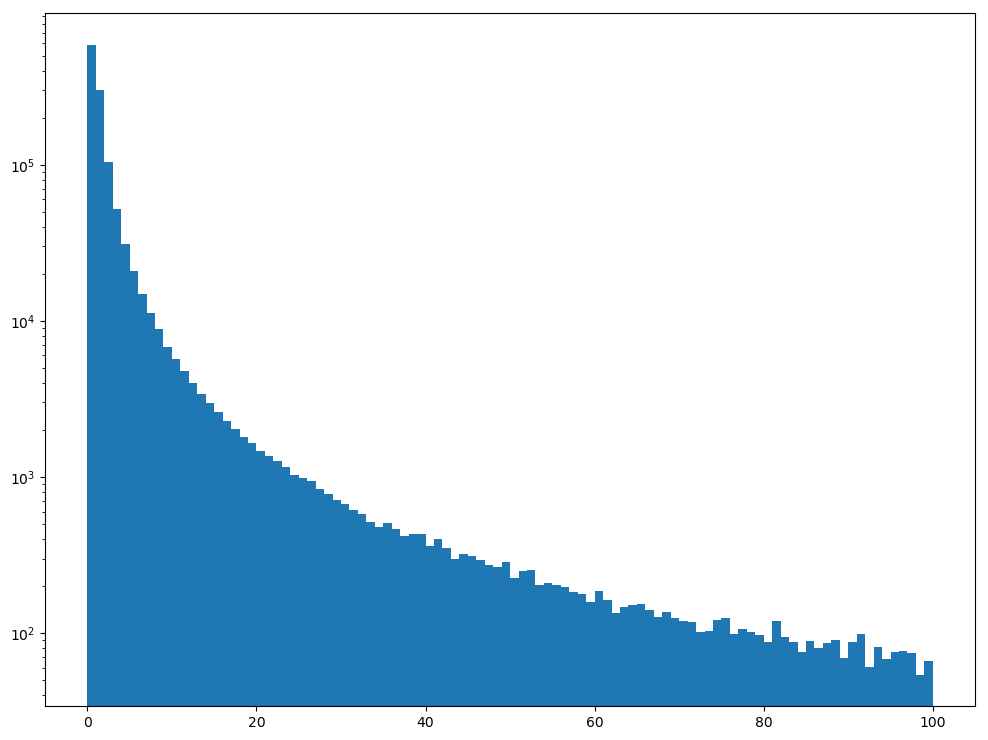

In [31]:
plt.figure(figsize=(12,9))
plt.hist(tracks_val["pt"].values,log=True,range=(0.0,100),bins=100);

In [32]:
pdgs = ["pdg_"+str(i) for i in range(0,13)]
keys = ["k_"+str(i) for i in range(0,13)]

In [33]:
tracks_val[keys] = tracks_val[keys].astype(float)

In [34]:
np.unique(tracks_val[keys].values.flatten()).shape[0]

58436

In [35]:
for i in range(12):
    tracks_val["doub_match_" +str(i)] = 0.0

In [36]:
for i in tqdm_notebook(range(12)):
    cut = (tracks_val["pdg_"+str(i)] == tracks_val["pdg_"+str(i+1)]) & (tracks_val["pdg_"+str(i)] !=-999.9)
    cut = cut & (tracks_val["k_"+str(i)] == tracks_val["k_"+str(i+1)]) 
    tracks_val.loc[cut,"doub_match_" +str(i)] = 1.0

/cvmfs/cms.cern.ch/slc7_amd64_gcc820/external/py2-ipykernel/4.10.1-bcolbf2/lib/python2.7/site-packages/ipykernel_launcher.py:1: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  """Entry point for launching an IPython kernel.


In [37]:
tracks_val["matched"] = tracks_val[["doub_match_" +str(i) for i in range(12)]].sum(axis=1)

In [38]:
tracks_val["frac"] = tracks_val["matched"] / (tracks_val["n"]-1)

In [39]:
matched = tracks_val["matched"]
frac = tracks_val["frac"]

In [181]:
Xs = tracks_val[["x_" + str(i) for i in range(0,13)]].values.astype(float)
Ys = tracks_val[["y_" + str(i) for i in range(0,13)]].values.astype(float)
Zs = tracks_val[["z_" + str(i) for i in range(0,13)]].values.astype(float)
PTs = np.abs(tracks_val["pt"].values)
ETAs = np.abs(tracks_val["eta"].values)
Rs = np.sqrt(Xs**2 + Ys**2)
PHIs = np.arctan2(Ys,Xs)
Ns = tracks_val["n"].values.astype(int)
QUAL = tracks_val["qual"].values
pdgS = tracks_val[["pdg_" + str(i) for i in range(0,13)]].values.astype(float)
keyS = tracks_val[["k_" + str(i) for i in range(0,13)]].values.astype(float)

In [41]:
for i in range(0,13):
    tracks_val["r_" + str(i)] = Rs[:,i]
    tracks_val["phi_" + str(i)] = PHIs[:,i]

In [42]:
for i in range(0,12):
    tracks_val["dphi_" + str(i)] = PHIs[:,i+1] - PHIs[:,i]

In [43]:
for i in range(0,12):
    tracks_val["dr_" + str(i)] = Rs[:,i+1] - Rs[:,i]

In [44]:
for i in range(0,12):
    tracks_val["z0_" + str(i)] = abs(Rs[:,i+1]*Zs[:,i] - Rs[:,i]*Zs[:,i+1]) / tracks_val["dr_" + str(i)]

In [45]:
for i in range(0,12):
    tracks_val.loc[tracks_val["dphi_" + str(i)]>np.pi,"dphi_" + str(i)] = 2*np.pi - tracks_val[tracks_val["dphi_" + str(i)]>np.pi]["dphi_" + str(i)]
for i in range(0,12):
    tracks_val.loc[tracks_val["dphi_" + str(i)]<-np.pi,"dphi_" + str(i)] = -2*np.pi + tracks_val[tracks_val["dphi_" + str(i)]<-np.pi]["dphi_" + str(i)]

In [46]:
true_track = tracks_val["frac"]>=0.75
semi_true = tracks_val["frac"]>=0.6
super_true_track = tracks_val["frac"]>=0.75

In [47]:
trips = tracks_val["n"]<4
quads = tracks_val["n"]>3

In [48]:
bad = (QUAL==0)
dup = (QUAL==1)
god = (QUAL>=2)

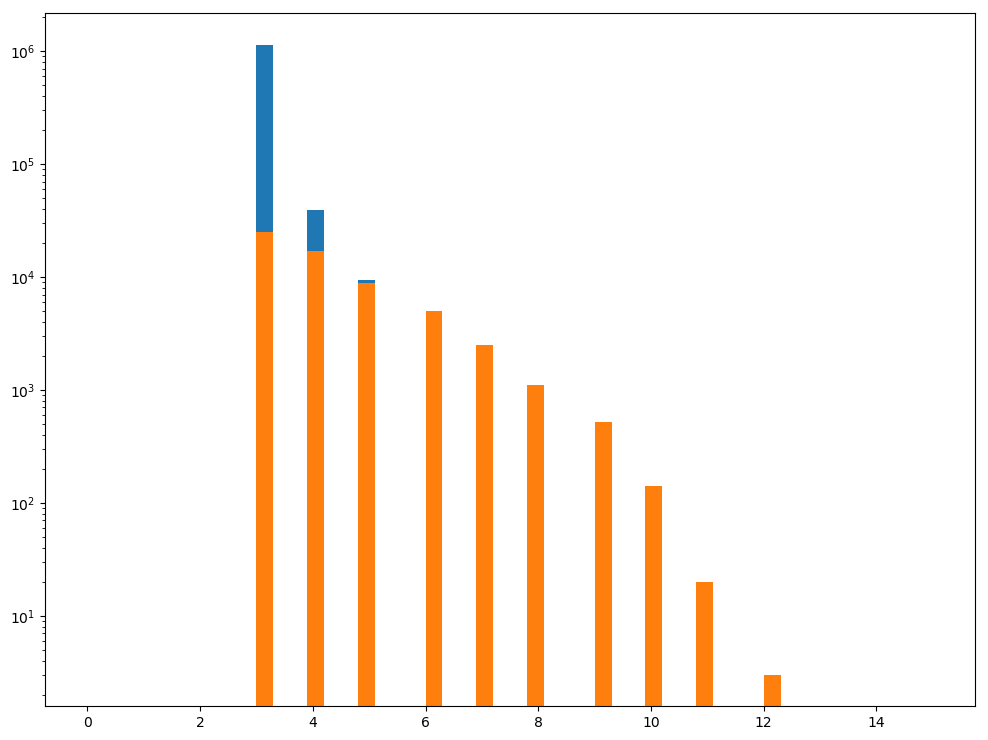

In [397]:
plt.figure(figsize=(12,9))
plt.hist(tracks_val["n"],bins=50,range=(0.0,15.0),log=True);
plt.hist(tracks_val[semi_true]["n"],bins=50,range=(0.0,15.0),log=True);
#plt.hist(tracks_val[true_track]["n"],bins=50,range=(0.0,15.0),log=True);

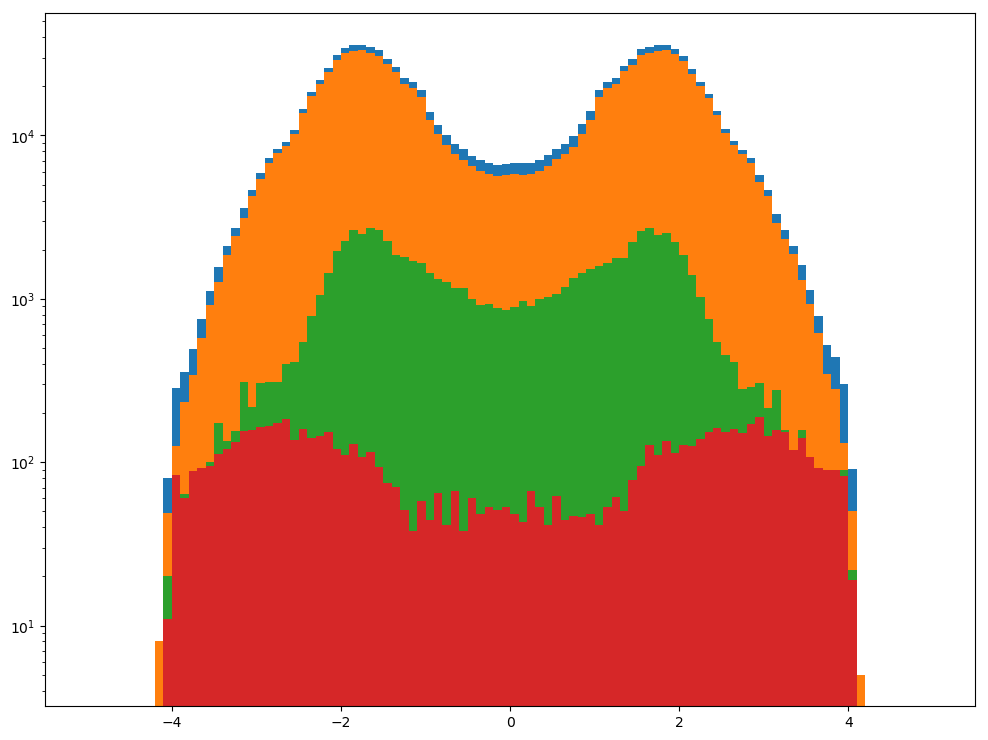

In [390]:
plt.figure(figsize=(12,9))

plt.hist(tracks_val[PTs>0]["eta"],log=True,range=(-5,5),bins=100);
plt.hist(tracks_val[bad & (PTs>0)]["eta"],log=True,range=(-5,5),bins=100);
plt.hist(tracks_val[dup & (PTs>0)]["eta"],log=True,range=(-5,5),bins=100);
plt.hist(tracks_val[god & (PTs>0)]["eta"],log=True,range=(-5,5),bins=100);

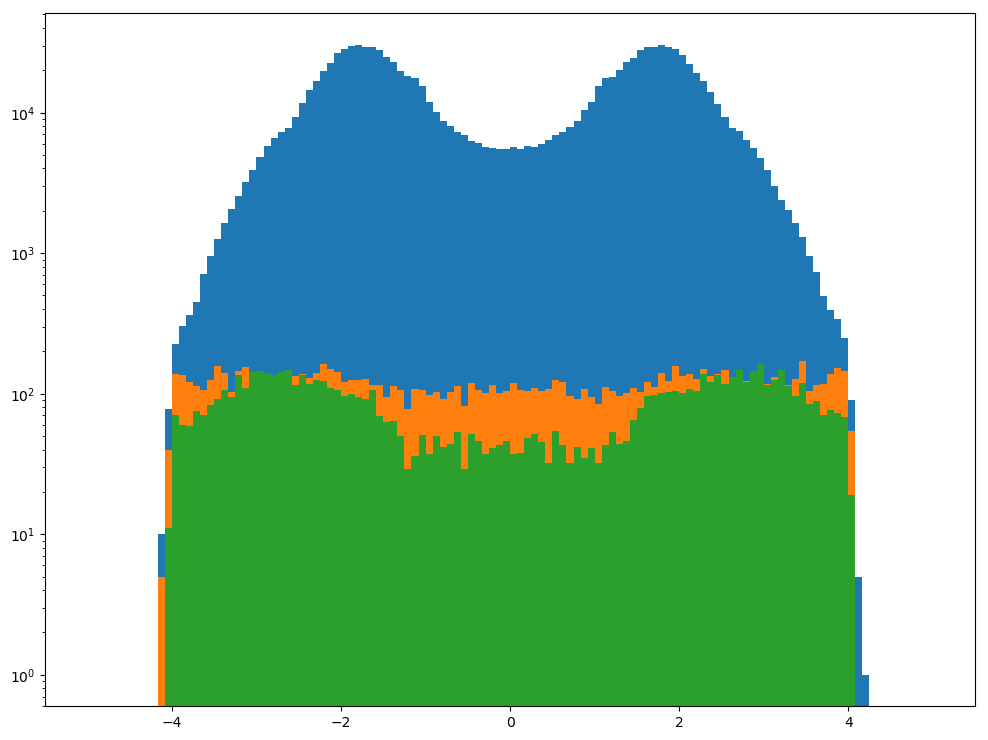

In [392]:
plt.figure(figsize=(12,9))

plt.hist(tracks_val[PTs>0]["eta"],log=True,range=(-5,5),bins=120);
plt.hist(tracks_val[true_track & (PTs>0)]["eta"],log=True,range=(-5,5),bins=120);
plt.hist(tracks_val[god & (PTs>0)]["eta"],log=True,range=(-5,5),bins=120);

In [51]:
print("Triplets : %d (Bad: %d - True: %d - TP: %d)"%
    (tracks_val[trips].shape[0],
     tracks_val[trips & bad].shape[0],
     tracks_val[trips & semi_true].shape[0],
     tracks_val[trips & semi_true & ~bad].shape[0]))
print("Ntuplets : %d (Bad: %d - True: %d - TP: %d)"%
      (tracks_val[quads].shape[0],tracks_val[quads & bad].shape[0],
       tracks_val[quads & super_true_track].shape[0],
       tracks_val[quads & super_true_track & ~bad].shape[0]))

Triplets : 1142137 (Bad: 987003 - True: 24997 - TP: 23726)
Ntuplets : 57863 (Bad: 21656 - True: 31554 - TP: 30363)


## Doublets

In [52]:
layer_couples = [0, 1, 0, 4, 0, 16, ##BPIX1 (3)
    1, 2, 1, 4, 1, 16, ##BPIX2 (6)
    4 ,5 ,5 ,6 ,6 ,7 ,7 ,8 ,8 ,9 ,9 ,10,10,11, ##POS (13)
    16,17,17,18,18,19,19,20,20,21,21,22,22,23, ##NEG (20)

    0, 2, 0, 5, 0, 17, ## BPIX1 Jump (23)
    1, 3, 1, 5, 1, 17, ## BPIX2 Jump (26)

    4, 6, 5, 7, 6, 8, 7, 9, 8, 10,9 ,11,10,12, ##POS Jump (33)
    16,18,17,19,18,20,19,21,20,22,21,23,22,24, ##NEG Jump (40)

    2, 3, 2, 4, 2, 16, ##Barrel Jump (43)
    11,12,12,13,13,14,14,15, ##Late POS (47)
    23,24,24,25,25,26,26,27] ##Late NEG (51)

In [53]:
layer_pairs = [ [layer_couples[i],layer_couples[i+1]] for i in range(0,len(layer_couples),2)]

In [54]:
for i in range(0,13):
    #for j in range(len(layermodules)):
    tracks_val["det_id"+ str(i)] = 99.0

In [55]:
layer_ranges = []
for l in layermodules:
    layer_ranges.append(np.array([f for f in range(l[0],l[1]+1)]).astype(float))

In [56]:
for i in tqdm_notebook(range(0,13)):
    for k in (range(len(layer_ranges))):
        cut = tracks_val["det_"+ str(i)].isin(layer_ranges[k])
        tracks_val.loc[cut,"det_id"+ str(i)] = float(k)    

/cvmfs/cms.cern.ch/slc7_amd64_gcc820/external/py2-ipykernel/4.10.1-bcolbf2/lib/python2.7/site-packages/ipykernel_launcher.py:1: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  """Entry point for launching an IPython kernel.


In [57]:
for i in range(0,12):
    #for j in range(len(layermodules)):
    tracks_val["pair_"+ str(i)] = 99.0

In [58]:
tracks_val[["det_id"+str(i)for i in range(0,13)]].head()

,det_id0,det_id1,det_id2,det_id3,det_id4,det_id5,det_id6,det_id7,det_id8,det_id9,det_id10,det_id11,det_id12
1161047,0.0,1.0,3.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0
644947,5.0,6.0,7.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0
1146567,0.0,1.0,16.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0
652002,4.0,6.0,7.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0
1105131,0.0,1.0,3.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0


In [59]:
tracks_val[["pdg_"+str(i)for i in range(0,13)]].head()

,pdg_0,pdg_1,pdg_2,pdg_3,pdg_4,pdg_5,pdg_6,pdg_7,pdg_8,pdg_9,pdg_10,pdg_11,pdg_12
1161047,211.0,-11.0,321.0,-999.9,-999.9,-999.9,-999.9,-999.9,-999.9,-999.9,-999.9,-999.9,-999.9
644947,-321.0,-321.0,-321.0,-999.9,-999.9,-999.9,-999.9,-999.9,-999.9,-999.9,-999.9,-999.9,-999.9
1146567,211.0,321.0,-11.0,-999.9,-999.9,-999.9,-999.9,-999.9,-999.9,-999.9,-999.9,-999.9,-999.9
652002,211.0,211.0,211.0,-999.9,-999.9,-999.9,-999.9,-999.9,-999.9,-999.9,-999.9,-999.9,-999.9
1105131,-211.0,211.0,-211.0,-999.9,-999.9,-999.9,-999.9,-999.9,-999.9,-999.9,-999.9,-999.9,-999.9


In [60]:
for i in tqdm_notebook(range(0,12)):
    for k in (range(len(layer_pairs))):
        cut = (tracks_val["det_id"+str(i)] == layer_pairs[k][0]) & (tracks_val["det_id"+str(i+1)] == layer_pairs[k][1])
        tracks_val.loc[cut,"pair_"+ str(i)] = float(k)

/cvmfs/cms.cern.ch/slc7_amd64_gcc820/external/py2-ipykernel/4.10.1-bcolbf2/lib/python2.7/site-packages/ipykernel_launcher.py:1: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  """Entry point for launching an IPython kernel.


In [61]:
tracks_val[["pair_"+str(i)for i in range(0,12)]].head()

,pair_0,pair_1,pair_2,pair_3,pair_4,pair_5,pair_6,pair_7,pair_8,pair_9,pair_10,pair_11
1161047,0.0,23.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0
644947,7.0,8.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0
1146567,0.0,5.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0
652002,26.0,8.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0
1105131,0.0,23.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0


In [62]:
layer_pairs_params = np.full(16,999999.0).reshape(1,16)
for k in tqdm_notebook(range(len(layer_pairs))):
    for i in range(12):
        cut = (tracks_val["pair_"+str(i)] == k)
        layer_pairs_params = np.vstack([layer_pairs_params,tracks_val[cut][["z_"+str(i),"r_"+str(i),"dphi_"+str(i),"qual","frac","dr_"+str(i),"z0_"+str(i),"sizeX_"+str(i),"sizeX_"+str(i+1),"sizeY_"+str(i),"sizeY_"+str(i+1),"pair_"+str(i),"pdg_"+str(i),"pdg_"+str(i+1),"k_"+str(i),"k_"+str(i+1)]]]) 
layer_pairs_params = layer_pairs_params[1:,:]

/cvmfs/cms.cern.ch/slc7_amd64_gcc820/external/py2-ipykernel/4.10.1-bcolbf2/lib/python2.7/site-packages/ipykernel_launcher.py:2: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


In [63]:
doublets_df = pd.DataFrame(layer_pairs_params,columns=["z_0","r_0","dphi","qual","frac","dr","z0","sizeX0","sizeX1","sizeY0","sizeY1","pair","pdg_0","pdg_1","k_0","k_1"])
doublets_df["label"] = -1.0
cut = (doublets_df["pdg_0"] == doublets_df["pdg_1"]) & (doublets_df["k_0"] == doublets_df["k_1"])
doublets_df.loc[cut,"label"] = 1.0
true_doub = doublets_df["label"] == 1.0
doublets_df.head()

,z_0,r_0,dphi,qual,frac,dr,z0,sizeX0,sizeX1,sizeY0,sizeY1,pair,pdg_0,pdg_1,k_0,k_1,label
0,-11.33030,2.753770,0.005531,0.0,0.0,3.167163,17.279694,6.0,3.0,2.0,2.0,0.0,211.0,-11.0,120349.0,136074.0,-1.0
1,5.04816,2.792431,0.003204,0.0,0.0,3.112394,18.543997,3.0,2.0,3.0,5.0,0.0,211.0,321.0,133555.0,131705.0,-1.0
2,-6.81008,2.796558,0.013130,0.0,0.0,3.616972,6.074928,38.0,2.0,7.0,2.0,0.0,-211.0,211.0,153192.0,142606.0,-1.0
3,-9.95616,2.750620,0.015277,1.0,0.0,3.195708,6.233670,8.0,2.0,1.0,5.0,0.0,13.0,-211.0,134870.0,142911.0,-1.0
4,-3.14809,2.856374,-0.011299,0.0,0.0,3.094017,10.325628,1.0,1.0,5.0,3.0,0.0,-211.0,-211.0,137039.0,169023.0,-1.0


In [64]:
n_pairs = len(layer_pairs)

#### Z_min & z_max

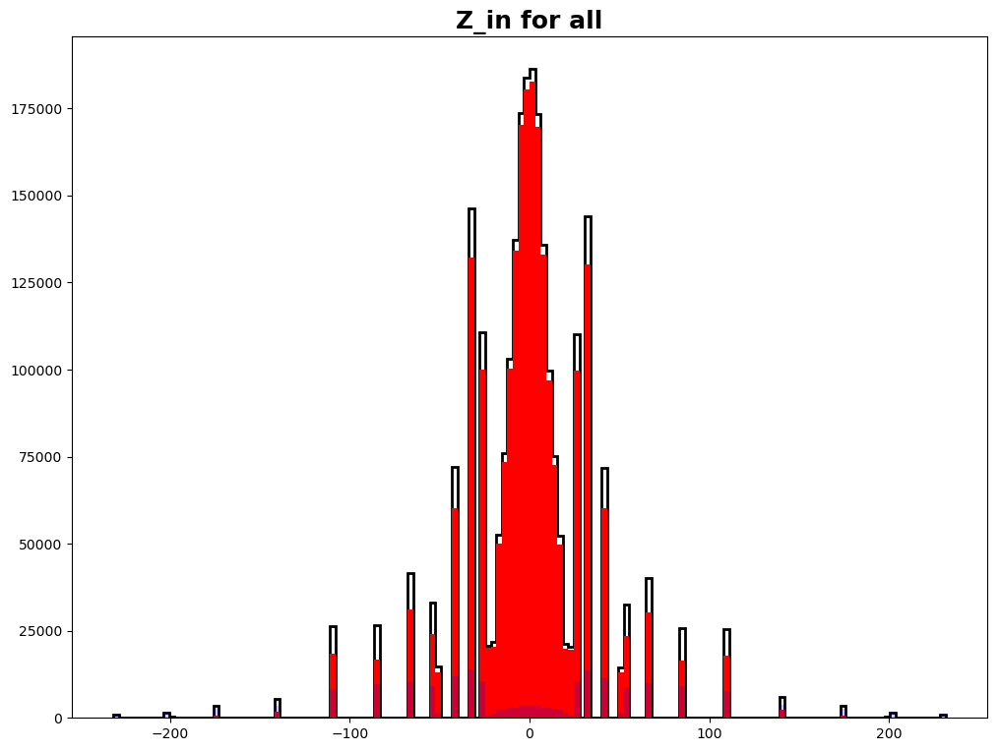

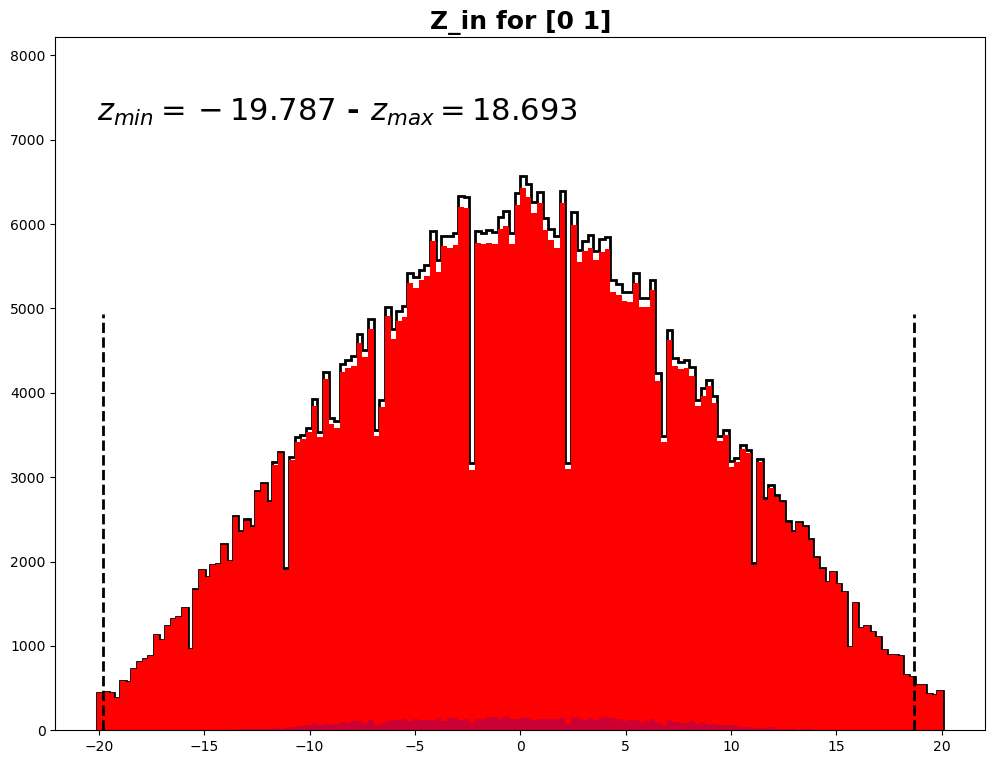

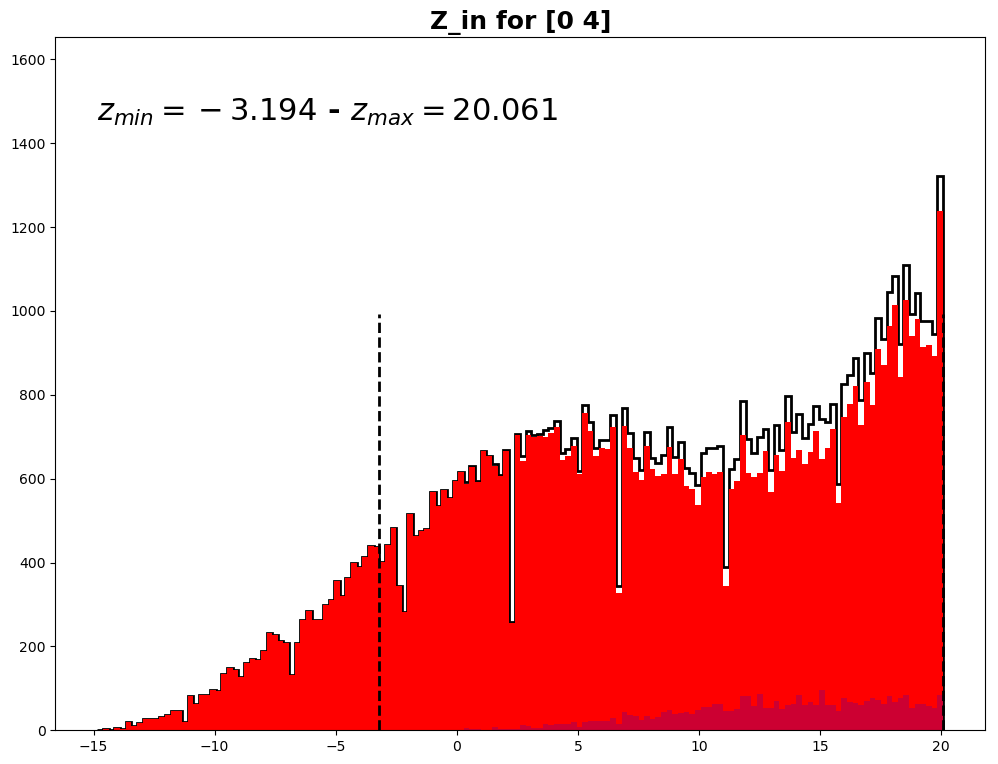

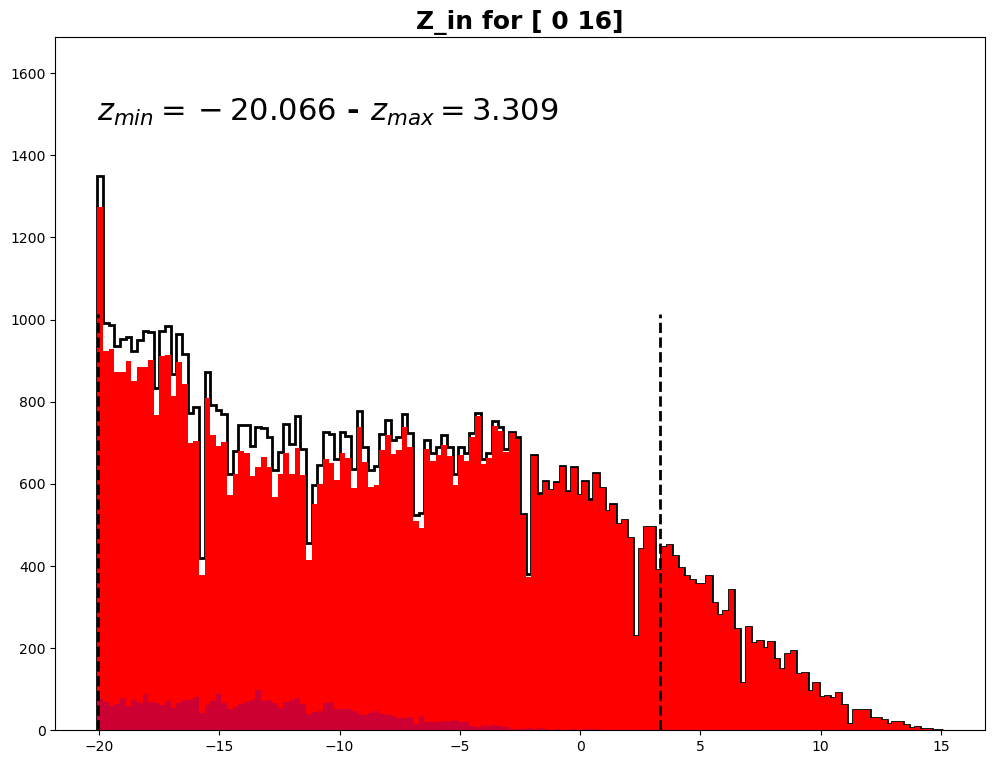

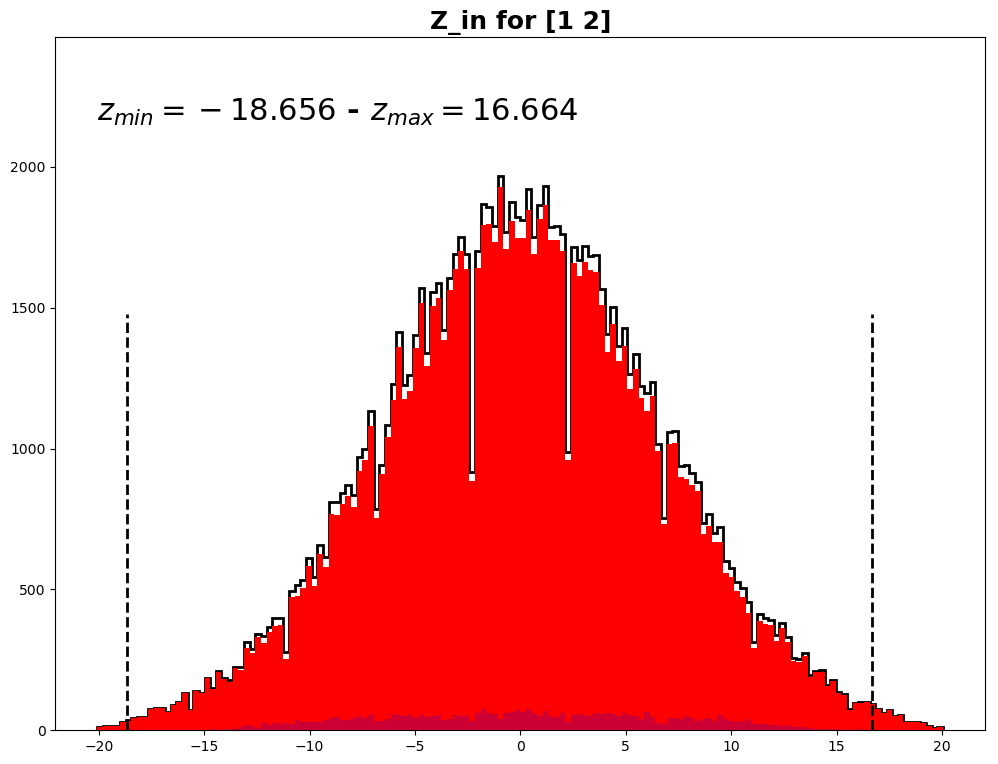

...

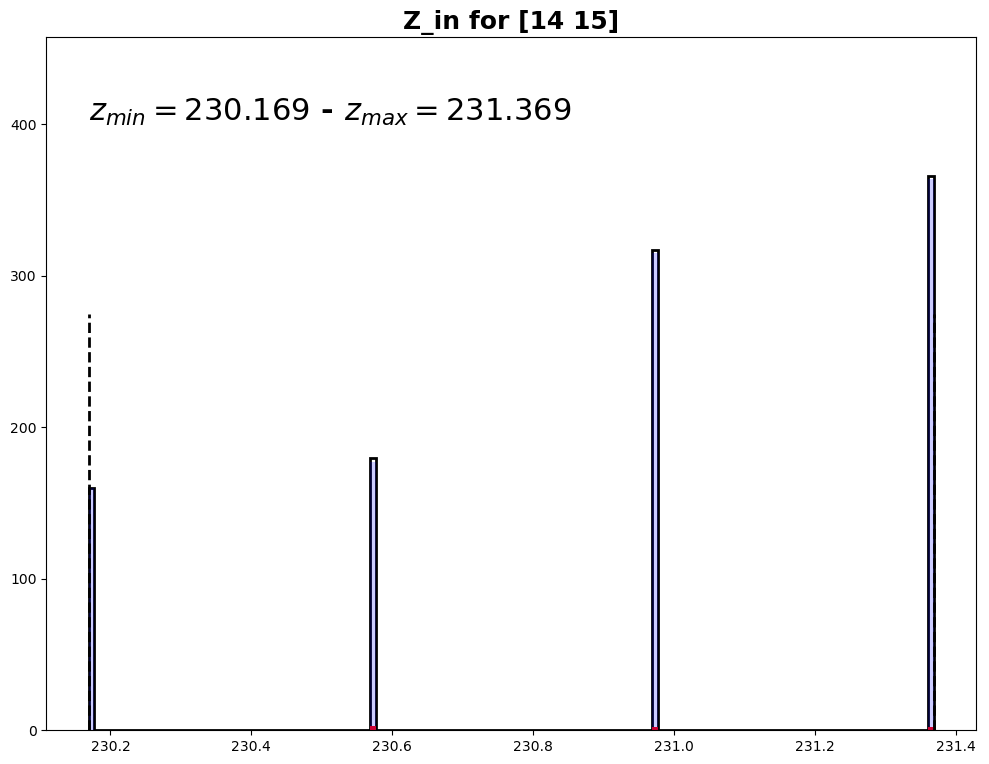

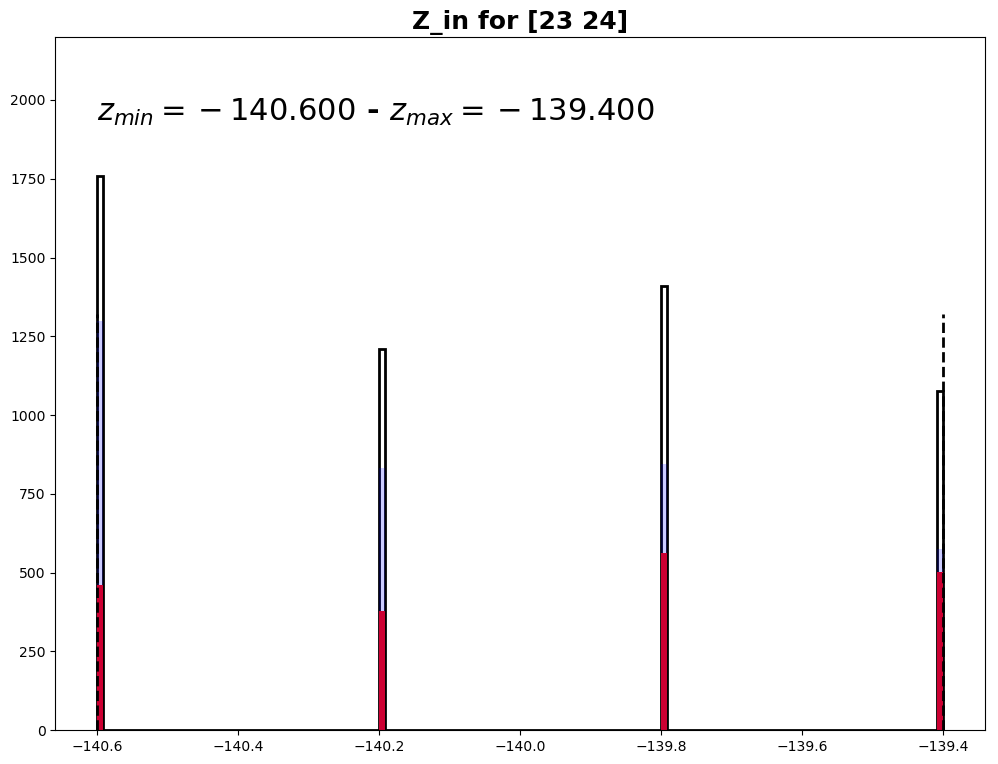

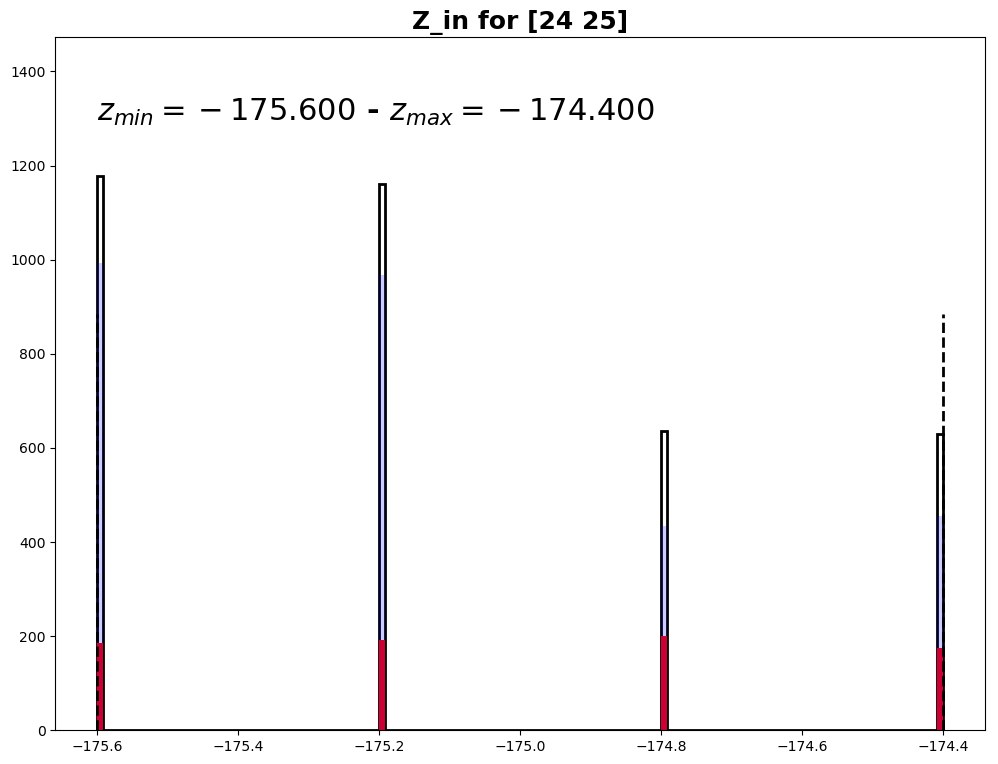

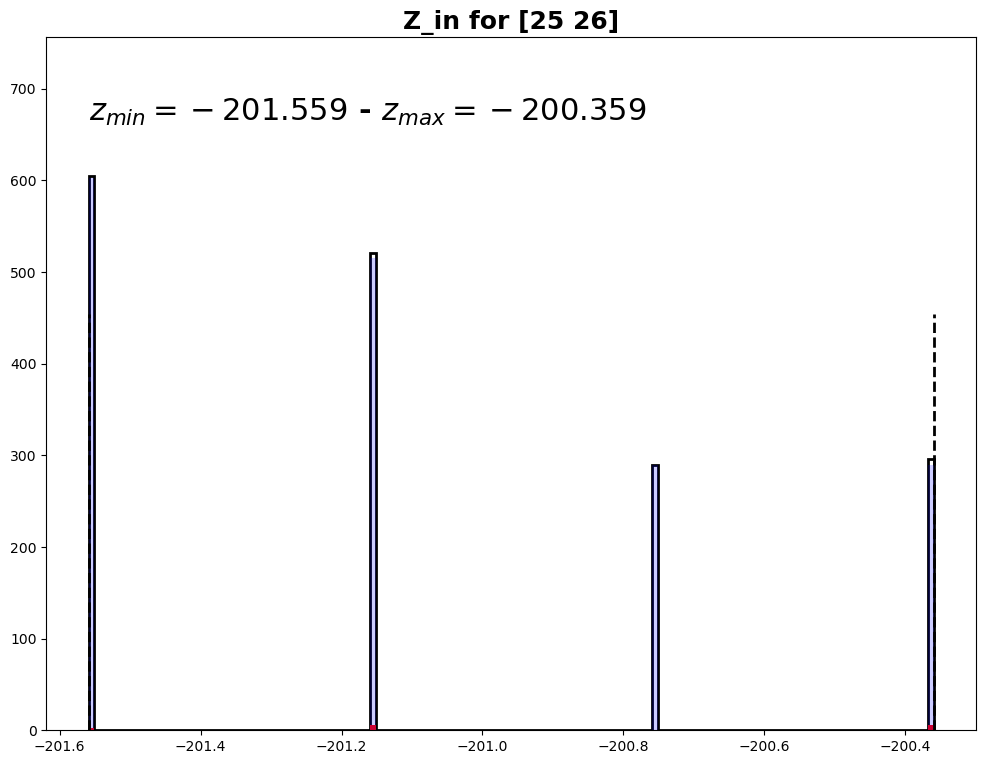

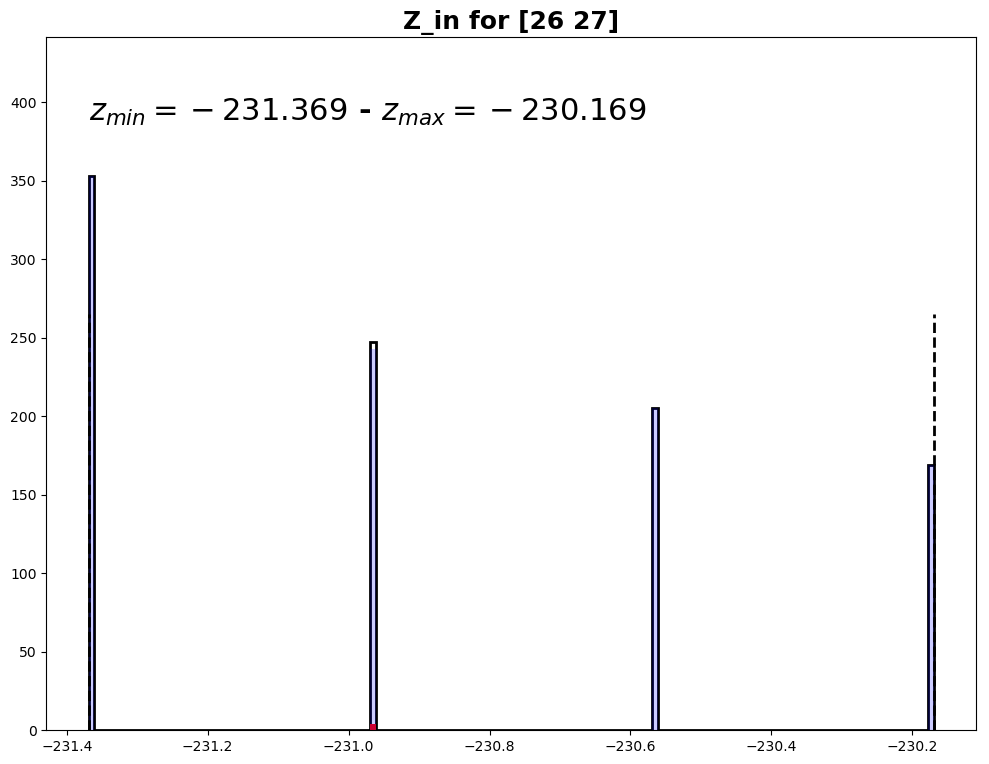

In [387]:
z_min = []
z_max = []
thresh = 99
binning = 150
VAR = "z_0"
plt.figure(figsize=(12,9))
cut = (doublets_df["pair"] > -100)
mm = doublets_df[cut][VAR].values.min()
MM = doublets_df[cut][VAR].values.max()
plt.title("Z_in for all",fontsize=18,fontweight="bold")
n = plt.hist(doublets_df[cut][VAR].values,bins=binning,range=(mm,MM),histtype="step",lw=2,color="black");
plt.hist(doublets_df[cut & ~true_doub][VAR].values,bins=binning,range=(mm,MM),color="red",alpha=1.0);
plt.hist(doublets_df[cut & true_doub][VAR].values,bins=binning,range=(mm,MM),color="blue",alpha=0.2);

MIN = doublets_df[cut & true_doub][VAR].values.min()
MAX = doublets_df[cut & true_doub][VAR].values.max()
RAN = max(MAX,abs(MIN))

'''
orig = len(doublets_df[cut & true_doub & dphirange][VAR].values)
orig_bad = len(doublets_df[cut & ~true_doub & dphirange])
for t in np.arange(RAN,0.0,-0.01):
    newdphirange =  doublets_df[VAR].abs() < t
    new = len(doublets_df[cut & true_doub & newdphirange][VAR].values)
    if (new/orig)<thresh/100.0:
        break
new_bad = len(doublets_df[cut & ~true_doub & newdphirange])
rej = 1.0 - new_bad/orig_bad
    
plt.text(-0.1,max(n[0])*0.9,r"|$\Delta\phi_{.%d}| < %.3f$"%(thresh,t),fontsize=22,fontweight="bold")
plt.text(-0.1,max(n[0])*0.8,r"$Rej = %.2f$"%rej,fontsize=22,fontweight="bold")

plt.plot([-t,-t],[0.0,max(n[0])*0.75],"--",color="black",lw=2)
plt.plot([t,t],[0.0,max(n[0])*0.75],"--",color="black",lw=2)''';
#phi_cuts.append(t)

for i in tqdm_notebook(range(n_pairs)):
    
    plt.figure(figsize=(12,9))
    cut = (doublets_df["pair"] == i)
    mm = doublets_df[cut][VAR].values.min()
    MM = doublets_df[cut][VAR].values.max()
    plt.title("Z_in for %s"%(layer_pairs[i]),fontsize=18,fontweight="bold")
    n = plt.hist(doublets_df[cut][VAR].values,bins=binning,range=(mm,MM),histtype="step",lw=2,color="black");
    plt.hist(doublets_df[cut & ~true_doub][VAR].values,bins=binning,range=(mm,MM),color="red",alpha=1.0);
    plt.hist(doublets_df[cut & true_doub][VAR].values,bins=binning,range=(mm,MM),color="blue",alpha=0.2);

    MIN = doublets_df[cut & true_doub][VAR].values.min()
    MAX = doublets_df[cut & true_doub][VAR].values.max()
    
    '''
    RAN = max(MAX,abs(MIN))
    
    orig = len(doublets_df[cut & true_doub & dphirange])
    orig_bad = len(doublets_df[cut & ~true_doub & dphirange])
    for t in np.arange(RAN,0.0,-0.01):
        newdphirange =  doublets_df[VAR].abs() < t
        new = len(doublets_df[cut & true_doub & newdphirange][VAR].values)
        if (new/orig)<thresh/100.0:
            break
    new_bad = len(doublets_df[cut & ~true_doub & newdphirange])
    rej = 1.0 - new_bad/orig_bad''';
    
    plt.text(mm,max(n[0])*1.1,r"$z_{min} = %.3f$ - $z_{max} = %.3f$ "%(MIN,MAX),fontsize=22,fontweight="bold")
    #plt.text(-0.1,max(n[0])*0.8,r"$Rej = %.2f$"%rej,fontsize=22,fontweight="bold")
    
    plt.ylim(0,max(n[0])*1.25)
    plt.plot([MIN,MIN],[0.0,max(n[0])*0.75],"--",color="black",lw=2)
    plt.plot([MAX,MAX],[0.0,max(n[0])*0.75],"--",color="black",lw=2)

    z_min.append(MIN)
    z_max.append(MAX)

In [385]:
np.round(np.array(z_min))

array([ -20.,   -3.,  -20.,  -19.,    3.,  -20.,   24.,   31.,   40.,
         52.,   66.,   85.,  109.,  -26.,  -33.,  -41.,  -53.,  -68.,
        -86., -110.,  -19.,   -3.,  -20.,  -20.,    7.,  -20.,   24.,
         31.,   40.,   52.,   66.,   85.,  109.,  -26.,  -33.,  -41.,
        -53.,  -68.,  -86., -110.,  -19.,   13.,  -20.,  139.,  174.,
        200.,  230., -141., -176., -202., -231.])

In [386]:
np.round(np.array(z_max))

array([  19.,   20.,    3.,   17.,   20.,   -3.,   26.,   33.,   41.,
         53.,   68.,   86.,  110.,  -24.,  -31.,  -40.,  -52.,  -66.,
        -85., -109.,   19.,   20.,    3.,   16.,   20.,   -5.,   26.,
         33.,   41.,   53.,   68.,   86.,  110.,  -24.,  -31.,  -40.,
        -52.,  -66.,  -85., -109.,   18.,   20.,  -11.,  141.,  176.,
        202.,  231., -139., -174., -200., -230.])

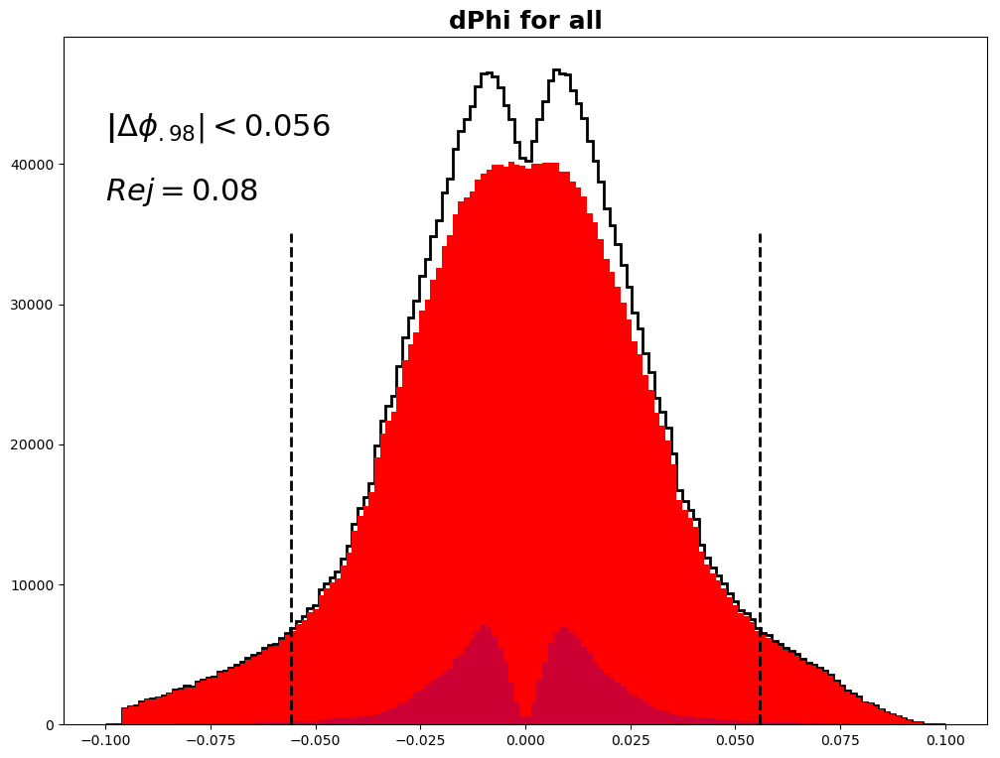

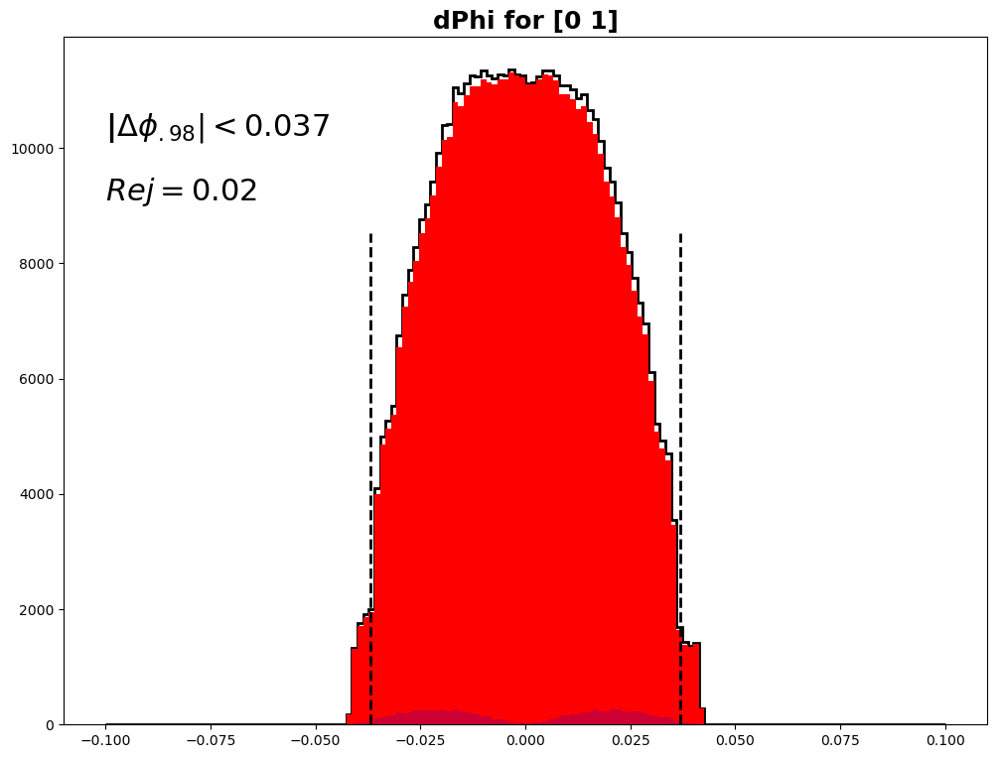

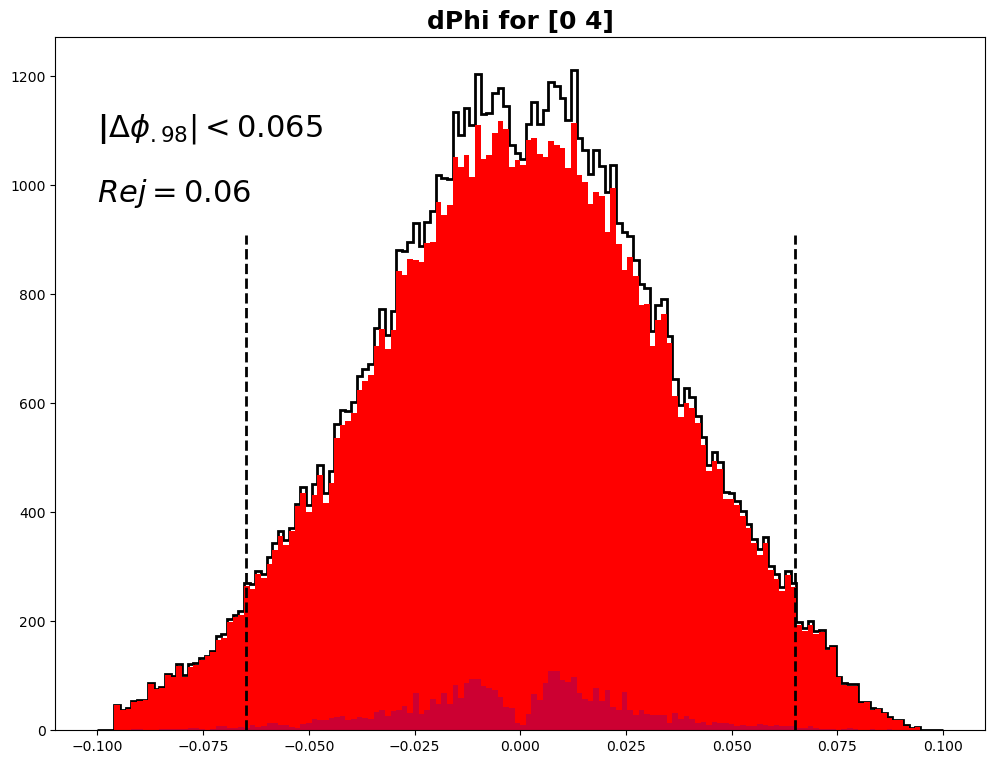

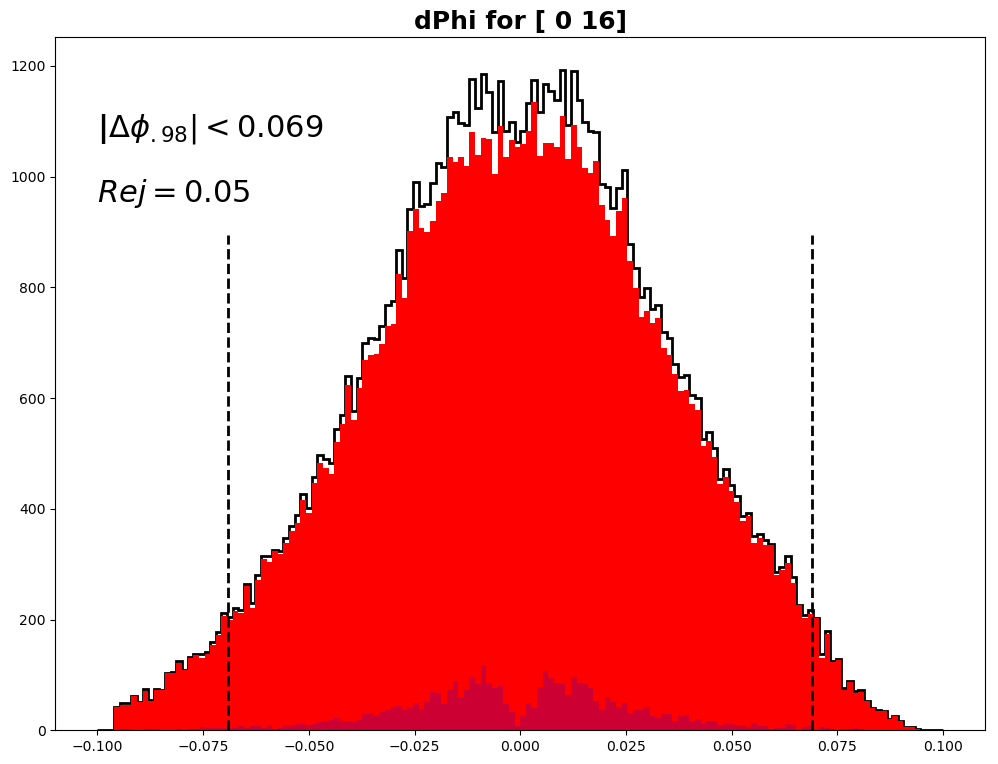

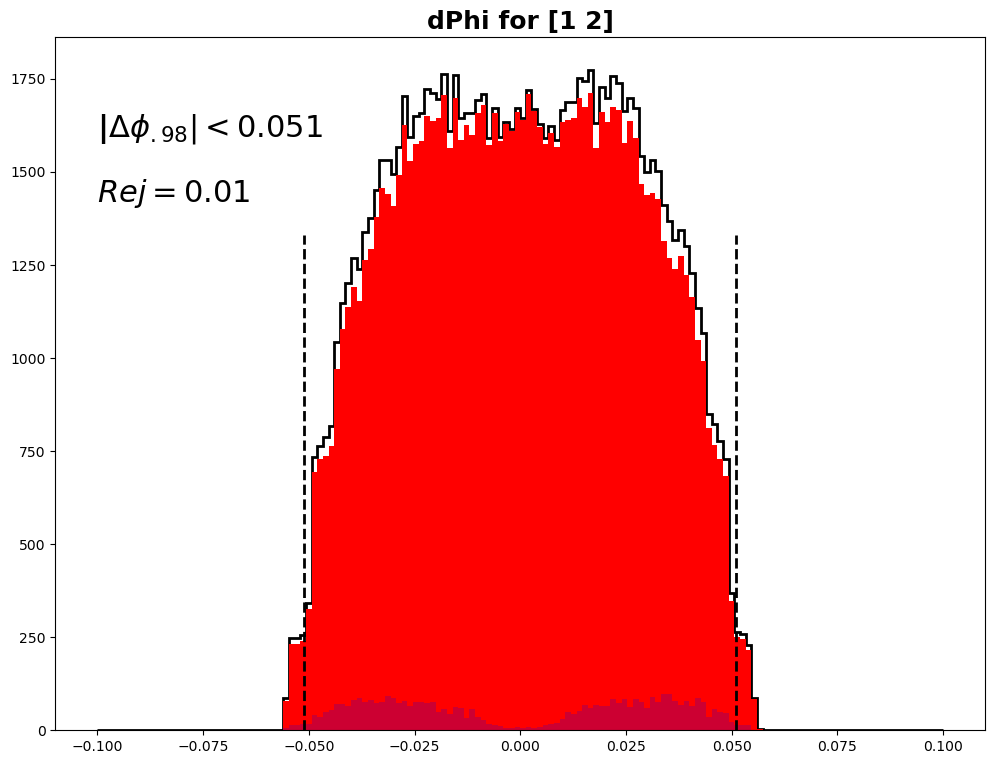

...

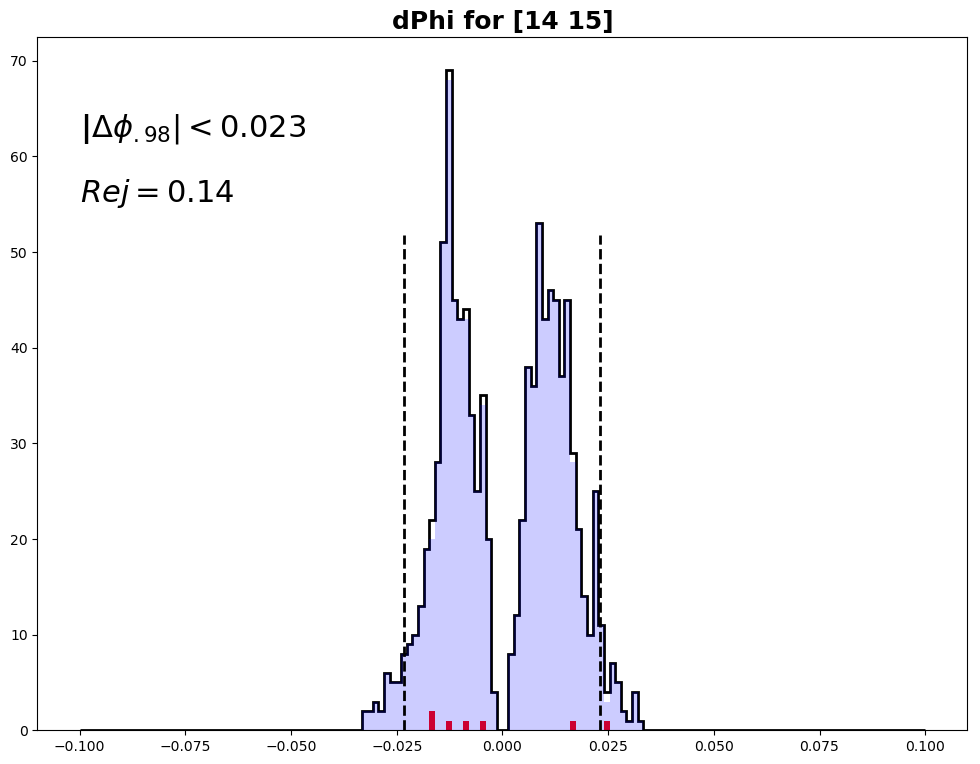

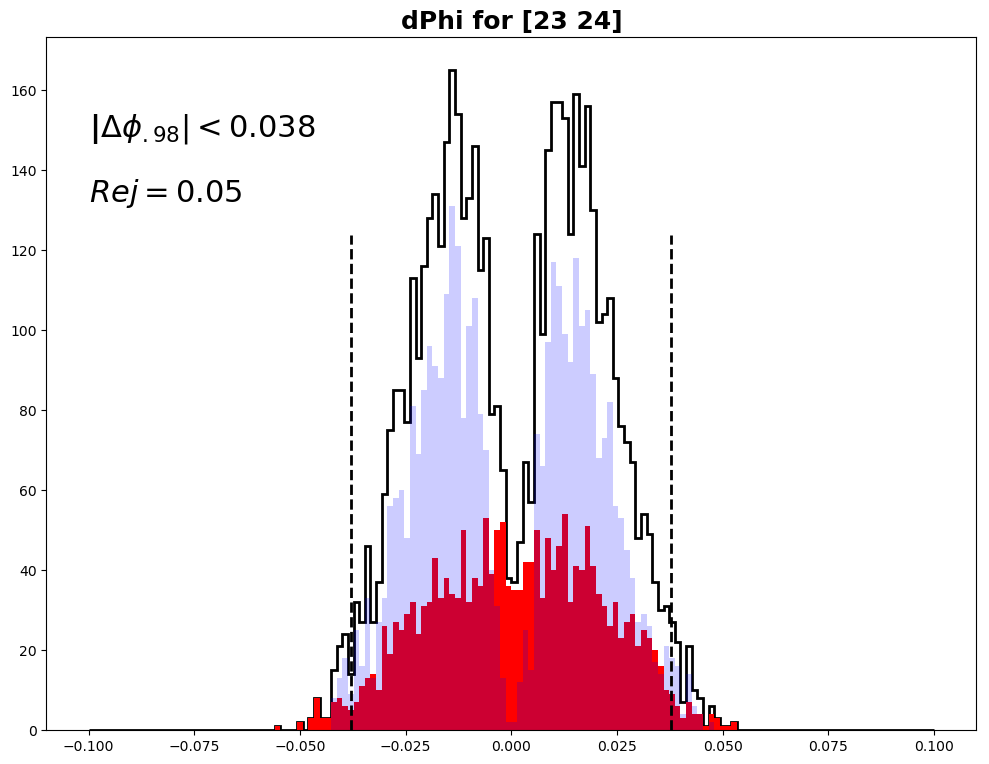

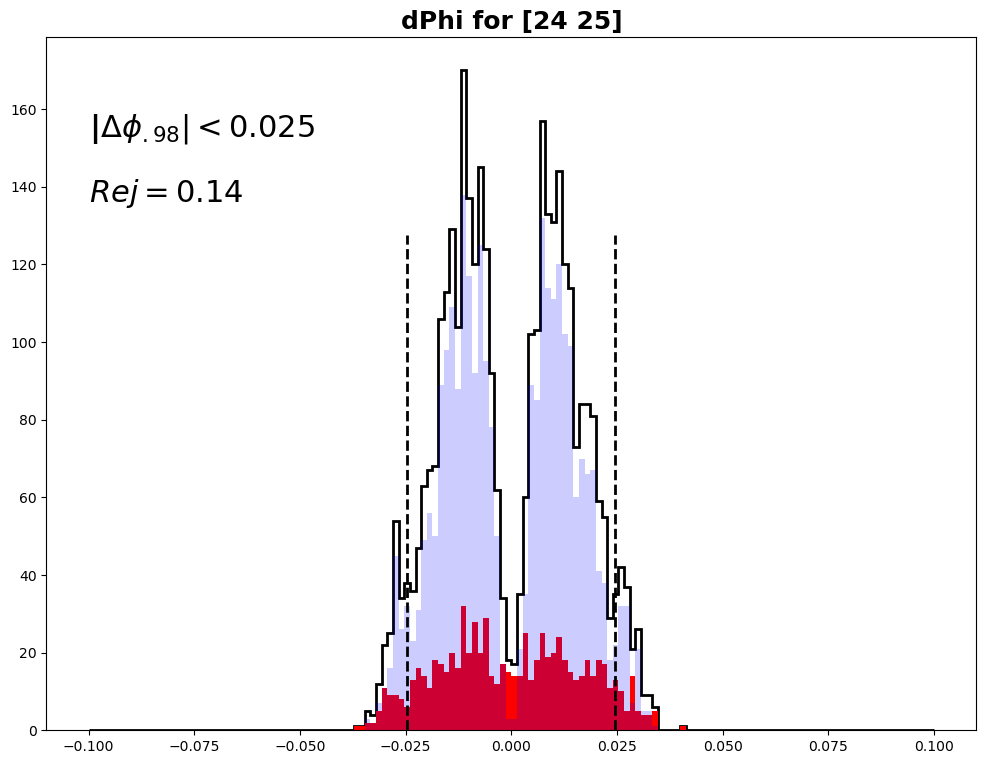

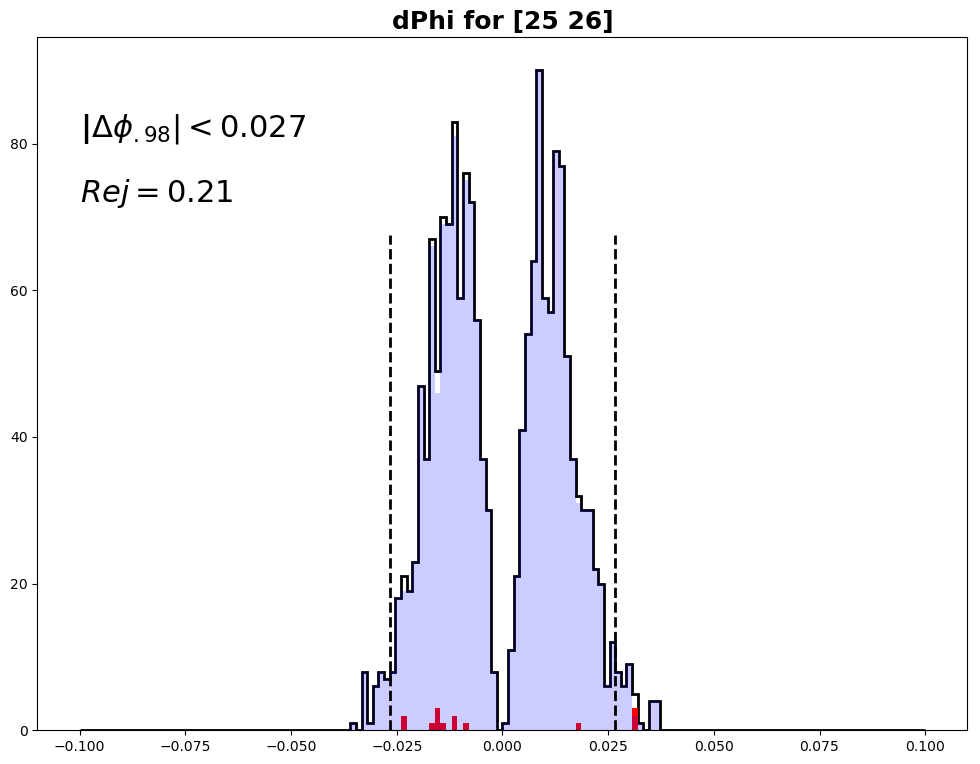

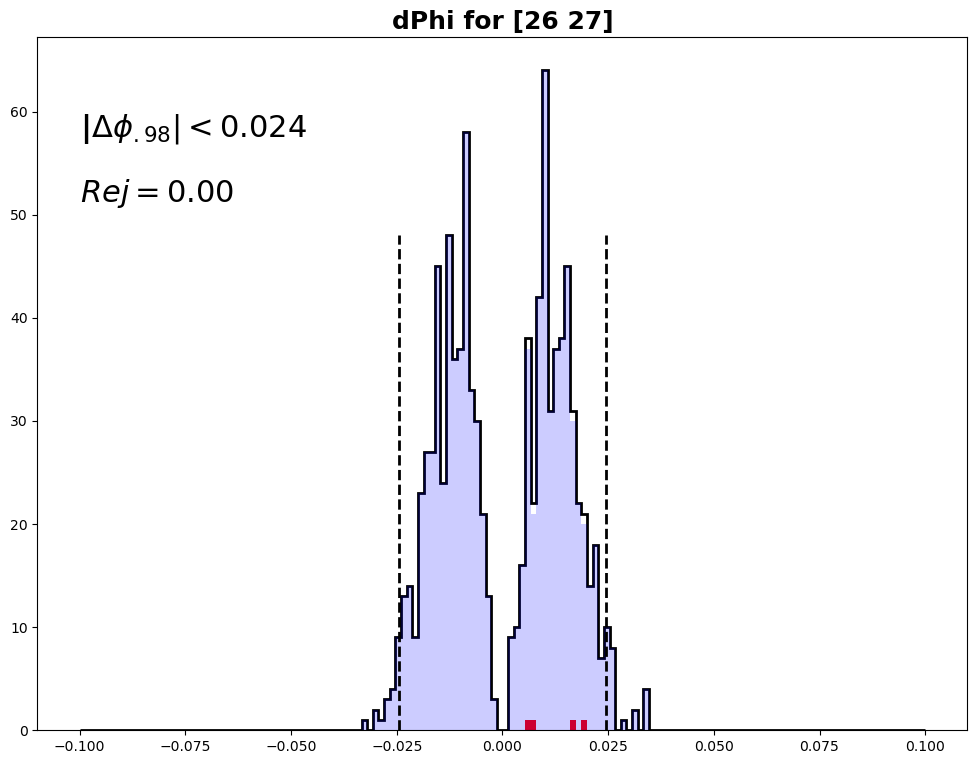

In [371]:
phi_cuts = []
thresh = 98
binning = 150
VAR = "dphi"
plt.figure(figsize=(12,9))
cut = (doublets_df["pair"] > -100)
R = 0.1
plt.title("dPhi for all",fontsize=18,fontweight="bold")
n = plt.hist(doublets_df[cut][VAR].values,bins=binning,range=(-R,R),histtype="step",lw=2,color="black");
plt.hist(doublets_df[cut & ~true_doub][VAR].values,bins=binning,range=(-R,R),color="red",alpha=1.0);
plt.hist(doublets_df[cut & true_doub][VAR].values,bins=binning,range=(-R,R),color="blue",alpha=0.2);
dphirange= doublets_df[VAR].abs() < 0.1
MIN = doublets_df[cut & true_doub & dphirange][VAR].values.min()
MAX = doublets_df[cut & true_doub & dphirange][VAR].values.max()
RAN = max(MAX,abs(MIN))
orig = len(doublets_df[cut & true_doub & dphirange][VAR].values)
orig_bad = len(doublets_df[cut & ~true_doub & dphirange])
for t in np.arange(RAN,0.0,-0.005):
    newdphirange =  doublets_df[VAR].abs() < t
    new = len(doublets_df[cut & true_doub & newdphirange][VAR].values)
    if (new/orig)<thresh/100.0:
        break
new_bad = len(doublets_df[cut & ~true_doub & newdphirange])
rej = 1.0 - new_bad/orig_bad
    
plt.text(-0.1,max(n[0])*0.9,r"|$\Delta\phi_{.%d}| < %.3f$"%(thresh,t),fontsize=22,fontweight="bold")
plt.text(-0.1,max(n[0])*0.8,r"$Rej = %.2f$"%rej,fontsize=22,fontweight="bold")

plt.plot([-t,-t],[0.0,max(n[0])*0.75],"--",color="black",lw=2)
plt.plot([t,t],[0.0,max(n[0])*0.75],"--",color="black",lw=2)
phi_cuts.append(t)

for i in tqdm_notebook(range(n_pairs)):
    
    plt.figure(figsize=(12,9))
    cut = (doublets_df["pair"] == i)
    R = 0.1
    plt.title("dPhi for %s"%(layer_pairs[i]),fontsize=18,fontweight="bold")
    n = plt.hist(doublets_df[cut][VAR].values,bins=binning,range=(-R,R),histtype="step",lw=2,color="black");
    plt.hist(doublets_df[cut & ~true_doub][VAR].values,bins=binning,range=(-R,R),color="red",alpha=1.0);
    plt.hist(doublets_df[cut & true_doub][VAR].values,bins=binning,range=(-R,R),color="blue",alpha=0.2);
    dphirange= doublets_df[VAR].abs() < 0.1
    MIN = doublets_df[cut & true_doub & dphirange][VAR].values.min()
    MAX = doublets_df[cut & true_doub & dphirange][VAR].values.max()
    RAN = max(MAX,abs(MIN))
    orig = float(len(doublets_df[cut & true_doub & dphirange]))
    orig_bad = float(len(doublets_df[cut & ~true_doub & dphirange]))
    for t in np.arange(RAN,0.0,-0.005):
        newdphirange =  doublets_df[VAR].abs() < t
        new = float(len(doublets_df[cut & true_doub & newdphirange][VAR].values))
        
        if (new/orig)<thresh/100.0:
            break
    new_bad = float(len(doublets_df[cut & ~true_doub & newdphirange]))
    rej = 1.0 - new_bad/orig_bad
    
    plt.text(-0.1,max(n[0])*0.9,r"|$\Delta\phi_{.%d}| < %.3f$"%(thresh,t),fontsize=22,fontweight="bold")
    plt.text(-0.1,max(n[0])*0.8,r"$Rej = %.2f$"%rej,fontsize=22,fontweight="bold")
    
    plt.plot([-t,-t],[0.0,max(n[0])*0.75],"--",color="black",lw=2)
    plt.plot([t,t],[0.0,max(n[0])*0.75],"--",color="black",lw=2)

    phi_cuts.append(t)

0.27584615384615385
[ 230.   498.5  767.  1035.5 1304.  1572.5 1841.  2109.5 2378.  2646.5
 2915.  3183.5 3452.  3720.5 3989.  4257.5 4526.  4794.5 5063.  5331.5
 5600. ]


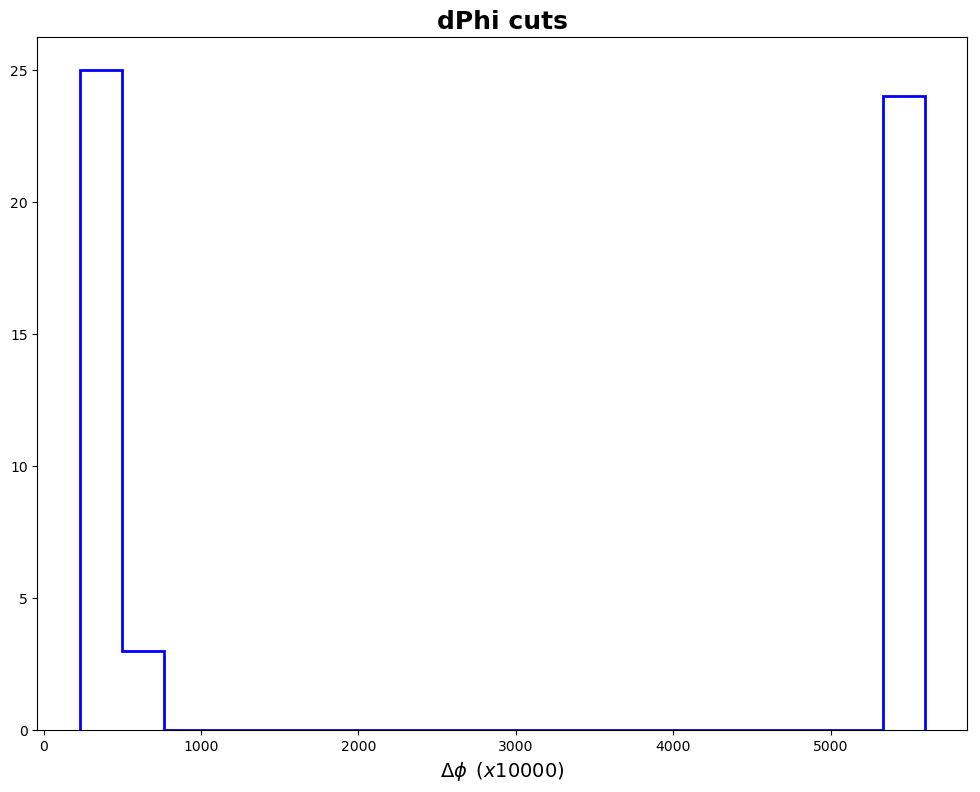

In [394]:
phi_cuts = np.round(phi_cuts,decimals=3)
plt.title("dPhi cuts",fontsize=18,fontweight="bold")
n = plt.hist(phi_cuts*10000,bins=20,histtype="step",lw=2,color="blue");
plt.xlabel(r"$\Delta \phi \,\,\, (x10000)$",fontsize=14)
print(phi_cuts.mean())
print(n[1])

In [396]:
limits = [320,560,708,852,960]
names = ["phi0p032", "phi0p056", "phi0p070", "phi0p085", "phi0p096"]
lim_nam = dict(zip(limits,names))
phi_cuts[phi_cuts>0.056] = 0.056
phiCuts = []
for p in phi_cuts*10000:
    for l in limits:
        if p<=l:
            phiCuts.append(lim_nam[l])
            break
print(phiCuts)

['phi0p056', 'phi0p056', 'phi0p056', 'phi0p056', 'phi0p056', 'phi0p056', 'phi0p056', 'phi0p032', 'phi0p032', 'phi0p032', 'phi0p032', 'phi0p032', 'phi0p032', 'phi0p032', 'phi0p032', 'phi0p032', 'phi0p032', 'phi0p032', 'phi0p032', 'phi0p032', 'phi0p032', 'phi0p056', 'phi0p056', 'phi0p056', 'phi0p056', 'phi0p056', 'phi0p056', 'phi0p056', 'phi0p056', 'phi0p056', 'phi0p056', 'phi0p056', 'phi0p056', 'phi0p056', 'phi0p056', 'phi0p056', 'phi0p056', 'phi0p056', 'phi0p056', 'phi0p056', 'phi0p056', 'phi0p056', 'phi0p056', 'phi0p056', 'phi0p056', 'phi0p032', 'phi0p032', 'phi0p032', 'phi0p056', 'phi0p032', 'phi0p032', 'phi0p032']


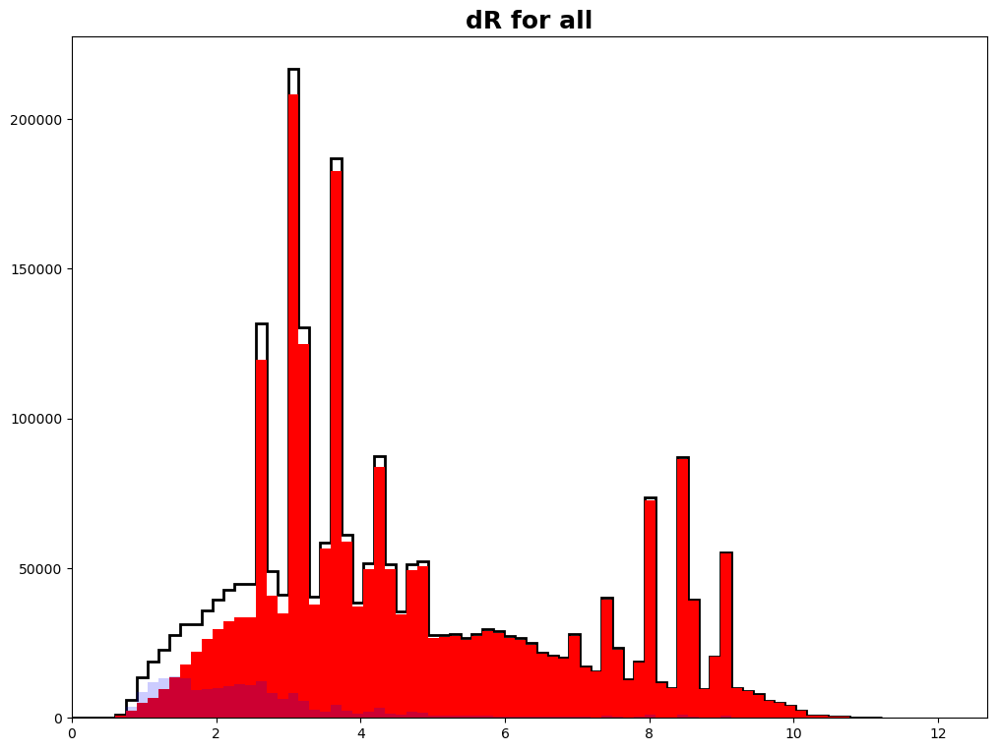

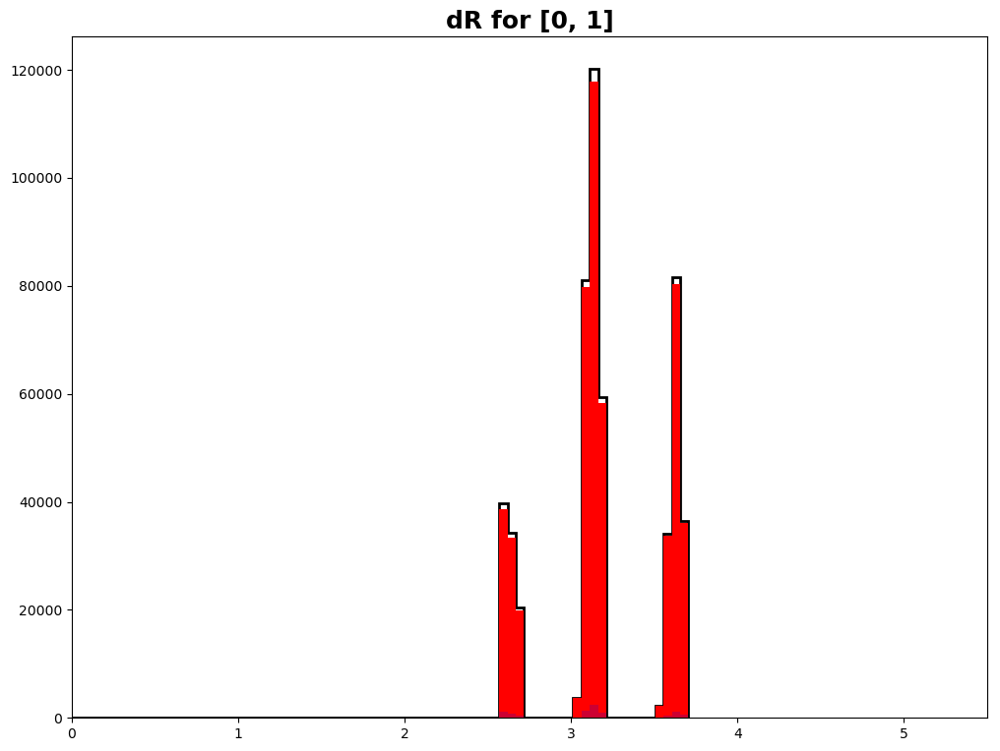

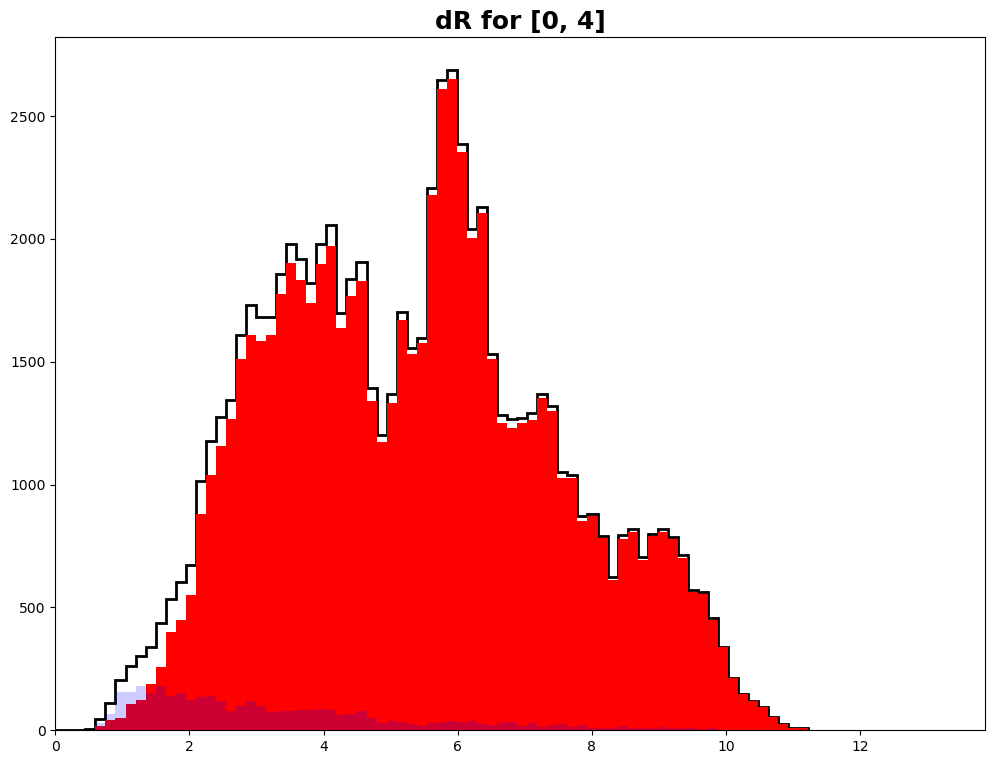

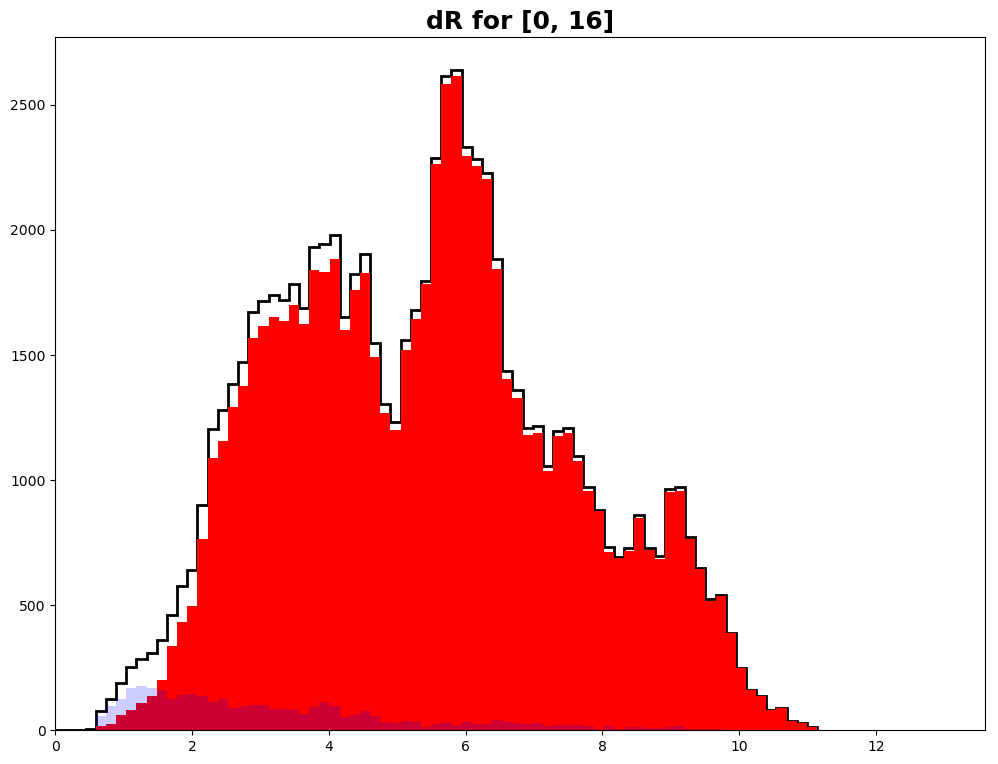

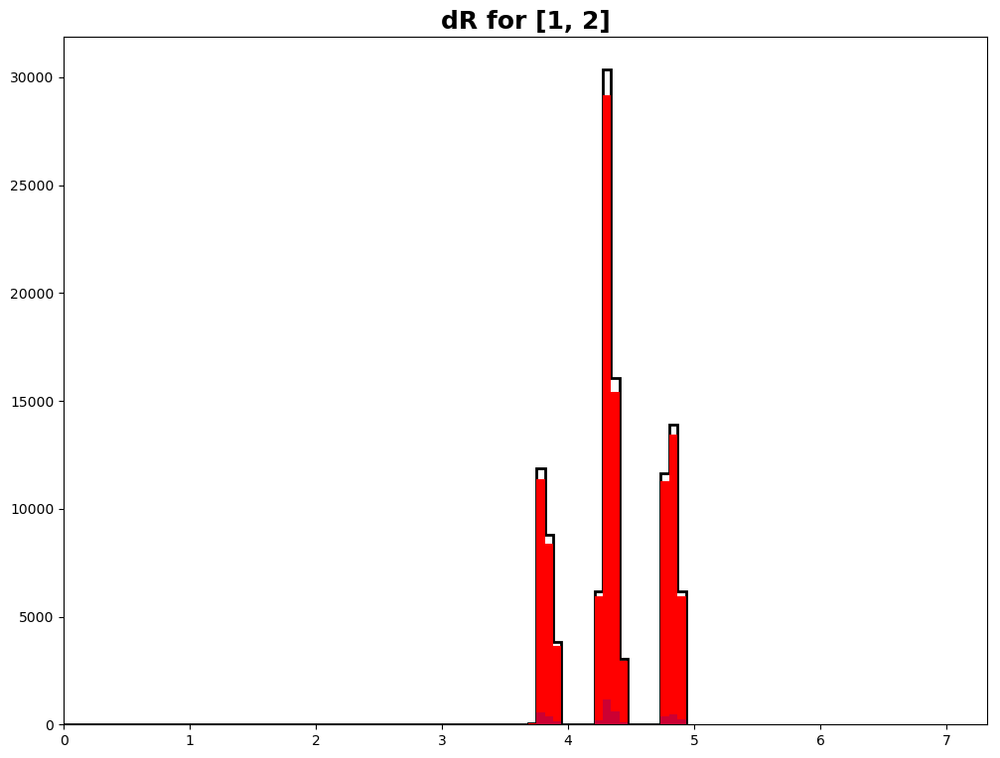

...

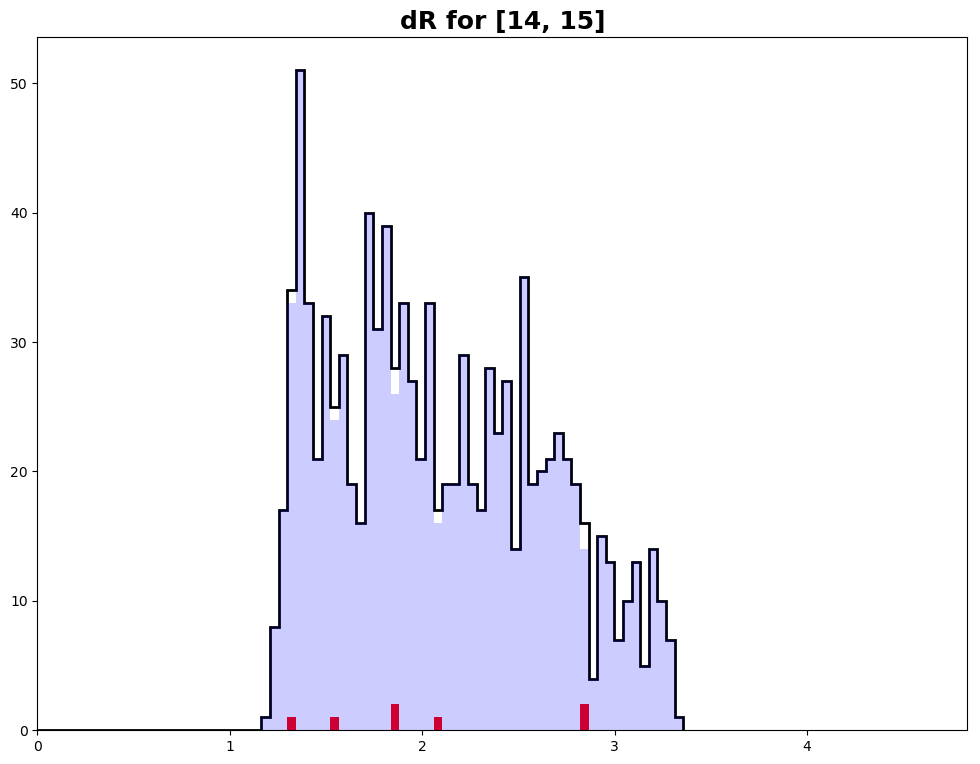

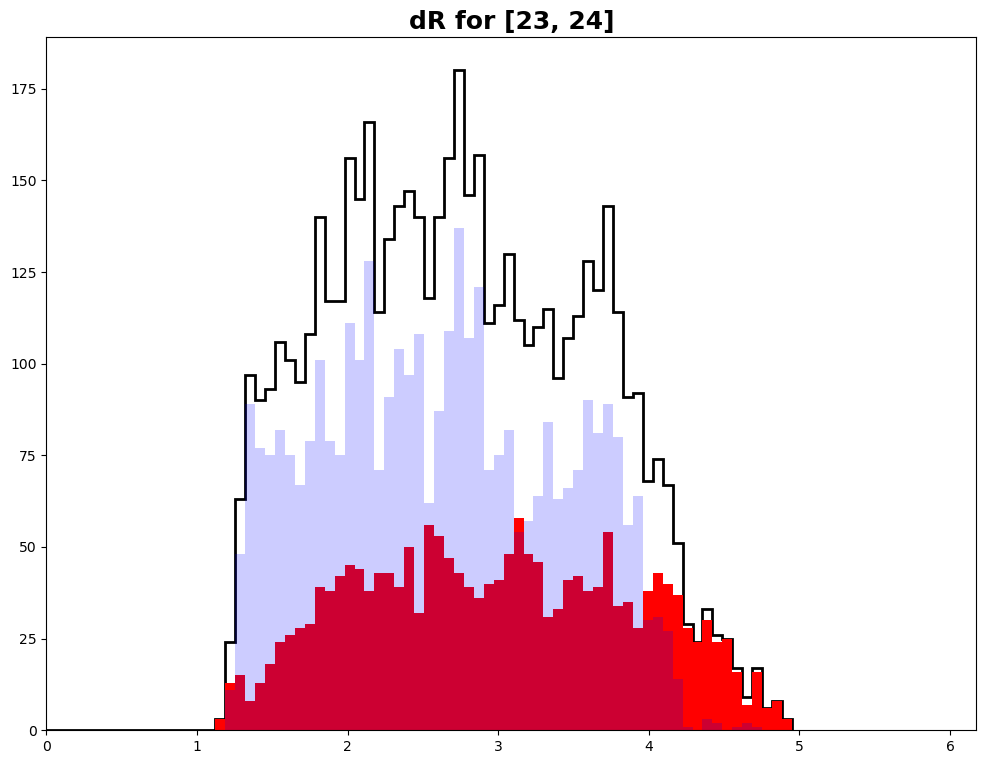

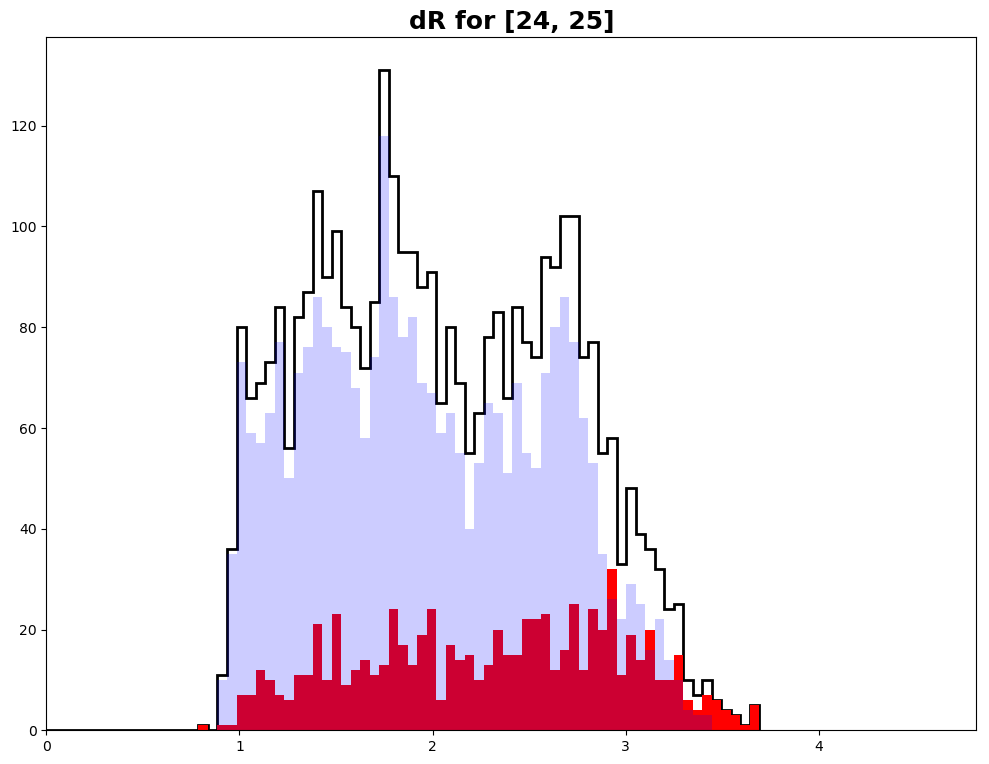

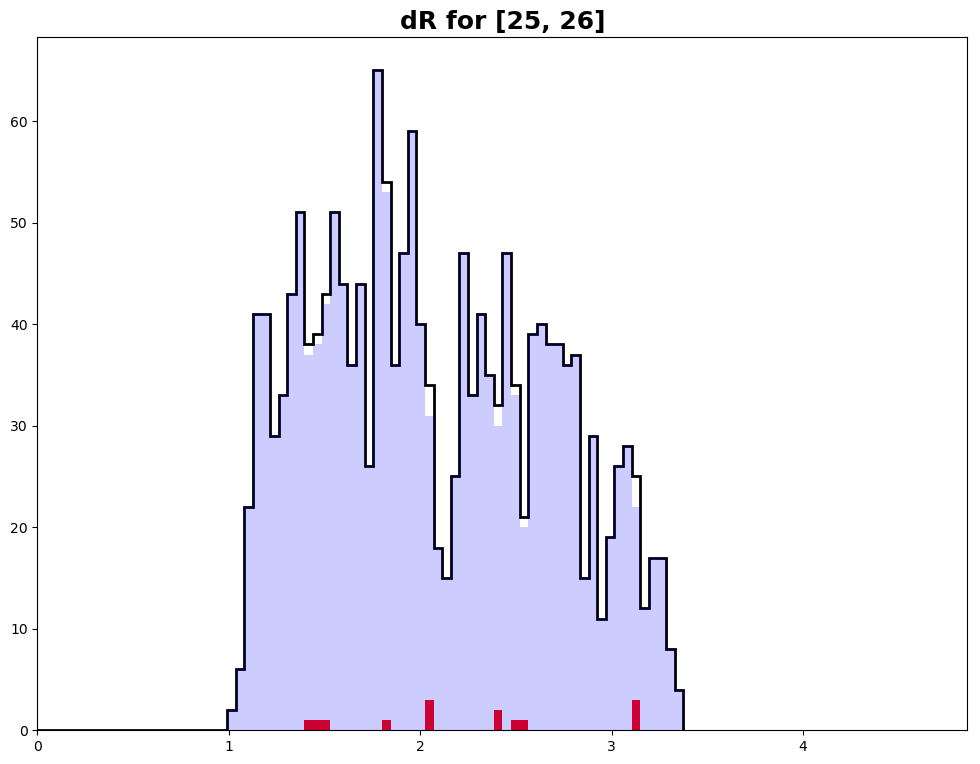

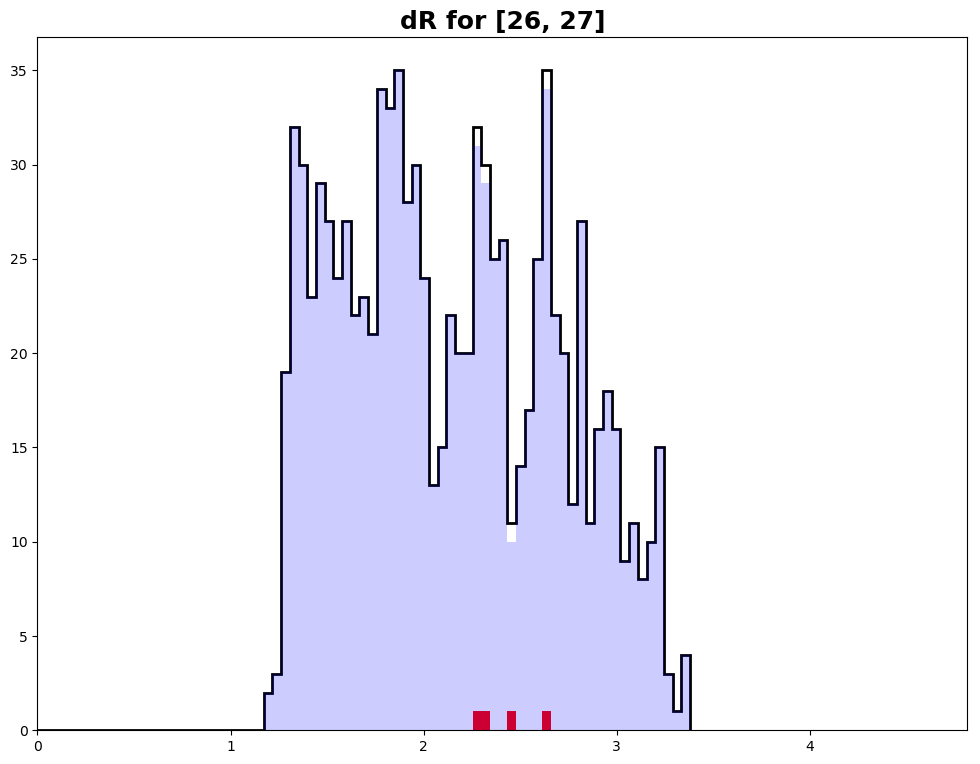

In [108]:
thresh = 99
binning = 150
r_max = []
VAR = "dr"
cut = (doublets_df["pair"] > -100)
plt.figure(figsize=(12,9))
plt.title("dR for all",fontsize=18,fontweight="bold")
R = doublets_df[VAR].values.max()
n = plt.hist(doublets_df[VAR].values,bins=binning,range=(-R,R),histtype="step",lw=2,color="black");
plt.hist(doublets_df[~true_doub][VAR].values,bins=binning,range=(-R,R),color="red",alpha=1.0);
plt.hist(doublets_df[true_doub][VAR].values,bins=binning,range=(-R,R),color="blue",alpha=0.2);
dphirange= doublets_df[VAR].abs() < 0.1
MIN = doublets_df[true_doub][VAR].values.min()
MAX = doublets_df[true_doub][VAR].values.max()
RAN = max(MAX,abs(MIN))

orig = float(len(doublets_df[true_doub][VAR].values))
for t in np.arange(RAN,0.0,-RAN/100):
    newrange =  doublets_df[VAR].abs() < t
    new = float(len(doublets_df[true_doub & newrange][VAR].values))
    if (new/orig)<thresh/100.0:
        break

#plt.text(t,max(n[0])*0.9,r"|$\Delta R_{.%d}| < %.3f$"%(thresh,t),fontsize=22,fontweight="bold")
#plt.text(t,max(n[0])*0.8,r"$Rej = %.2f$"%rej,fontsize=22,fontweight="bold")

#plt.plot([t,t],[0.0,max(n[0])*0.75],"--",color="black",lw=2)
plt.xlim(0.0,t*1.5)


for i in tqdm_notebook(range(n_pairs)):
    VAR = "dr"
    plt.figure(figsize=(12,9))
    cut = (doublets_df["pair"] == i)
    plt.title("dR for %s"%(layer_pairs[i]),fontsize=18,fontweight="bold")
    R = doublets_df[cut][VAR].values.max()
    n = plt.hist(doublets_df[cut][VAR].values,bins=binning,range=(-R,R),histtype="step",lw=2,color="black");
    plt.hist(doublets_df[cut & ~true_doub][VAR].values,bins=binning,range=(-R,R),color="red",alpha=1.0);
    plt.hist(doublets_df[cut & true_doub][VAR].values,bins=binning,range=(-R,R),color="blue",alpha=0.2);
    dphirange= doublets_df[VAR].abs() < 0.1
    MIN = doublets_df[cut & true_doub][VAR].values.min()
    MAX = doublets_df[cut & true_doub][VAR].values.max()
    RAN = max(MAX,abs(MIN))

    orig = float(len(doublets_df[cut & true_doub][VAR].values))
    for t in np.arange(MAX,0.0,-MAX/100):
        newrange =  doublets_df[VAR] < t
        new = float(len(doublets_df[cut & true_doub & newrange][VAR].values))
        if (new/orig)<thresh/100.0:
            break
    r_max.append(MAX)      
    #plt.text(t,max(n[0])*0.9,r"|$\Delta R_{.%d}| < %.3f$"%(thresh,t),fontsize=22,fontweight="bold")
    #plt.text(t,max(n[0])*0.8,r"$Rej = %.2f$"%rej,fontsize=22,fontweight="bold")
    
    #plt.plot([t,t],[0.0,max(n[0])*0.75],"--",color="black",lw=2)
    plt.xlim(0.0,t*1.5)

In [109]:
np.round(np.array(r_max)+0.5)*1.5


array([ 6. , 15. , 15. ,  7.5, 16.5, 16.5, 10.5, 12. , 10.5,  7.5,  7.5,
        7.5,  7.5, 12. , 12. , 10.5,  9. ,  7.5,  7.5,  6. , 13.5, 16.5,
       16.5, 15. , 16.5, 16.5, 15. , 15. , 15. , 13.5, 12. , 10.5, 16.5,
       15. , 15. , 13.5, 13.5, 12. , 12. , 16.5,  7.5,  9. ,  9. ,  7.5,
        6. ,  6. ,  6. ,  7.5,  6. ,  6. ,  6. ])

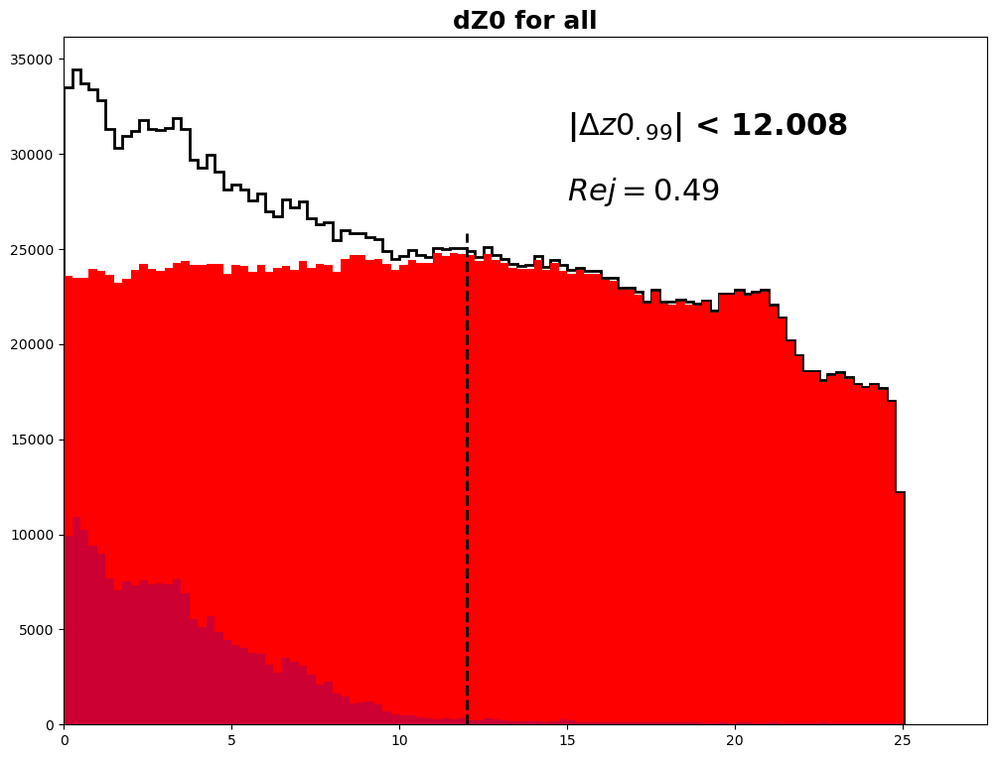

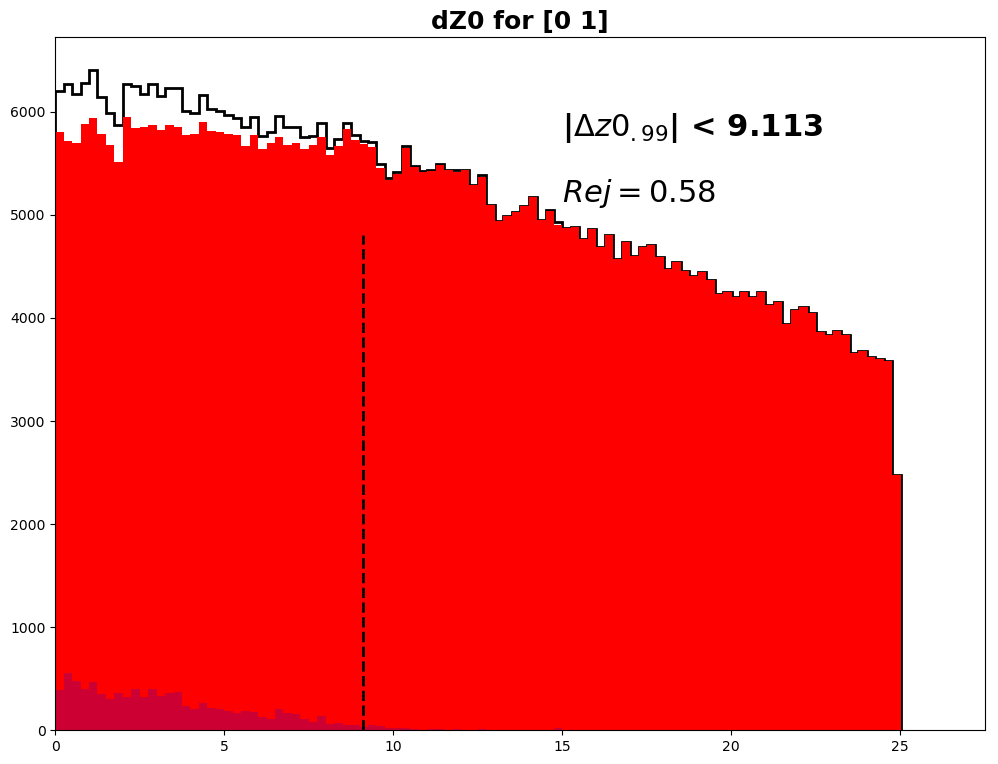

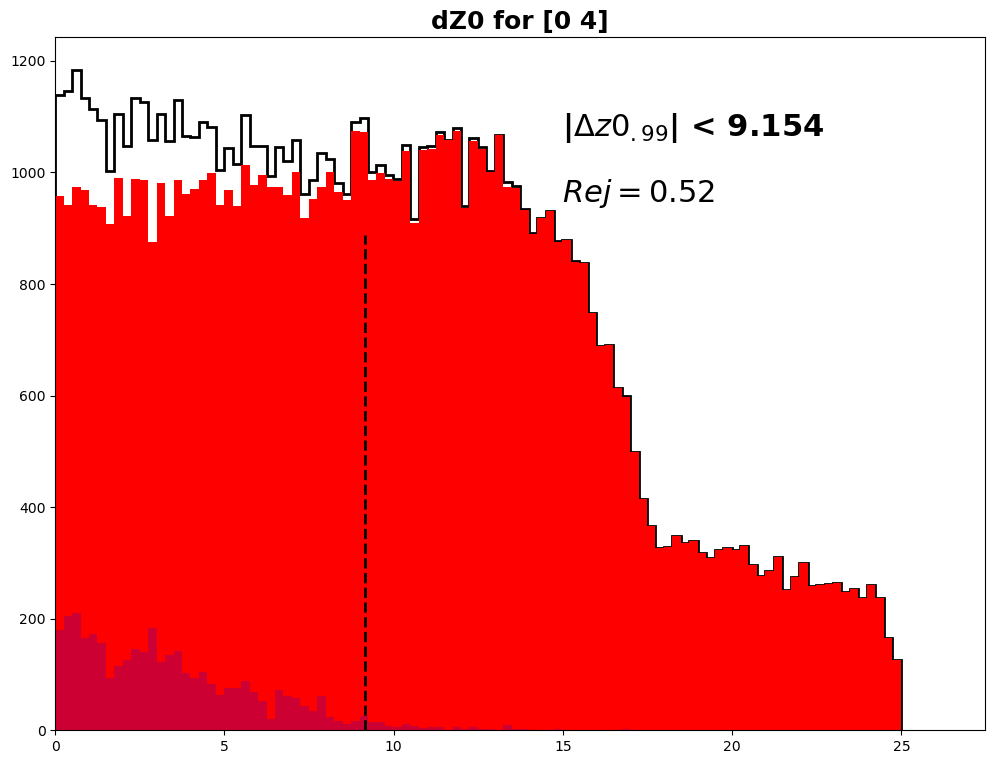

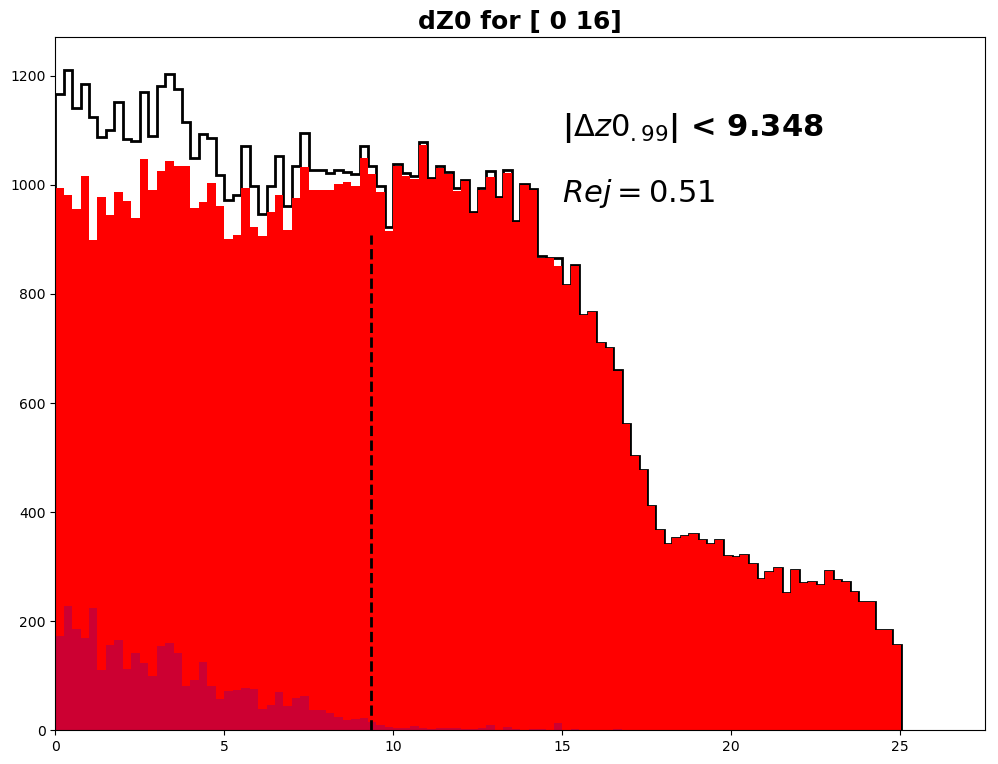

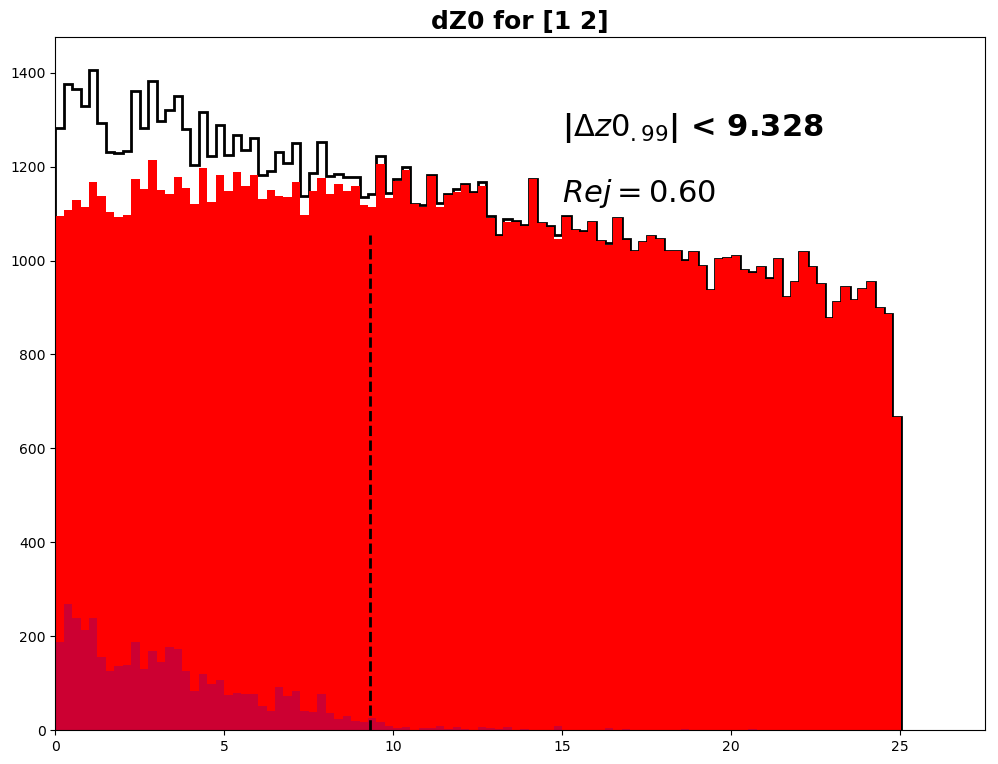

...

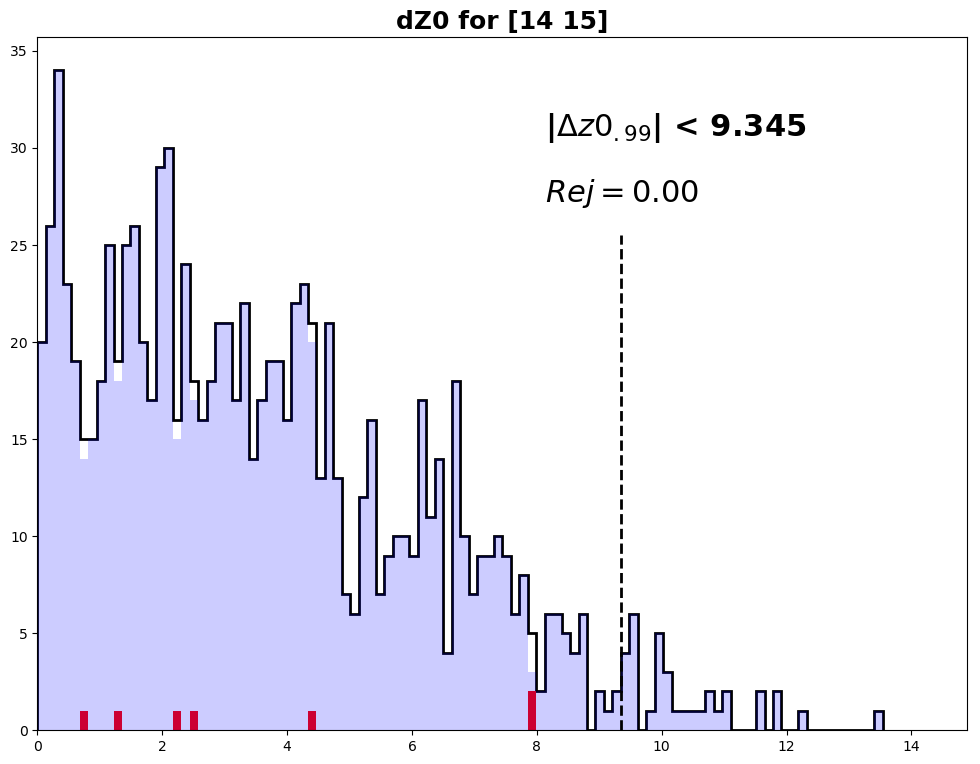

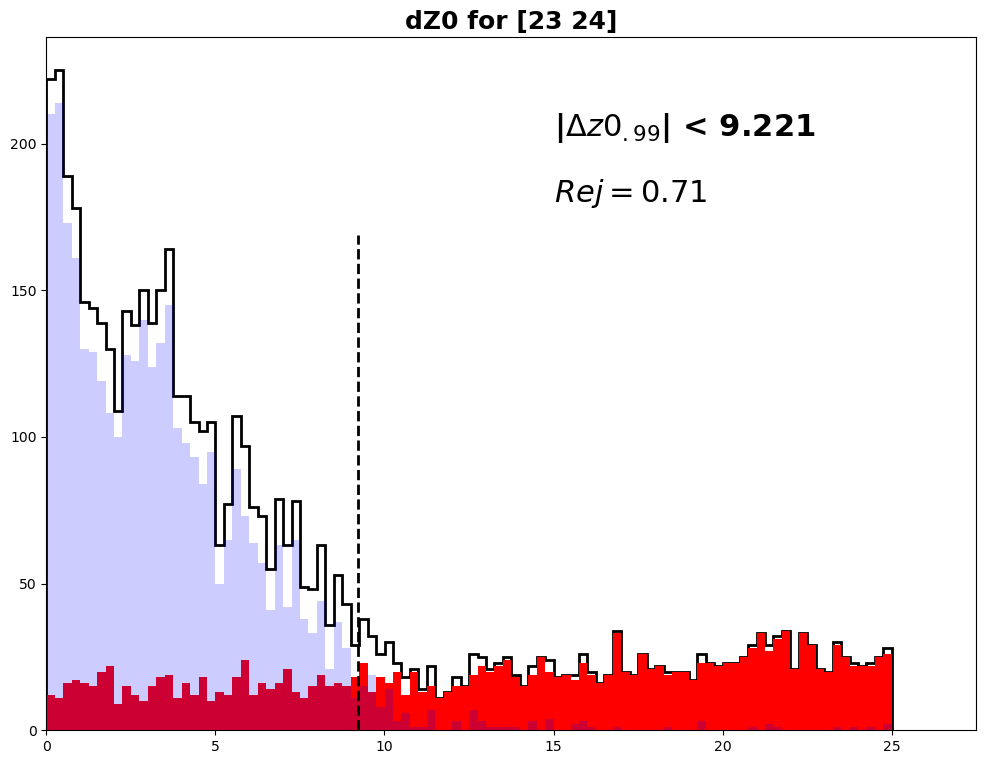

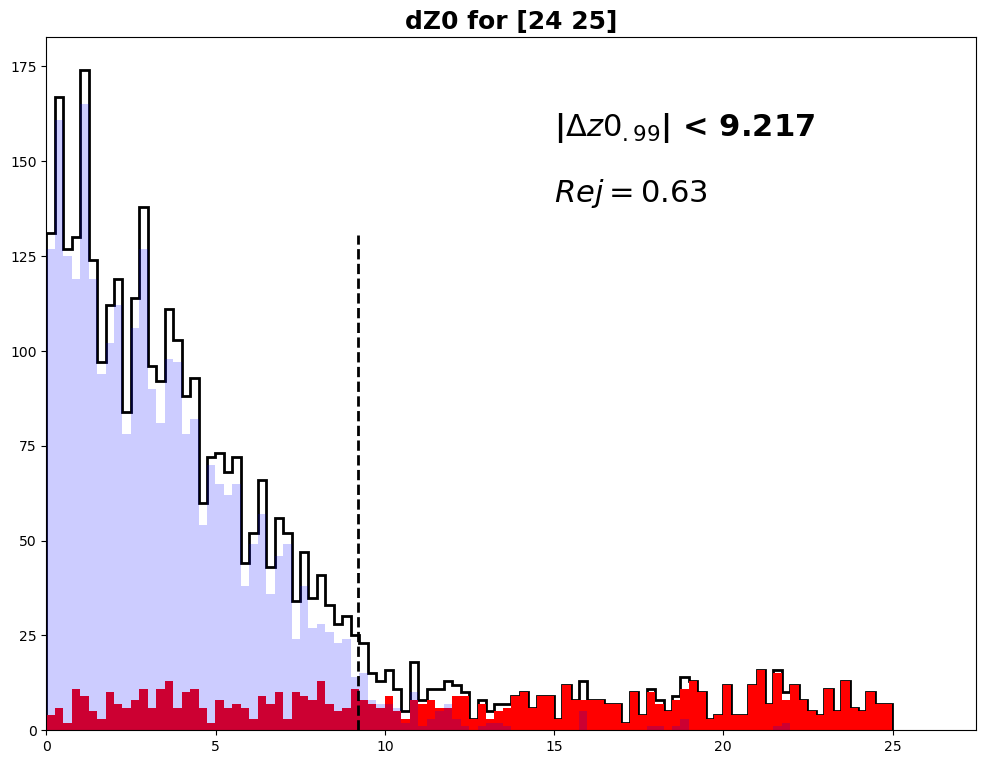

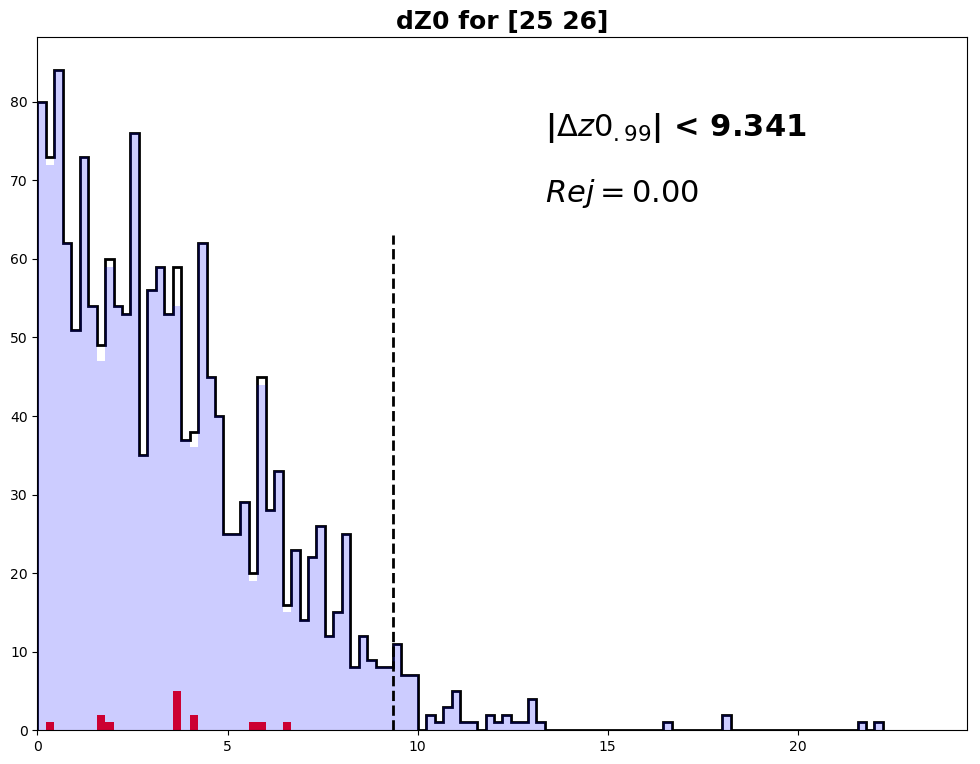

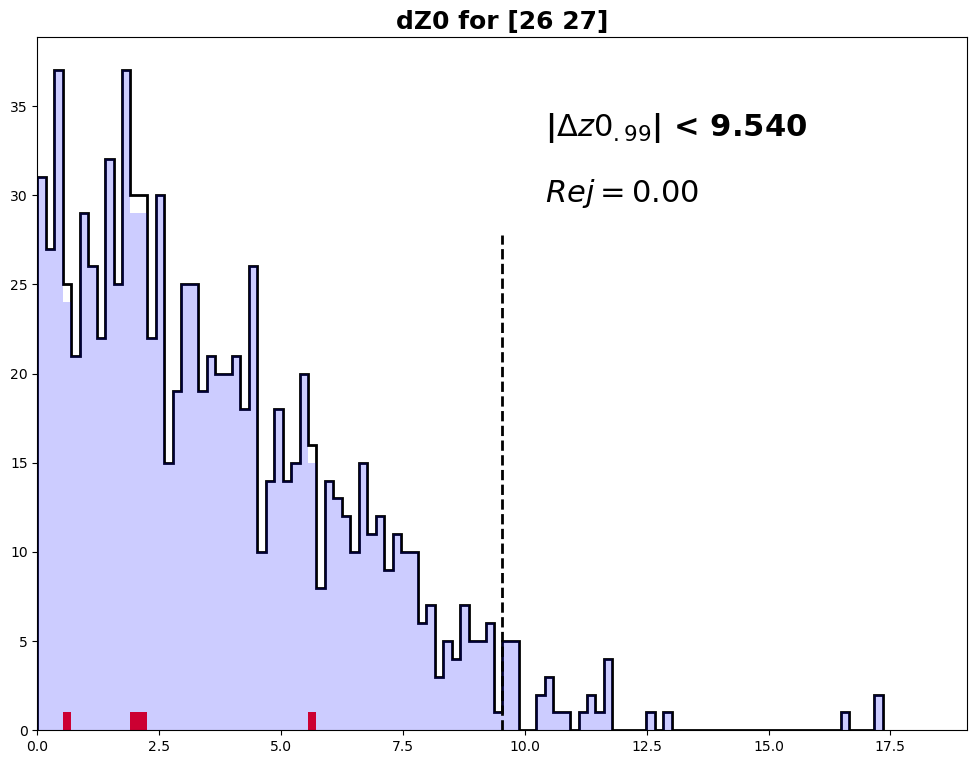

In [369]:
z0_cuts = []
thresh = 97
binning = 100
VAR = "z0"
cut = (doublets_df["pair"] > -100)
plt.figure(figsize=(12,9))
plt.title("dZ0 for all",fontsize=18,fontweight="bold")
R = doublets_df[cut][VAR].values.max()
n = plt.hist(doublets_df[cut][VAR].values,bins=binning,range=(0.0,R),histtype="step",lw=2,color="black");
plt.hist(doublets_df[cut & ~true_doub][VAR].values,bins=binning,range=(0.0,R),color="red",alpha=1.0);
plt.hist(doublets_df[cut & true_doub][VAR].values,bins=binning,range=(0.0,R),color="blue",alpha=0.2);
MAX = doublets_df[cut & true_doub][VAR].values.max()
orig = float(len(doublets_df[cut & true_doub][VAR].values))
orig_bad = float(len(doublets_df[cut & ~true_doub]))
for t in np.arange(MAX,0.0,-MAX/50):
    newrange =  doublets_df[VAR] < t
    new = float(len(doublets_df[cut & true_doub & newrange][VAR].values))
    if (new/orig)<thresh/100.0:
        break
new_bad = float(len(doublets_df[cut & ~true_doub & newrange]))
rej = 1.0 - new_bad/orig_bad
plt.text(R*0.6,max(n[0])*0.9,r"|$\Delta z0_{.99}$| < %.3f"%t,fontsize=22,fontweight="bold")
plt.text(R*0.6,max(n[0])*0.8,r"$Rej = %.2f$"%rej,fontsize=22,fontweight="bold")

plt.plot([-t,-t],[0.0,max(n[0])*0.75],"--",color="black",lw=2)
plt.plot([t,t],[0.0,max(n[0])*0.75],"--",color="black",lw=2)
plt.xlim(0.0,R*1.1)

for i in tqdm_notebook(range(n_pairs)):
    VAR = "z0"
    plt.figure(figsize=(12,9))
    cut = (doublets_df["pair"] == i)
    plt.title("dZ0 for %s"%(layer_pairs[i]),fontsize=18,fontweight="bold")
    R = doublets_df[cut][VAR].values.max()
    n = plt.hist(doublets_df[cut][VAR].values,bins=binning,range=(0.0,R),histtype="step",lw=2,color="black");
    plt.hist(doublets_df[cut & ~true_doub][VAR].values,bins=binning,range=(0.0,R),color="red",alpha=1.0);
    plt.hist(doublets_df[cut & true_doub][VAR].values,bins=binning,range=(0.0,R),color="blue",alpha=0.2);
    MAX = doublets_df[cut & true_doub][VAR].values.max()
    orig = float(len(doublets_df[cut & true_doub][VAR].values))
    orig_bad = float(len(doublets_df[cut & ~true_doub]))
    for t in np.arange(MAX,0.0,-MAX/100):
        newrange =  doublets_df[VAR] < t
        new = float(len(doublets_df[cut & true_doub & newrange][VAR].values))
        if (new/orig)<thresh/100.0:
            break
    new_bad = float(len(doublets_df[cut & ~true_doub & newrange]))
    rej = 1.0 - new_bad/orig_bad 
    
    plt.text(R*0.6,max(n[0])*0.9,r"|$\Delta z0_{.99}$| < %.3f"%t,fontsize=22,fontweight="bold")
    plt.text(R*0.6,max(n[0])*0.8,r"$Rej = %.2f $"%rej,fontsize=22,fontweight="bold")
    
    plt.plot([-t,-t],[0.0,max(n[0])*0.75],"--",color="black",lw=2)
    plt.plot([t,t],[0.0,max(n[0])*0.75],"--",color="black",lw=2)
    plt.xlim(0.0,R*1.1)
    z0_cuts.append(t)

0.05178846153846153
[ 9.    9.75 10.5  11.25 12.   12.75 13.5  14.25 15.   15.75 16.5  17.25
 18.   18.75 19.5  20.25 21.   21.75 22.5  23.25 24.  ]


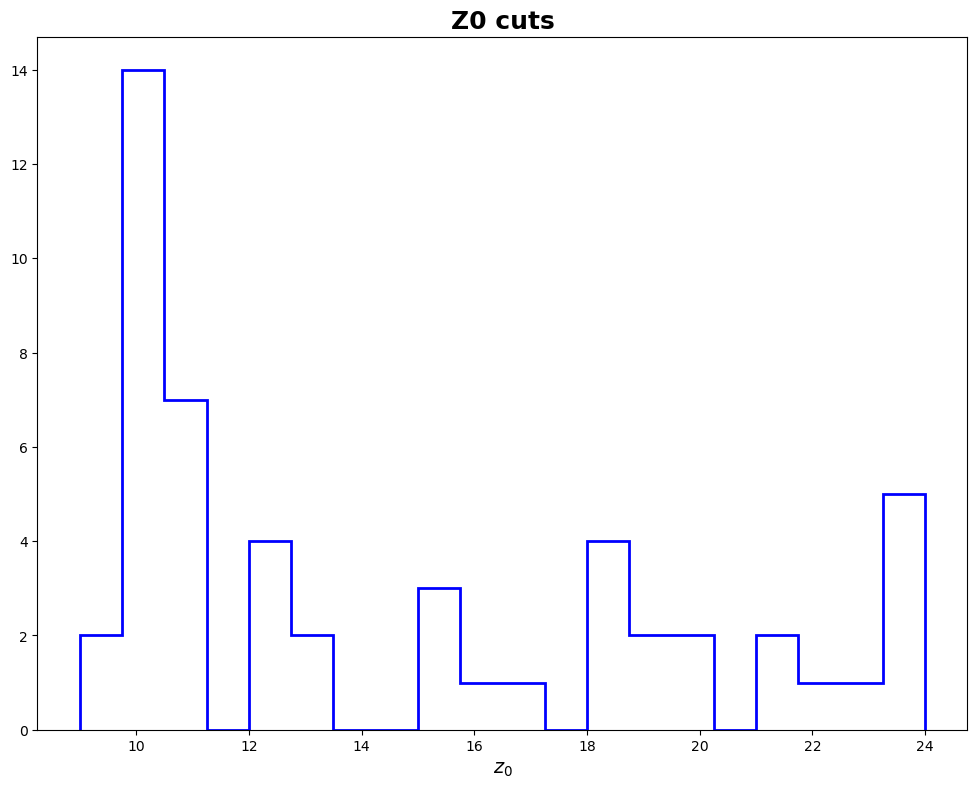

In [118]:
z0_cuts = np.round(z0_cuts)
plt.title("Z0 cuts",fontsize=18,fontweight="bold")
n = plt.hist(z0_cuts,bins=20,histtype="step",lw=2,color="blue");
plt.xlabel(r"$z_0$",fontsize=14)
print(phi_cuts.mean())
print(n[1])

In [370]:
z0_cuts = np.array(z0_cuts)
z0_cuts[z0_cuts>13.0] = 13.0

In [368]:
np.round(np.array(z0_cuts))

array([ 9., 12.,  9.,  9., 10., 10., 12., 12., 12., 10., 10.,  9.,  9.,
       12., 12., 12., 12., 10., 10.,  9.,  9., 10., 10., 10., 11., 12.,
       12., 12., 12., 12., 12., 12., 12., 12., 12., 12., 12., 12., 12.,
       12., 10., 12., 12.,  9.,  9.,  9.,  9.,  9.,  9.,  9., 10.])

In [358]:
np.round(np.array(z0_cuts))[np.round(np.array(z0_cuts))>12.0]

array([False, False, False, False, False, False,  True,  True,  True,
       False, False, False, False,  True,  True,  True, False, False,
       False, False, False, False, False, False, False, False,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True, False,  True,  True, False, False,
       False, False, False, False, False, False])

In [ ]:
thresh = 98
VARs = ["sizeX0","sizeX1","sizeY0","sizeY1"]
R = 25
binning = 50
for VAR in VARs:

    cut = (doublets_df["pair"] > -100)
    plt.figure(figsize=(12,9))
    plt.title("sizeY0 for all",fontsize=18,fontweight="bold")

    #doublets_df[cut][VAR].values.max()
    n = plt.hist(doublets_df[cut][VAR].values,bins=binning,range=(0.0,R),histtype="step",lw=2,color="black",density=True);
    plt.hist(doublets_df[cut & ~true_doub][VAR].values,bins=binning,range=(0.0,R),color="red",alpha=1.0,density=True);
    plt.hist(doublets_df[cut & true_doub][VAR].values,bins=binning,range=(0.0,R),color="blue",alpha=0.2,density=True);

    for i in tqdm_notebook(range(28)):

        plt.figure(figsize=(12,9))
        cut = (doublets_df["pair"] == i)
        plt.title("sizeY0 for %s"%(layer_pairs[i]),fontsize=18,fontweight="bold")

        n = plt.hist(doublets_df[cut][VAR].values,bins=binning,range=(0.0,R),histtype="step",lw=2,color="black",density=True);
        plt.hist(doublets_df[cut & ~true_doub][VAR].values,bins=binning,range=(0.0,R),color="red",alpha=1.0,density=True);
        plt.hist(doublets_df[cut & true_doub][VAR].values,bins=binning,range=(0.0,R),color="blue",alpha=0.2,density=True);
    

In [524]:
'''thresh = 98
VARs = ["sizeX0","sizeX1","sizeY0","sizeY1"]
R = 25#doublets_df[cut][VAR].values.max()
binning = 50
for VAR in VARs:

    cut = (doublets_df["pair"] > -100)
    plt.figure(figsize=(12,9))
    plt.title("sizeY0 for all",fontsize=18,fontweight="bold")

    n0,b = np.histogram(doublets_df[cut & ~true_doub][VAR].values,bins=binning,range=(0.0,R));
    n1,b = np.histogram(doublets_df[cut & true_doub][VAR].values,bins=binning,range=(0.0,R));
    r = n1/n0
    r[n0==0] = 0.0
    
    plt.bar(b[:-1],r,color="blue");
    
    for i in tqdm_notebook(range(28)):

        plt.figure(figsize=(12,9))
        cut = (doublets_df["pair"] == i)
        plt.title("sizeY0 for %s"%(layer_pairs[i]),fontsize=18,fontweight="bold")

        n0,b = np.histogram(doublets_df[cut & ~true_doub][VAR].values,bins=binning,range=(0.0,R));
        n1,b = np.histogram(doublets_df[cut & true_doub][VAR].values,bins=binning,range=(0.0,R));
        r = n1/n0
        r[n0==0] = 0.0
    
        plt.bar(b[:-1],n1/n0,color=None,edgecolor="blue");
        '''

'thresh = 98\nVARs = ["sizeX0","sizeX1","sizeY0","sizeY1"]\nR = 25#doublets_df[cut][VAR].values.max()\nbinning = 50\nfor VAR in VARs:\n\n    cut = (doublets_df["pair"] > -100)\n    plt.figure(figsize=(12,9))\n    plt.title("sizeY0 for all",fontsize=18,fontweight="bold")\n\n    n0,b = np.histogram(doublets_df[cut & ~true_doub][VAR].values,bins=binning,range=(0.0,R));\n    n1,b = np.histogram(doublets_df[cut & true_doub][VAR].values,bins=binning,range=(0.0,R));\n    r = n1/n0\n    r[n0==0] = 0.0\n    \n    plt.bar(b[:-1],r,color="blue");\n    \n    for i in tqdm_notebook(range(28)):\n\n        plt.figure(figsize=(12,9))\n        cut = (doublets_df["pair"] == i)\n        plt.title("sizeY0 for %s"%(layer_pairs[i]),fontsize=18,fontweight="bold")\n\n        n0,b = np.histogram(doublets_df[cut & ~true_doub][VAR].values,bins=binning,range=(0.0,R));\n        n1,b = np.histogram(doublets_df[cut & true_doub][VAR].values,bins=binning,range=(0.0,R));\n        r = n1/n0\n        r[n0==0] = 0.0\n    

### Track plots

_True tracks_

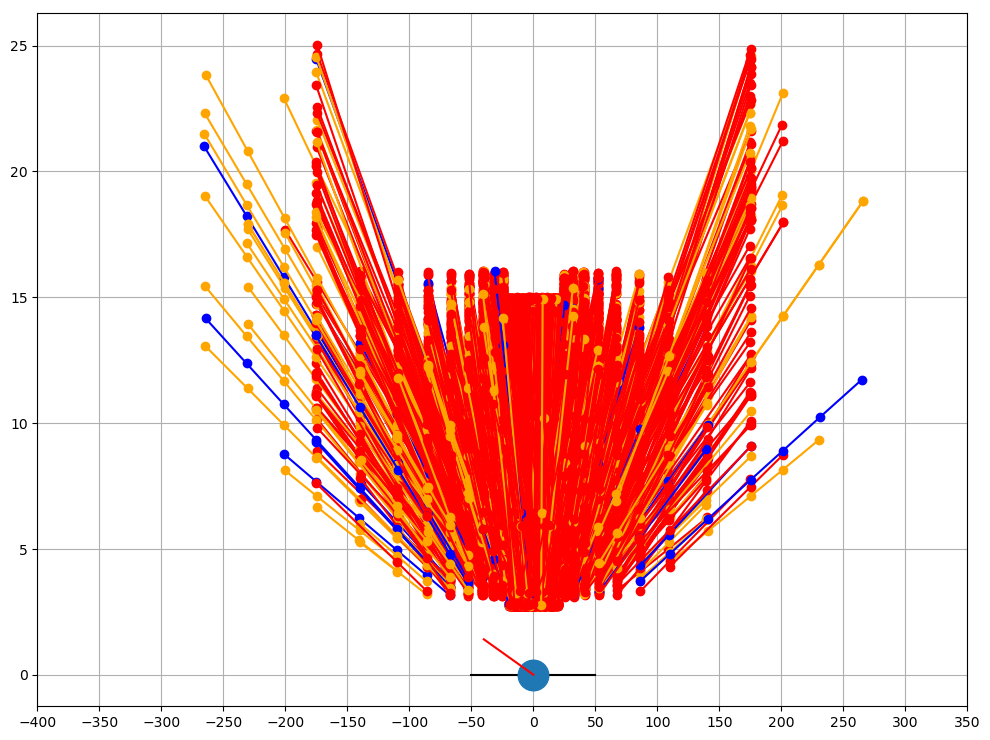

In [120]:
plt.figure(figsize=(12,9))
u = np.random.randint(0,len(tracks_val)-1,100000)
plt.plot([-50,50],[0,0],"-",color="black")
for i in tqdm_notebook(u):
    
    if(frac[i]>=0.75 and QUAL[i]==0):
        plt.plot(Zs[i][:Ns[i]],Rs[i][:Ns[i]],"-o",color="red")
    if(frac[i]>=0.75 and QUAL[i]==1):
        plt.plot(Zs[i][:Ns[i]],Rs[i][:Ns[i]],"-o",color="orange")
    if(frac[i]>=0.75 and QUAL[i]>=2):
        plt.plot(Zs[i][:Ns[i]],Rs[i][:Ns[i]],"-o",color="blue")
        
    #elif(MATCH[i]==0):
    #    plt.plot(Zs[i][:Ns[i]-1],Rs[i][:Ns[i]-1],"-o",color="red")

        
    
plt.plot([0.0],[0.0],"o",markersize=22)
plt.plot([0.0,-40.0],[0.0,1.408],"-",color="red")
#plt.plot(a["x_0"].values,a["y_0"].values,"o")
#plt.plot(a["x_1"].values,a["y_1"].values,"o")
#plt.plot(a["x_0"].values,a["y_0"].values,"o")
plt.xticks(np.arange(-400, 400, 50.0));
plt.grid(axis="both")



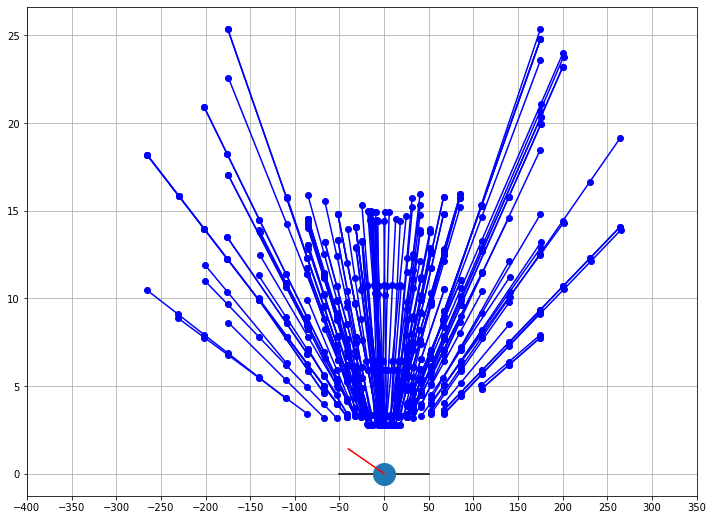

In [188]:
plt.figure(figsize=(12,9))
u = np.random.randint(0,len(tracks_val)-1,500000)
plt.plot([-50,50],[0,0],"-",color="black")
for i in tqdm_notebook(u):
    
    if(frac[i]>=0.75 and QUAL[i]>=2):
        plt.plot(Zs[i][:Ns[i]],Rs[i][:Ns[i]],"-o",color="blue")
        
    #elif(MATCH[i]==0):
    #    plt.plot(Zs[i][:Ns[i]-1],Rs[i][:Ns[i]-1],"-o",color="red")

        
    
plt.plot([0.0],[0.0],"o",markersize=22)
plt.plot([0.0,-40.0],[0.0,1.408],"-",color="red")
#plt.plot(a["x_0"].values,a["y_0"].values,"o")
#plt.plot(a["x_1"].values,a["y_1"].values,"o")
#plt.plot(a["x_0"].values,a["y_0"].values,"o")
plt.xticks(np.arange(-400, 400, 50.0));
plt.grid(axis="both")




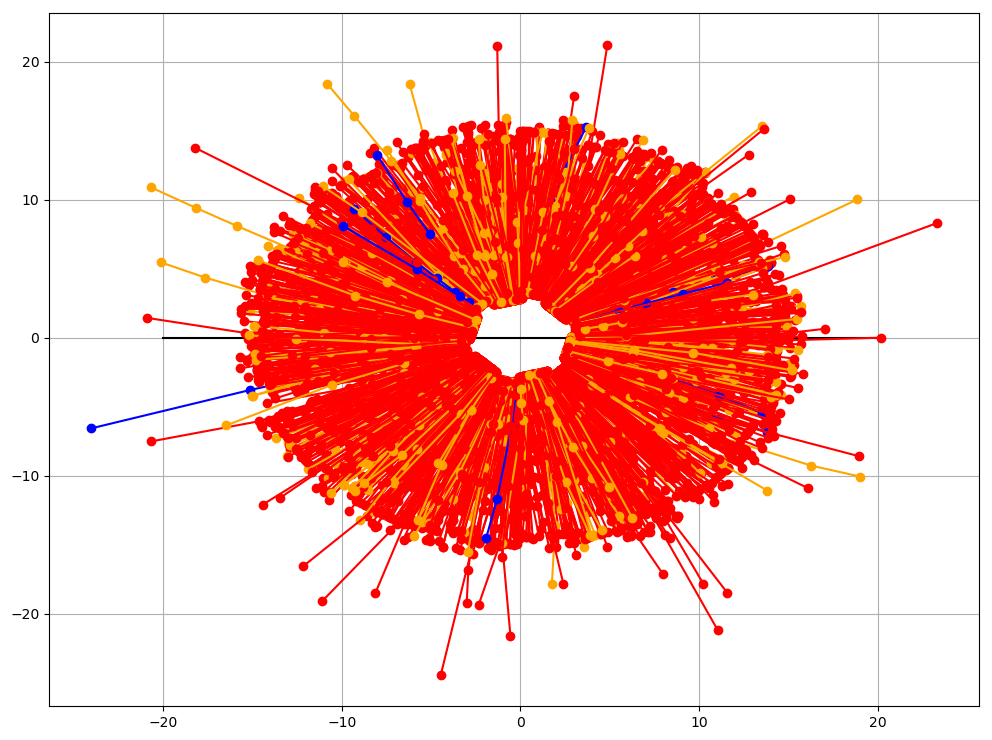

In [121]:
plt.figure(figsize=(12,9))
u = np.random.randint(0,len(tracks_val)-1,50000)

plt.plot([-20,20],[0,0],"-",color="black")
for i in tqdm_notebook(u):
    
    if(frac[i]>=0.75 and QUAL[i]==0):
        plt.plot(Xs[i][:Ns[i]],Ys[i][:Ns[i]],"-o",color="red")
    if(frac[i]>=0.75 and QUAL[i]==1):
        plt.plot(Xs[i][:Ns[i]],Ys[i][:Ns[i]],"-o",color="orange")
    if(frac[i]>=0.75 and QUAL[i]>=2):
        plt.plot(Xs[i][:Ns[i]],Ys[i][:Ns[i]],"-o",color="blue")
    #else:
    #    plt.plot(Xs[i],Ys[i],"o",color="black")

    
#plt.plot([0.0],[0.0],"o",markersize=22)
#plt.plot([0.0,-40.0],[0.0,1.408],"-",color="red")
#plt.plot(a["x_0"].values,a["y_0"].values,"o")
#plt.plot(a["x_1"].values,a["y_1"].values,"o")
#plt.plot(a["x_0"].values,a["y_0"].values,"o")
#plt.xticks(np.arange(-100, 100, 20.0));
plt.grid(axis="both")





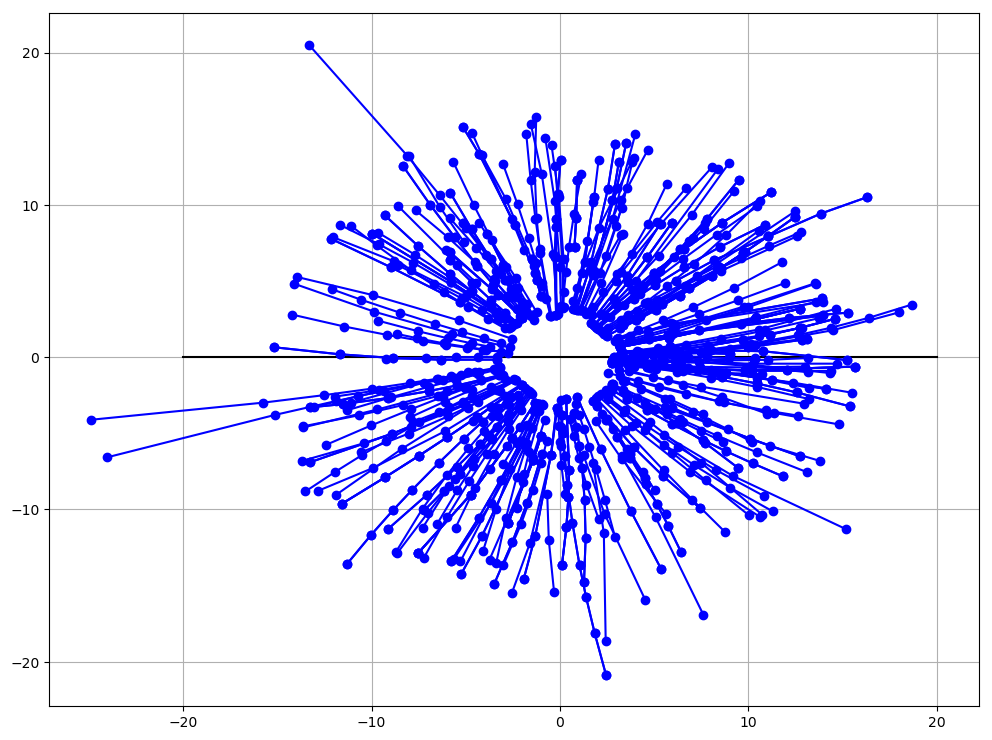

In [122]:
plt.figure(figsize=(12,9))
u = np.random.randint(0,len(tracks_val)-1,1000000)

plt.plot([-20,20],[0,0],"-",color="black")
for i in tqdm_notebook(u):
    
    if(frac[i]>=0.75 and QUAL[i]>=2):
        plt.plot(Xs[i][:Ns[i]],Ys[i][:Ns[i]],"-o",color="blue")
    #else:
    #    plt.plot(Xs[i],Ys[i],"o",color="black")

    
#plt.plot([0.0],[0.0],"o",markersize=22)
#plt.plot([0.0,-40.0],[0.0,1.408],"-",color="red")
#plt.plot(a["x_0"].values,a["y_0"].values,"o")
#plt.plot(a["x_1"].values,a["y_1"].values,"o")
#plt.plot(a["x_0"].values,a["y_0"].values,"o")
#plt.xticks(np.arange(-100, 100, 20.0));
plt.grid(axis="both")






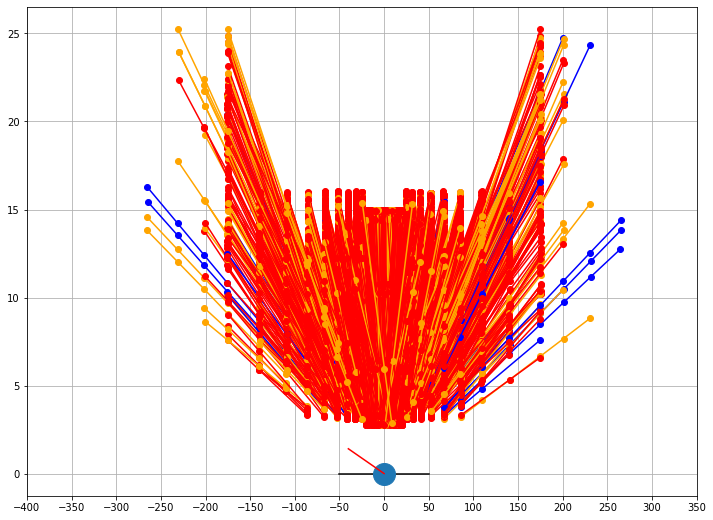

In [146]:
plt.figure(figsize=(12,9))
u = np.random.randint(0,len(tracks_val)-1,5000)
plt.plot([-50,50],[0,0],"-",color="black")
for i in tqdm_notebook(u):
    
    if(frac[i]<0.75 and QUAL[i]==0):
        plt.plot(Zs[i][:Ns[i]],Rs[i][:Ns[i]],"-o",color="red")
    if(frac[i]<0.75 and QUAL[i]==1):
        plt.plot(Zs[i][:Ns[i]],Rs[i][:Ns[i]],"-o",color="orange")
    if(frac[i]<0.75 and QUAL[i]>=2):
        plt.plot(Zs[i][:Ns[i]],Rs[i][:Ns[i]],"-o",color="blue")
        
    #elif(MATCH[i]==0):
    #    plt.plot(Zs[i][:Ns[i]-1],Rs[i][:Ns[i]-1],"-o",color="red")

        
    
plt.plot([0.0],[0.0],"o",markersize=22)
plt.plot([0.0,-40.0],[0.0,1.408],"-",color="red")
#plt.plot(a["x_0"].values,a["y_0"].values,"o")
#plt.plot(a["x_1"].values,a["y_1"].values,"o")
#plt.plot(a["x_0"].values,a["y_0"].values,"o")
plt.xticks(np.arange(-400, 400, 50.0));
plt.grid(axis="both")




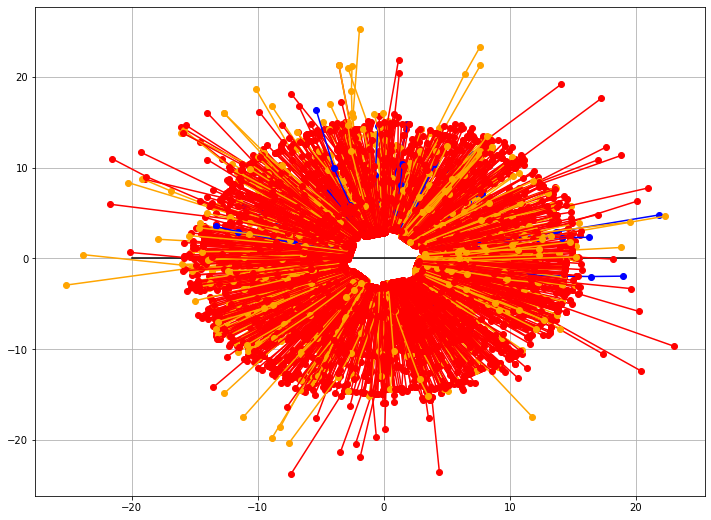

In [147]:
plt.figure(figsize=(12,9))
u = np.random.randint(0,len(tracks_val)-1,2000)

plt.plot([-20,20],[0,0],"-",color="black")
for i in tqdm_notebook(u):
    
    if(frac[i]<0.75 and QUAL[i]==0):
        plt.plot(Xs[i][:Ns[i]],Ys[i][:Ns[i]],"-o",color="red")
    if(frac[i]<0.75 and QUAL[i]==1):
        plt.plot(Xs[i][:Ns[i]],Ys[i][:Ns[i]],"-o",color="orange")
    if(frac[i]<0.75 and QUAL[i]>=2):
        plt.plot(Xs[i][:Ns[i]],Ys[i][:Ns[i]],"-o",color="blue")
    #else:
    #    plt.plot(Xs[i],Ys[i],"o",color="black")

    
#plt.plot([0.0],[0.0],"o",markersize=22)
#plt.plot([0.0,-40.0],[0.0,1.408],"-",color="red")
#plt.plot(a["x_0"].values,a["y_0"].values,"o")
#plt.plot(a["x_1"].values,a["y_1"].values,"o")
#plt.plot(a["x_0"].values,a["y_0"].values,"o")
#plt.xticks(np.arange(-100, 100, 20.0));
plt.grid(axis="both")




# Track Cuts

## Triangle Areas

In [123]:
n_tuples = len(tracks_val)

In [124]:
trip_cuts = {}

In [125]:
quad_cuts = {}

In [126]:
def PolyArea(x,y):
    return 0.5*np.abs(np.dot(x,np.roll(y,1))-np.dot(y,np.roll(x,1)))

In [127]:
def PolyArea2(x,y):
    
    area = ((x[1] - x[0])*(y[2] - y[0]) - (x[2] - x[0])*(y[1] - y[0]));
    
    return 0.5*abs(area)

In [128]:
areas_xy = [PolyArea(Xs[n,:3],Ys[n,:3]) for n in range(len(Xs))]
areas_zy = [PolyArea(Zs[n,:3],Ys[n,:3]) for n in range(len(Xs))]
areas_zx = [PolyArea(Zs[n,:3],Xs[n,:3]) for n in range(len(Xs))]
areas_zr = [PolyArea(Zs[n,:3],Rs[n,:3]) for n in range(len(Xs))]

In [129]:
tracks_val["xy"] = areas_xy
tracks_val["zy"] = areas_zy
tracks_val["zx"] = areas_zx
tracks_val["zr"] = areas_zr

In [130]:
for a in tqdm_notebook(range(1,4)):

    areas_xy = [PolyArea(Xs[n,a:a+3],Ys[n,a:a+3]) for n in range(len(Xs))]
    areas_zy = [PolyArea(Zs[n,a:a+3],Ys[n,a:a+3]) for n in range(len(Xs))]
    areas_zx = [PolyArea(Zs[n,a:a+3],Xs[n,a:a+3]) for n in range(len(Xs))]
    areas_zr = [PolyArea(Zs[n,a:a+3],Rs[n,a:a+3]) for n in range(len(Xs))]
    
    tracks_val["xy"+str(a)] = areas_xy
    tracks_val["zy"+str(a)] = areas_zy
    tracks_val["zx"+str(a)] = areas_zx
    tracks_val["zr"+str(a)] = areas_zr

### Trips + Quads

In [131]:
VARS = ["xy","zy","zx","zr"]
VARS_MORE = [v + str(a) for v in VARS for a in range(1,4)]

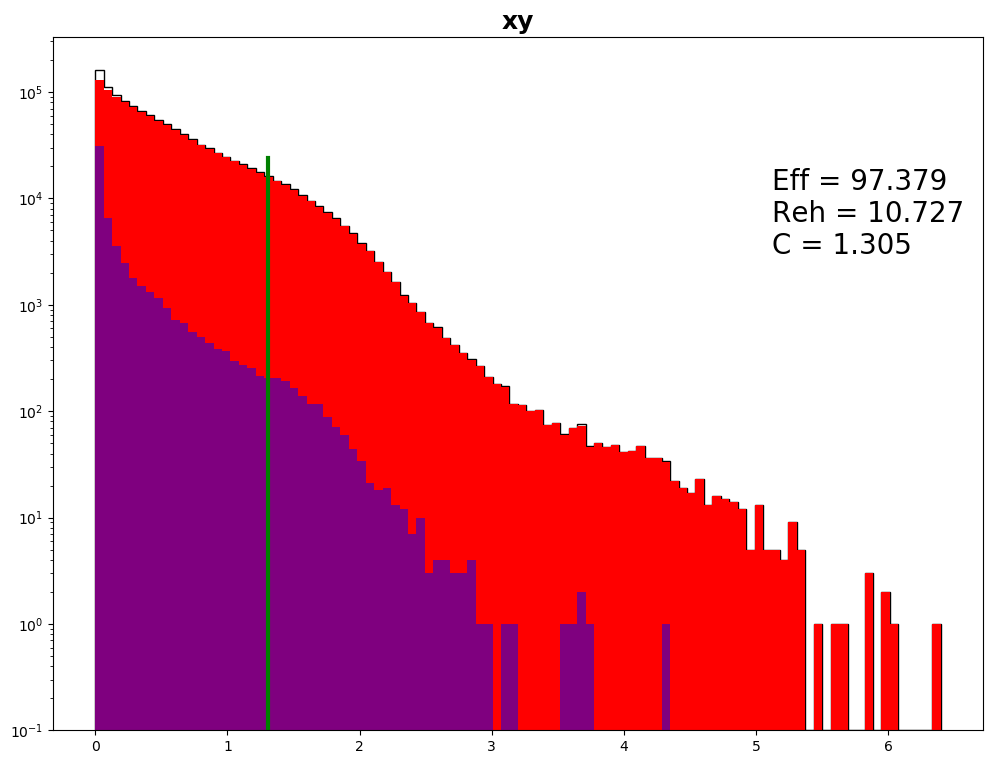

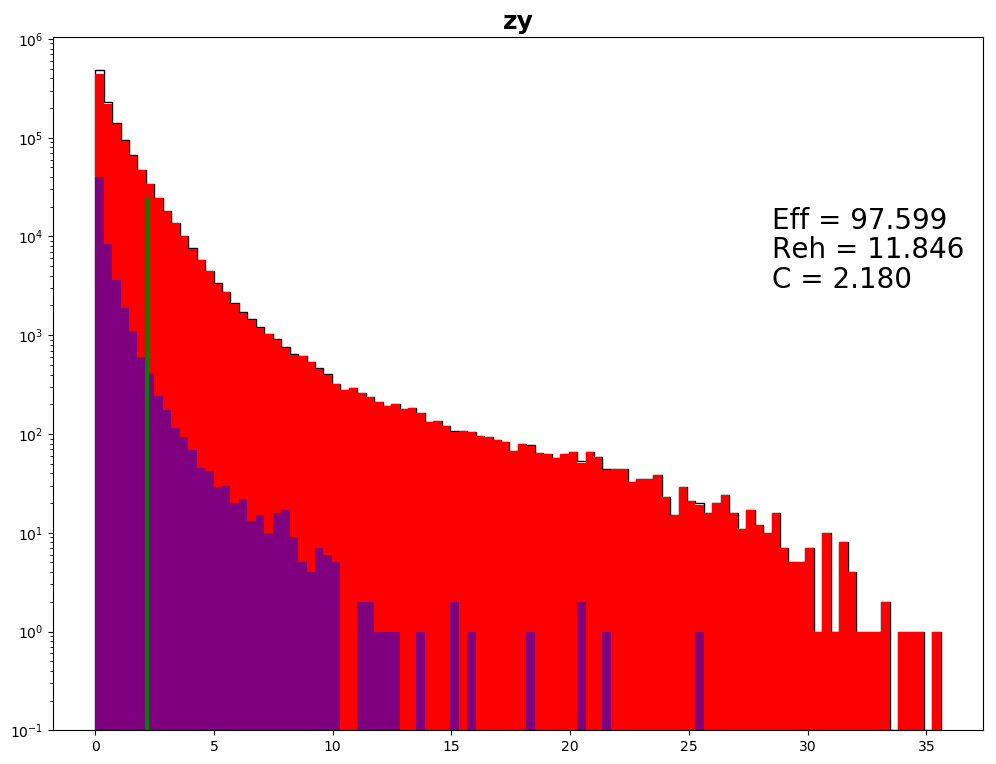

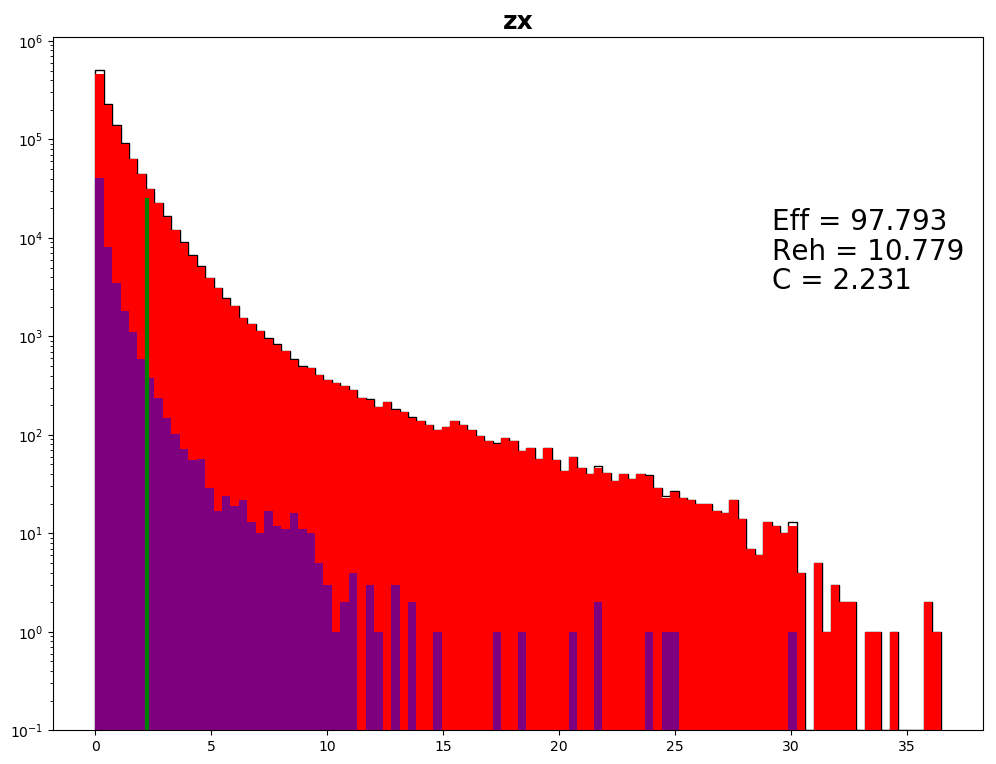

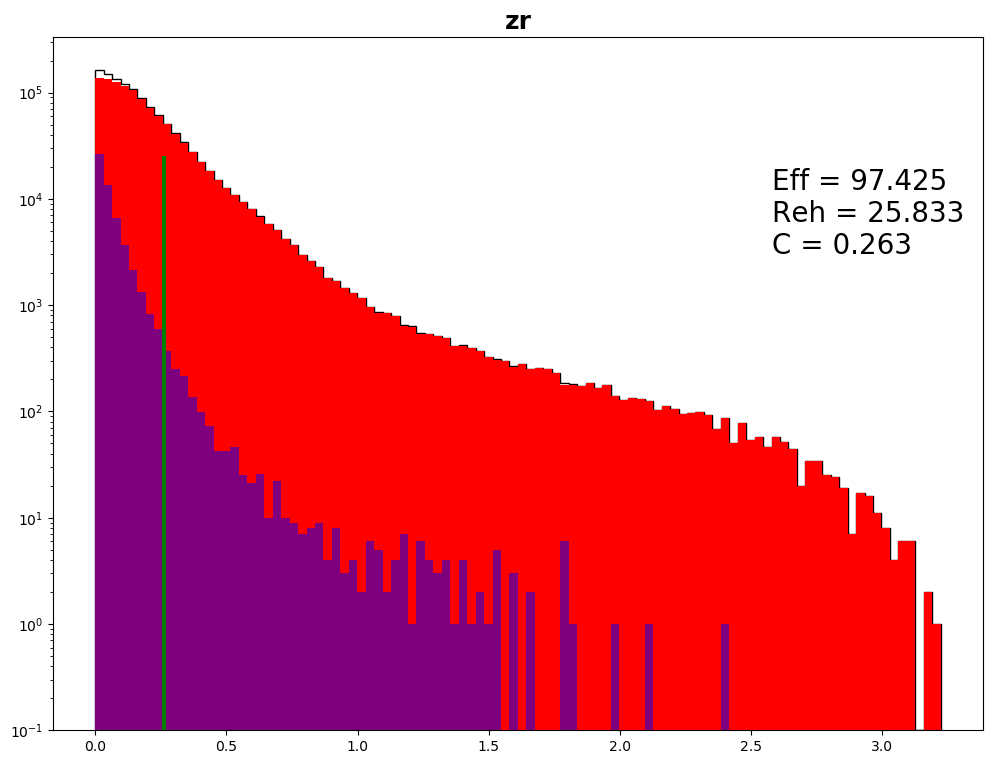

In [148]:
for VAR in VARS:
    
    plt.figure(figsize=(12,9))
    maxx = tracks_val[VAR].values.max()
    plt.hist(tracks_val[VAR].values,bins=100,log=True,range=(0.0,maxx),color="black",histtype="step");
    plt.hist(tracks_val[~true_track][VAR].values,bins=100,log=True,range=(0.0,maxx),color="red");
    plt.hist(tracks_val[true_track][VAR].values,alpha=0.5,bins=100,log=True,range=(0.0,maxx),color="blue");
    
    plt.title(VAR,fontsize=18,fontweight="bold")
    
    T = float(len(tracks_val[true_track]))
    F = float(len(tracks_val[~true_track]))
    
    for C in np.linspace(0.0,maxx,50):
        
        TS = float(len(tracks_val[true_track & (tracks_val[VAR]<C)]))
        if (TS/T) <0.97:
            continue
        FR = float(len(tracks_val[~true_track & (tracks_val[VAR]>C)]))
        
        break
    
    plt.plot([C,C],[0,n_tuples/50],color="green",lw=3)
    plt.text(maxx*0.8,n_tuples/100,"Eff = %.3f"%(TS/T*100.),fontsize=20)
    plt.text(maxx*0.8,n_tuples/200,"Reh = %.3f"%(FR/F*100.),fontsize=20)
    plt.text(maxx*0.8,n_tuples/400,"C = %.3f"%(C),fontsize=20)

## Trips

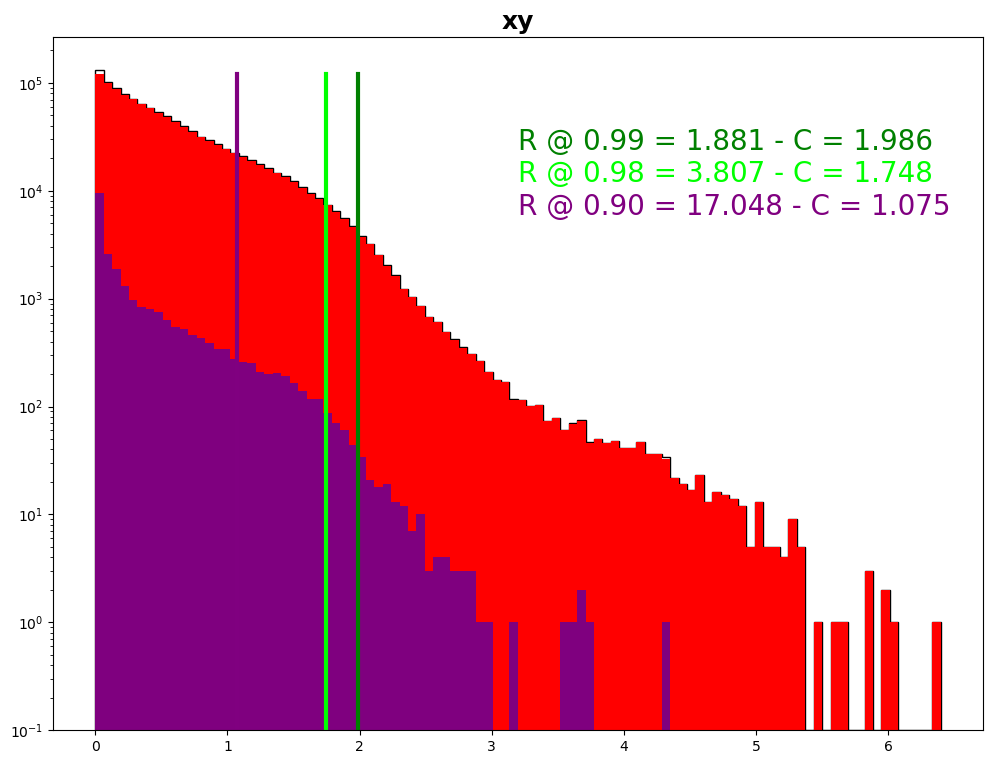

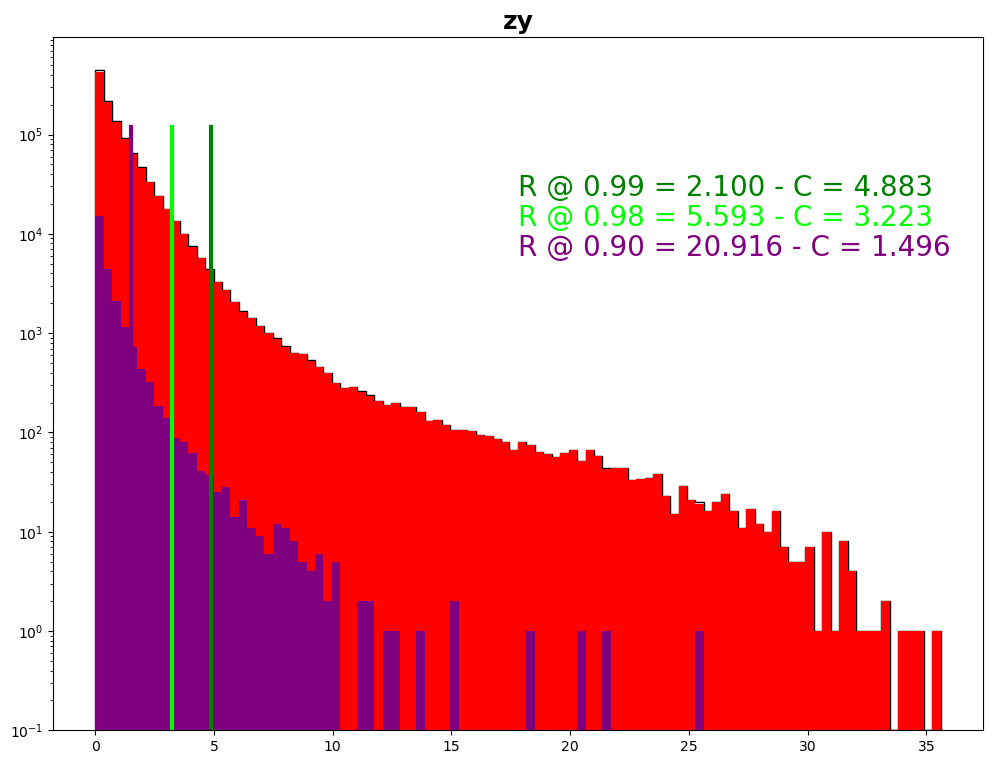

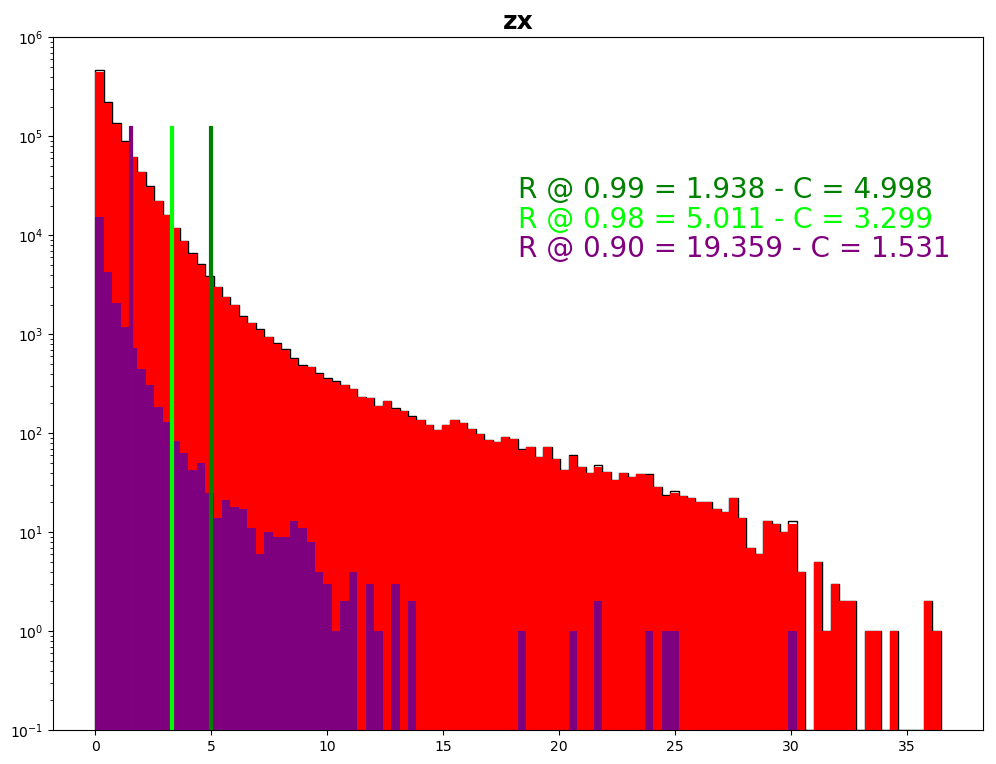

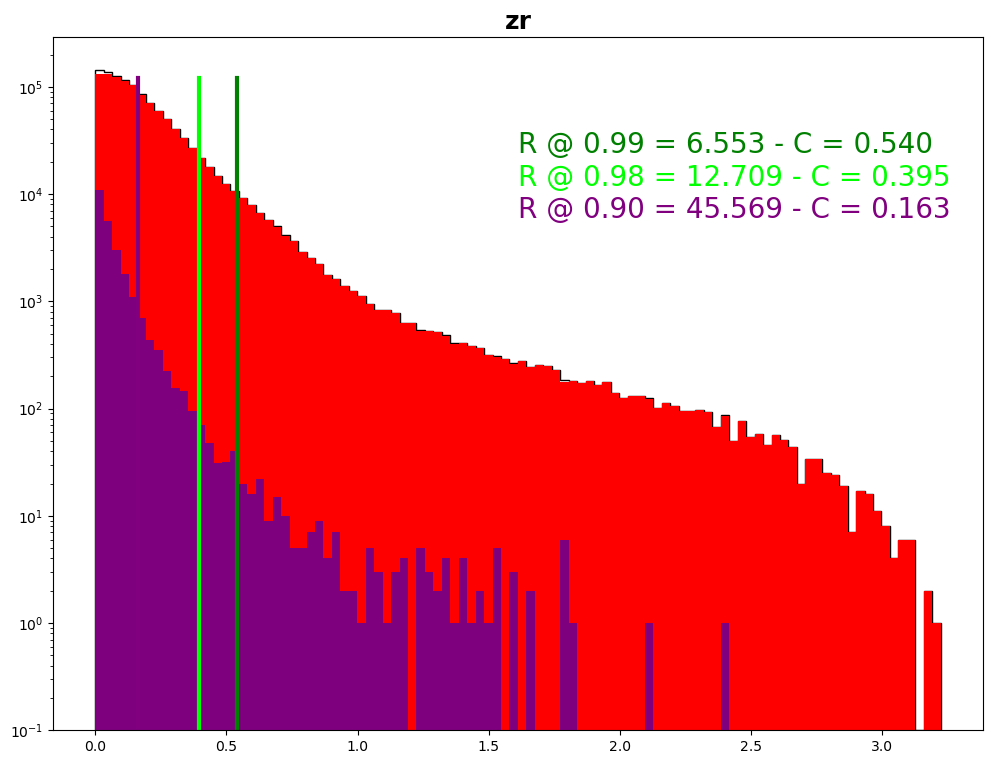

In [150]:
selection = trips
for VAR in VARS:
    
    plt.figure(figsize=(12,9))
    maxx = tracks_val[VAR].values.max()
    plt.hist(tracks_val[selection][VAR].values,bins=100,log=True,range=(0.0,maxx),color="black",histtype="step");
    plt.hist(tracks_val[selection & ~semi_true][VAR].values,bins=100,log=True,range=(0.0,maxx),color="red");
    plt.hist(tracks_val[selection & semi_true][VAR].values,alpha=0.5,bins=100,log=True,range=(0.0,maxx),color="blue");
    
    plt.title(VAR,fontsize=18,fontweight="bold")
    
    T = float(len(tracks_val[selection & semi_true]))
    F = float(len(tracks_val[selection & ~semi_true]))
    
    trip_cuts[VAR] = []
    
    for C in np.linspace(0.0,maxx,120):
        
        TS = float(len(tracks_val[selection & semi_true & (tracks_val[VAR]<C)]))
        if (TS/T) <0.90:
            continue
        FR = float(len(tracks_val[selection & ~semi_true & (tracks_val[VAR]>C)]))
        cs = C
        plt.text(maxx*0.5,n_tuples/200,"R @ 0.90 = %.3f - C = %.3f"%(FR/F*100.,C),fontsize=20,color="purple")
        plt.plot([C,C],[0,n_tuples/10],color="purple",lw=3)
        trip_cuts[VAR].append(C)
        break

    for C in np.linspace(cs,maxx,80):
        
        TS = len(tracks_val[selection & semi_true & (tracks_val[VAR]<C)])
        if (TS/T) <0.98:
            continue
        FR = len(tracks_val[selection & ~semi_true & (tracks_val[VAR]>C)])
        cs = C
        plt.text(maxx*0.5,n_tuples/100,"R @ 0.98 = %.3f - C = %.3f"%(FR/F*100.,C),fontsize=20,color="lime")
        plt.plot([C,C],[0,n_tuples/10],color="lime",lw=3)
        trip_cuts[VAR].append(C)
        break
    
    for C in np.linspace(cs,maxx,40):
        
        TS = float(len(tracks_val[selection & semi_true & (tracks_val[VAR]<C)]))
        if (TS/T) <0.99:
            continue
        FR = float(len(tracks_val[selection & ~semi_true & (tracks_val[VAR]>C)]))
        cs = C
        plt.text(maxx*0.5,n_tuples/50,"R @ 0.99 = %.3f - C = %.3f"%(FR/F*100.,C),fontsize=20,color="green")
        plt.plot([C,C],[0,n_tuples/10],color="green",lw=3)
        trip_cuts[VAR].append(C)
        break
        
    
    
    #plt.text(maxx*0.8,n_tuples/100,"Eff = %.3f"%(TS/T*100.),fontsize=20)
    
    #plt.text(maxx*0.8,n_tuples/400,"C = %.3f"%(C),fontsize=20)

In [154]:
this_cut = True
for VAR in VARS:
    if VAR == "zr":
        continue
    this_cut = (tracks_val[VAR]<trip_cuts[VAR][0]) & this_cut
TS = len(tracks_val[selection & semi_true & this_cut])
FR = len(tracks_val[selection & ~semi_true & ~this_cut])

print("95 -> E = %.3f - R = %.3f"%(TS/T*100.,FR/F*100.))


this_cut = True
for VAR in VARS:
    if VAR == "zr":
        continue
    this_cut = (tracks_val[VAR]<trip_cuts[VAR][1]) & this_cut
TS = len(tracks_val[selection & semi_true & this_cut])
FR = len(tracks_val[selection & ~semi_true & ~this_cut])

print("97 -> E = %.3f - R = %.3f"%(TS/T*100.,FR/F*100.))

this_cut = True
for VAR in VARS:
    if VAR == "zr":
        continue
    this_cut = (tracks_val[VAR]<trip_cuts[VAR][2]) & this_cut
TS = len(tracks_val[selection & semi_true & this_cut])
FR = len(tracks_val[selection & ~semi_true & ~this_cut])

print("99 -> E = %.3f - R = %.3f"%(TS/T*100.,FR/F*100.))

95 -> E = 85.162 - R = 37.557
97 -> E = 96.405 - R = 16.573
99 -> E = 98.621 - R = 8.842


### Quads

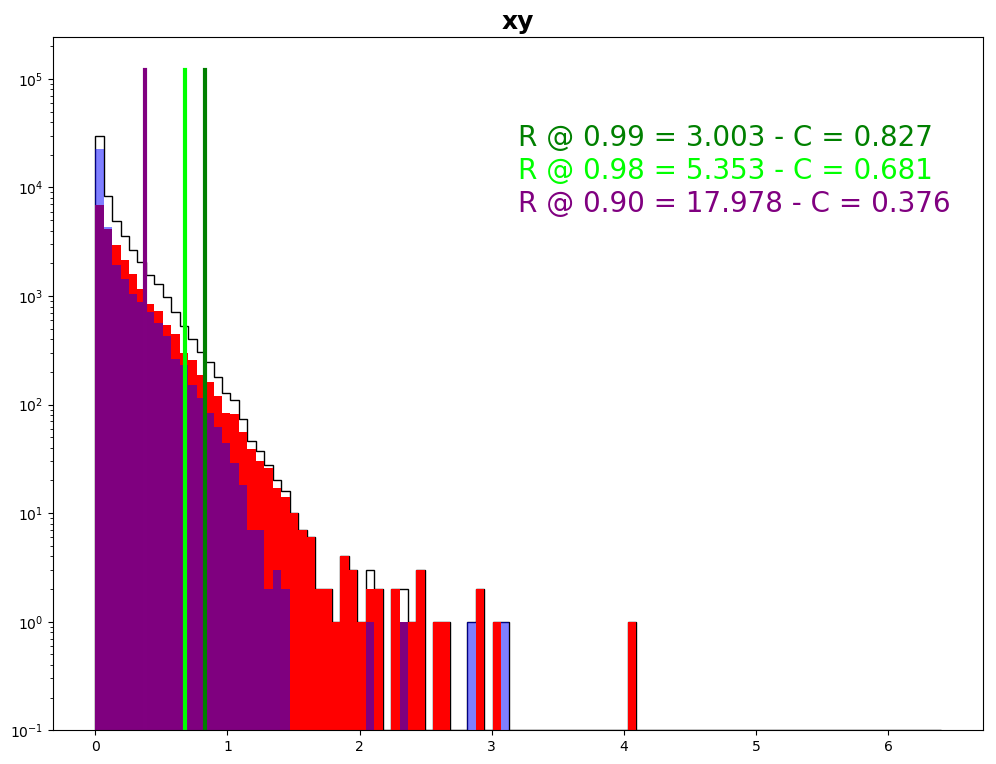

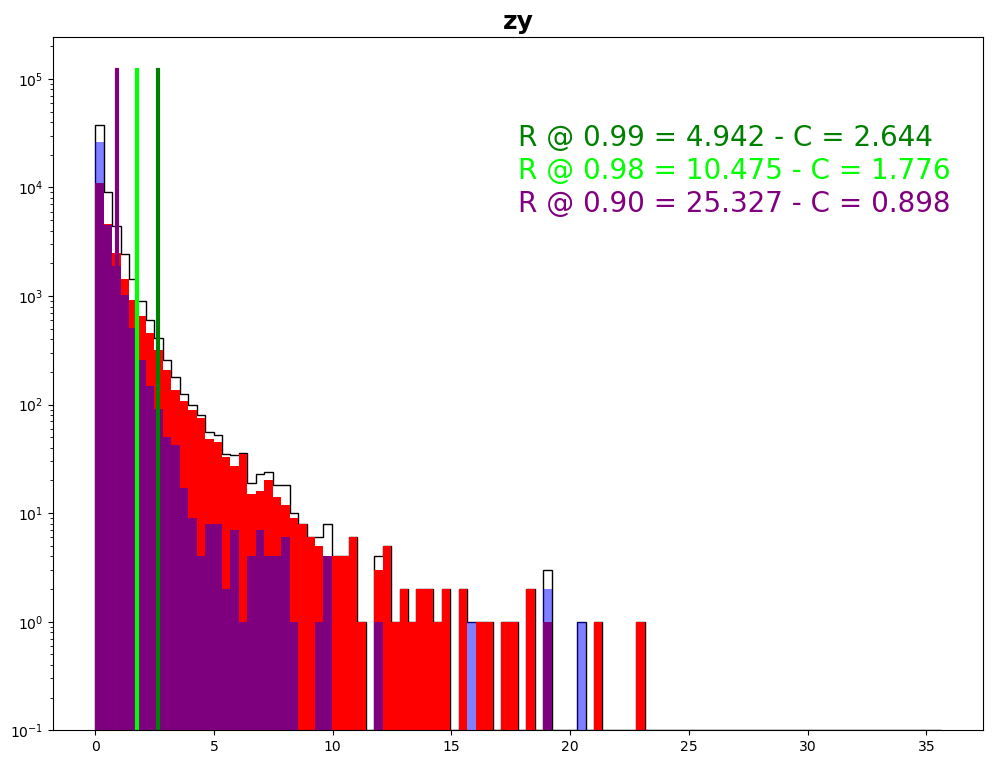

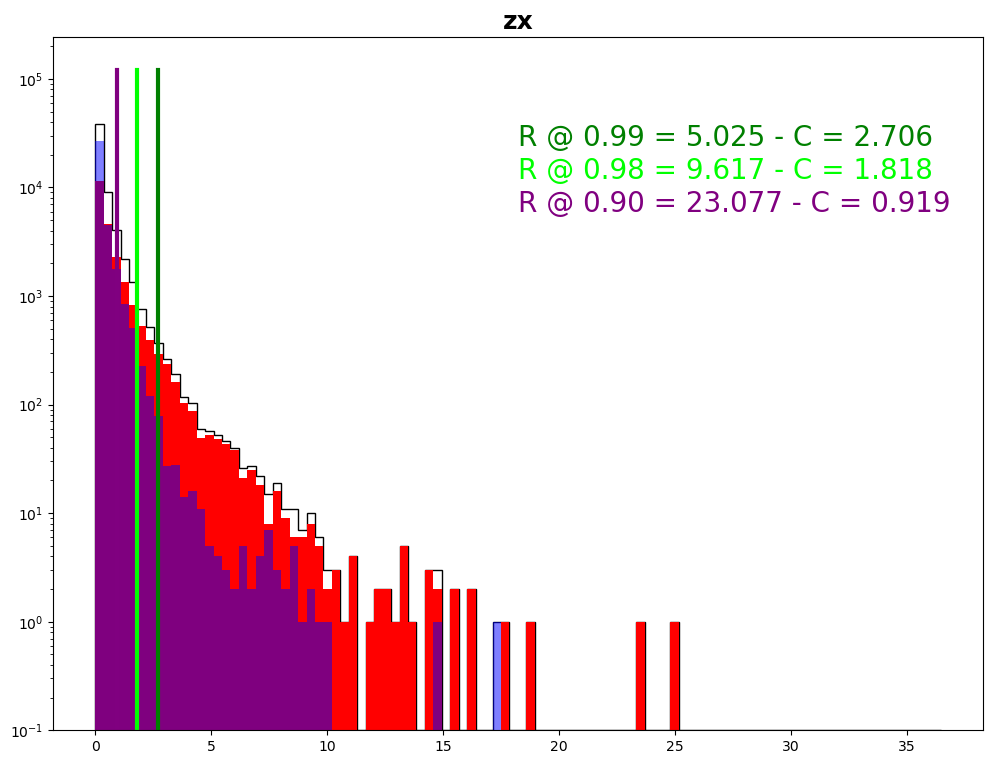

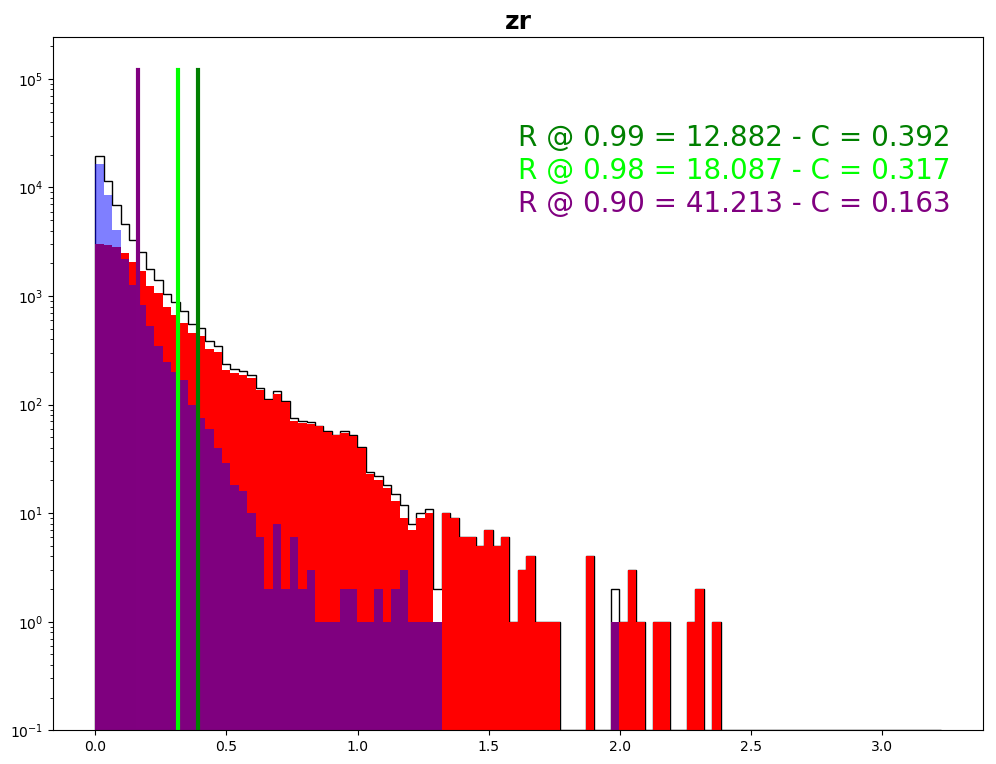

In [151]:
selection = quads
for VAR in VARS:
    
    plt.figure(figsize=(12,9))
    maxx = tracks_val[VAR].values.max()
    plt.hist(tracks_val[selection][VAR].values,bins=100,log=True,range=(0.0,maxx),color="black",histtype="step");
    plt.hist(tracks_val[selection & ~semi_true][VAR].values,bins=100,log=True,range=(0.0,maxx),color="red");
    plt.hist(tracks_val[selection & semi_true][VAR].values,alpha=0.5,bins=100,log=True,range=(0.0,maxx),color="blue");
    
    plt.title(VAR,fontsize=18,fontweight="bold")
    
    T = float(len(tracks_val[selection & semi_true]))
    F = float(len(tracks_val[selection & ~semi_true]))
    
    trip_cuts[VAR] = []
    
    for C in np.linspace(0.0,maxx,120):
        
        TS = float(len(tracks_val[selection & semi_true & (tracks_val[VAR]<C)]))
        if (TS/T) <0.90:
            continue
        FR = float(len(tracks_val[selection & ~semi_true & (tracks_val[VAR]>C)]))
        cs = C
        plt.text(maxx*0.5,n_tuples/200,"R @ 0.90 = %.3f - C = %.3f"%(FR/F*100.,C),fontsize=20,color="purple")
        plt.plot([C,C],[0,n_tuples/10],color="purple",lw=3)
        trip_cuts[VAR].append(C)
        break

    for C in np.linspace(cs,maxx,80):
        
        TS = len(tracks_val[selection & semi_true & (tracks_val[VAR]<C)])
        if (TS/T) <0.98:
            continue
        FR = len(tracks_val[selection & ~semi_true & (tracks_val[VAR]>C)])
        cs = C
        plt.text(maxx*0.5,n_tuples/100,"R @ 0.98 = %.3f - C = %.3f"%(FR/F*100.,C),fontsize=20,color="lime")
        plt.plot([C,C],[0,n_tuples/10],color="lime",lw=3)
        trip_cuts[VAR].append(C)
        break
    
    for C in np.linspace(cs,maxx,40):
        
        TS = float(len(tracks_val[selection & semi_true & (tracks_val[VAR]<C)]))
        if (TS/T) <0.99:
            continue
        FR = float(len(tracks_val[selection & ~semi_true & (tracks_val[VAR]>C)]))
        cs = C
        plt.text(maxx*0.5,n_tuples/50,"R @ 0.99 = %.3f - C = %.3f"%(FR/F*100.,C),fontsize=20,color="green")
        plt.plot([C,C],[0,n_tuples/10],color="green",lw=3)
        trip_cuts[VAR].append(C)
        break
        
    
    
    #plt.text(maxx*0.8,n_tuples/100,"Eff = %.3f"%(TS/T*100.),fontsize=20)
    
    #plt.text(maxx*0.8,n_tuples/400,"C = %.3f"%(C),fontsize=20)

In [153]:
this_cut = True
for VAR in VARS:
    if VAR == "zr":
        continue
    this_cut = (tracks_val[VAR]<quad_cuts[VAR][0]) & this_cut
TS = len(tracks_val[selection & true_track & this_cut])
FR = len(tracks_val[selection & ~true_track & ~this_cut])

print("95 -> E = %.3f - R = %.3f"%(TS/T*100.,FR/F*100.))


this_cut = True
for VAR in VARS:
    if VAR == "zr":
        continue
    this_cut = (tracks_val[VAR]<quad_cuts[VAR][1]) & this_cut
TS = len(tracks_val[selection & true_track & this_cut])
FR = len(tracks_val[selection & ~true_track & ~this_cut])

print("97 -> E = %.3f - R = %.3f"%(TS/T*100.,FR/F*100.))

this_cut = True
for VAR in VARS:
    if VAR == "zr":
        continue
    this_cut = (tracks_val[VAR]<quad_cuts[VAR][2]) & this_cut
TS = len(tracks_val[selection & true_track & this_cut])
FR = len(tracks_val[selection & ~true_track & ~this_cut])

print("99 -> E = %.3f - R = %.3f"%(TS/T*100.,FR/F*100.))

95 -> E = 90.108 - R = 0.026
97 -> E = 90.108 - R = 0.026
99 -> E = 90.108 - R = 0.026


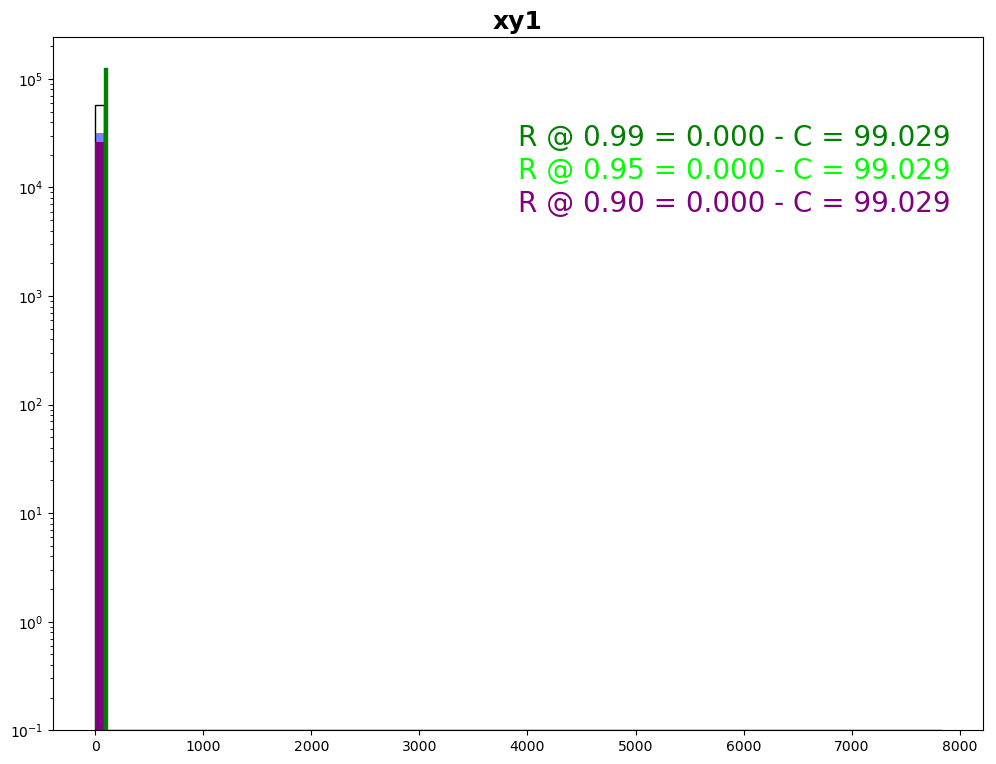

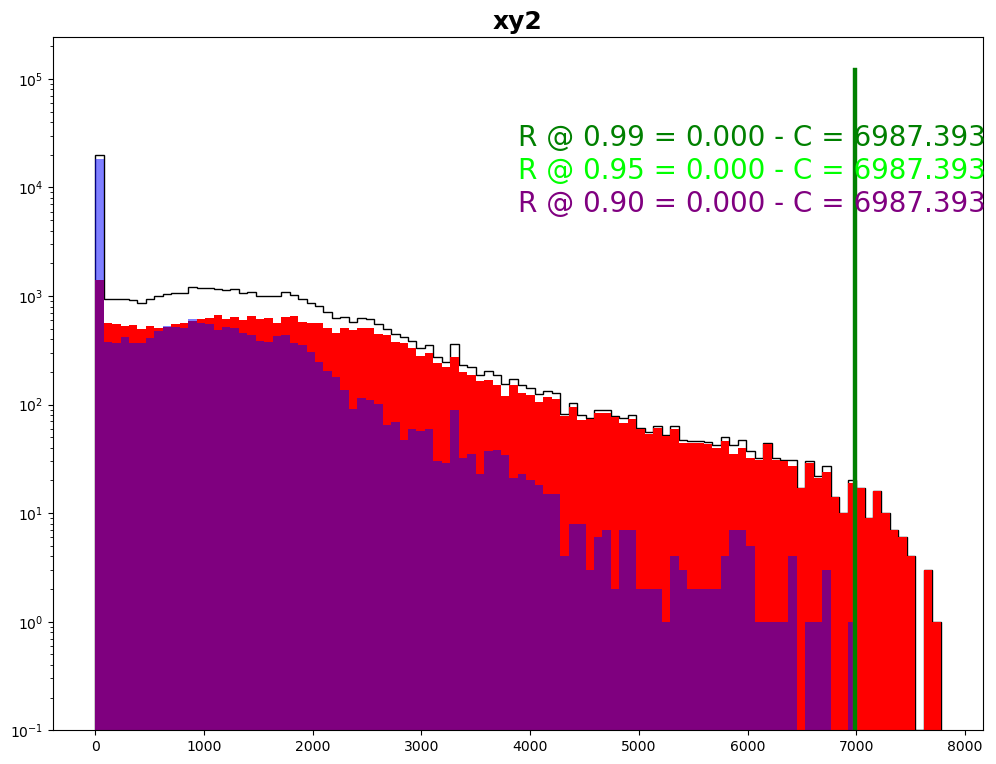

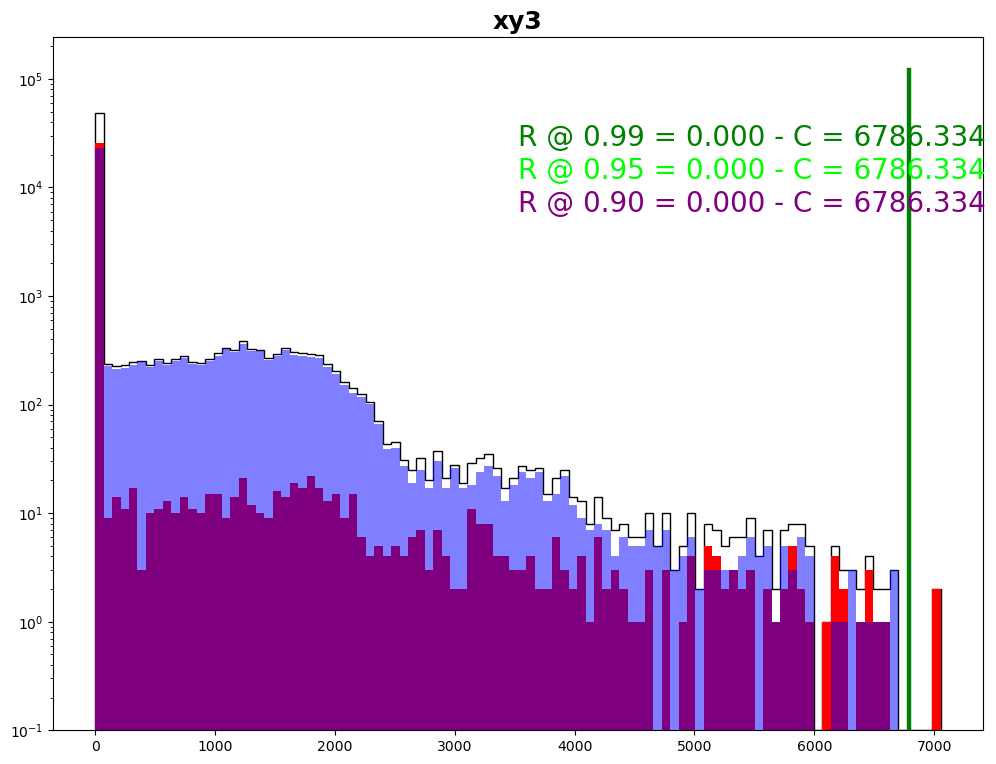

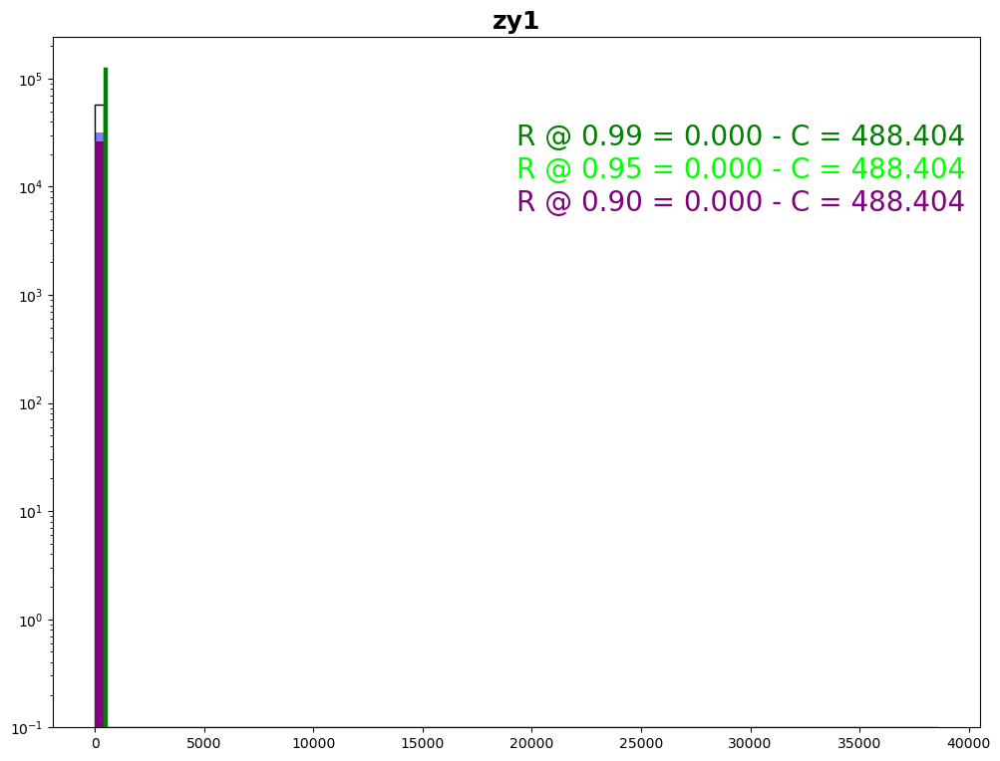

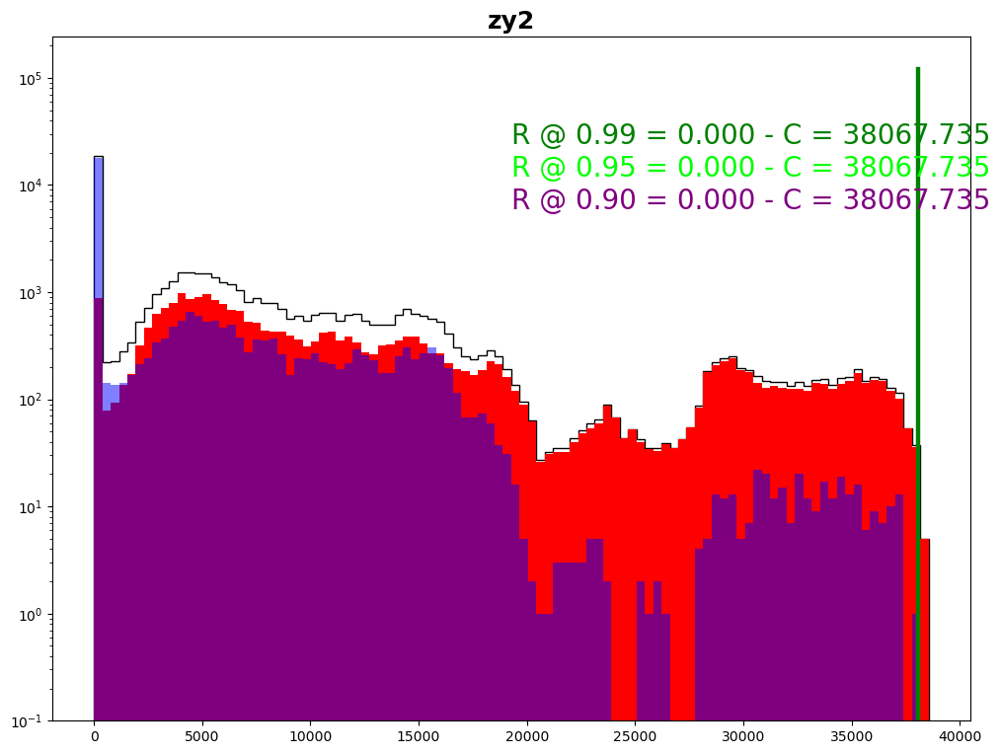

...

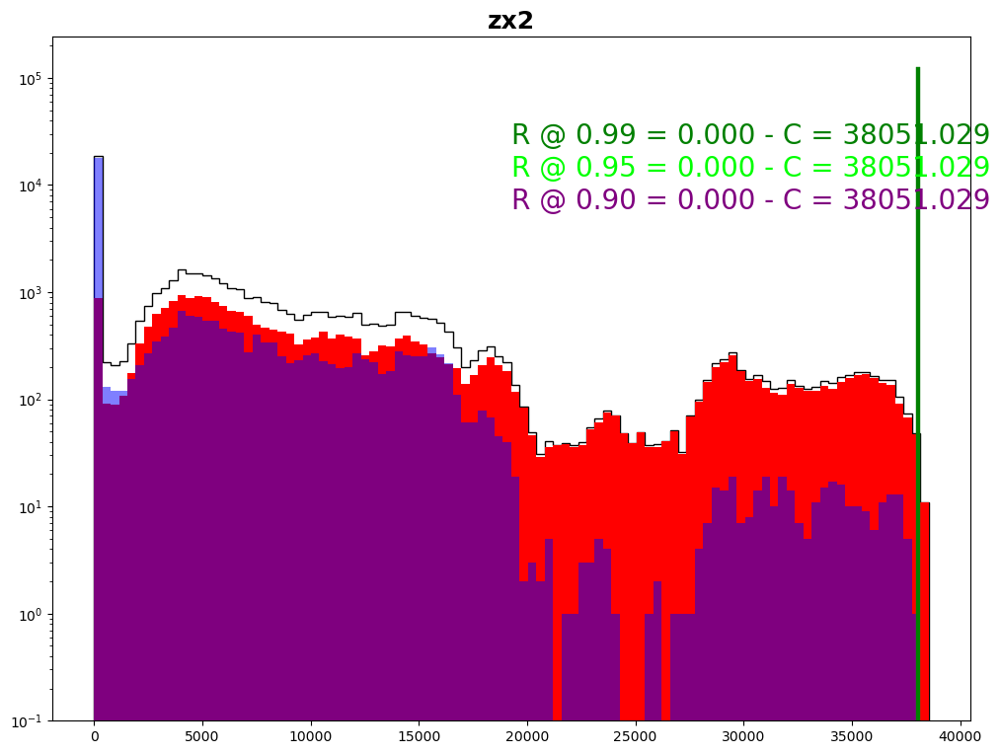

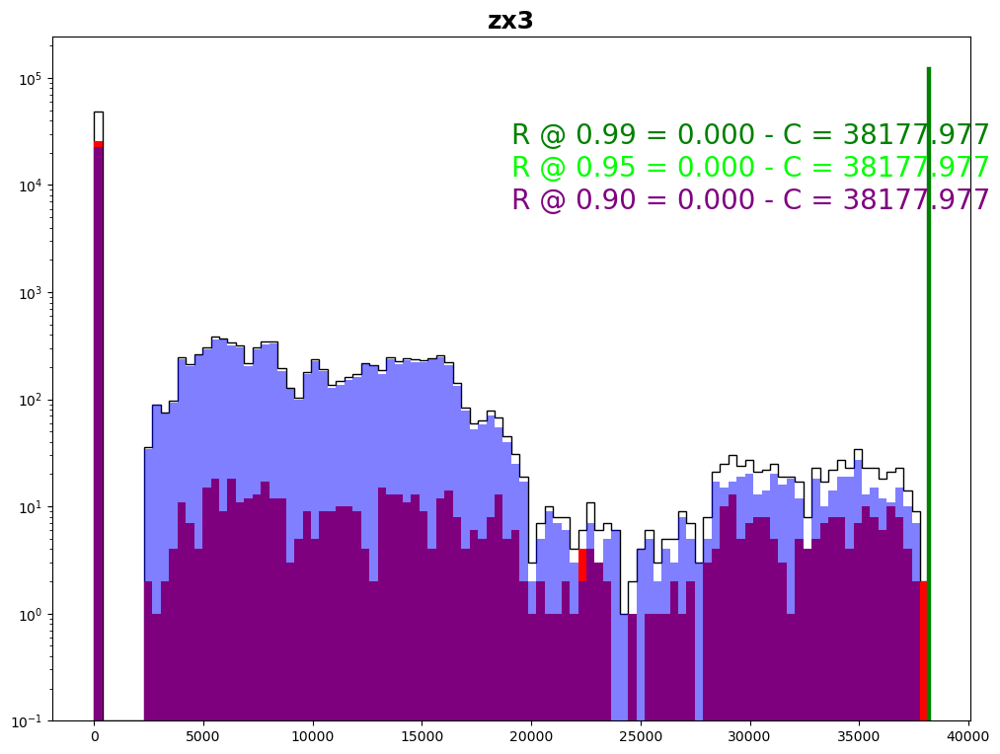

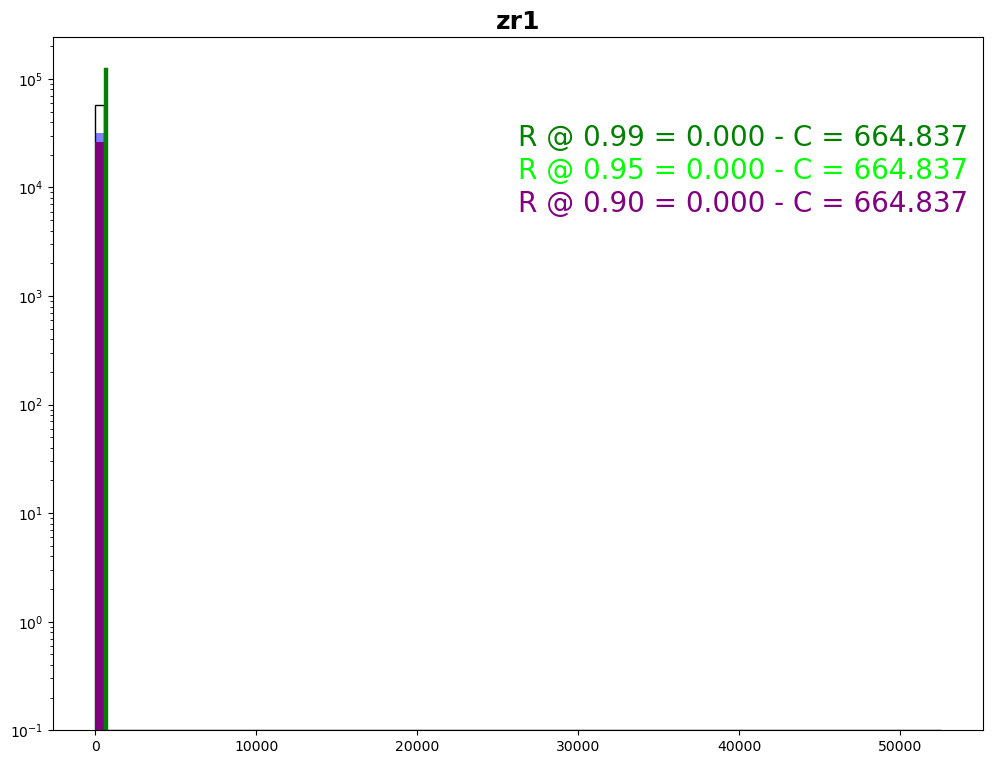

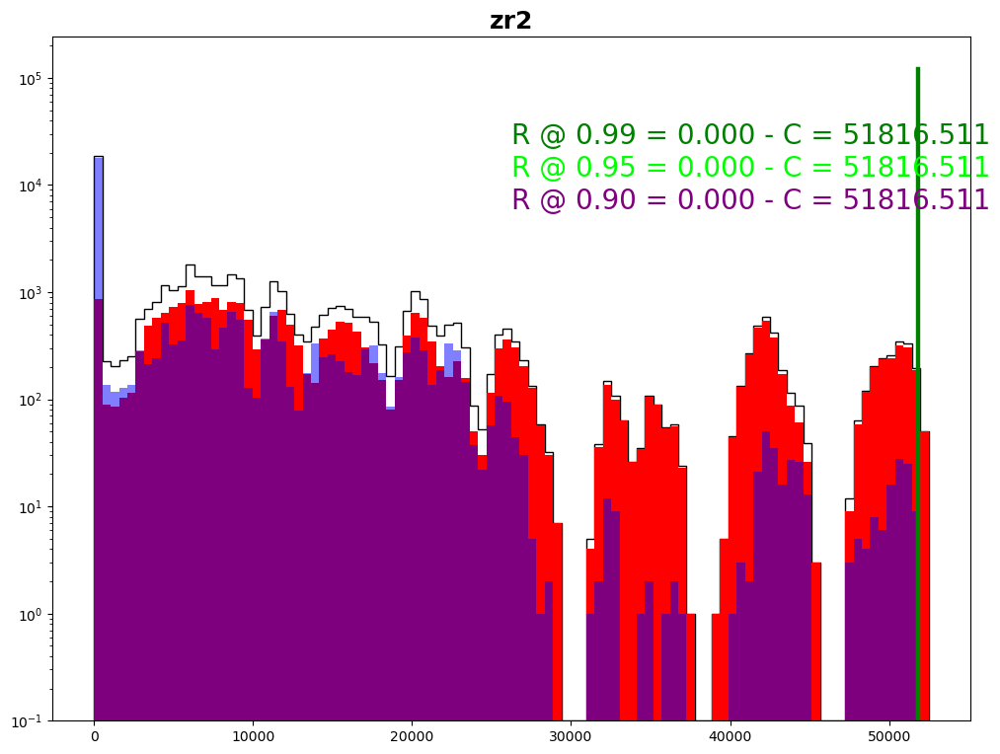

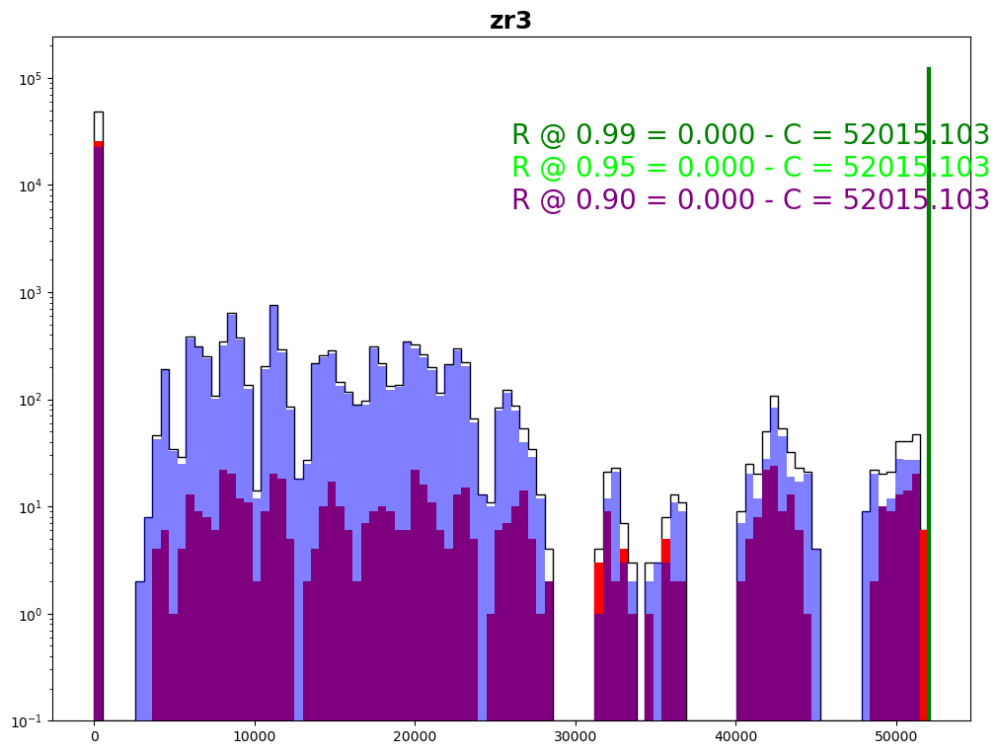

In [137]:
selection = quads
for VAR in VARS_MORE:
    
    plt.figure(figsize=(12,9))
    maxx = tracks_val[VAR].values.max()
    plt.hist(tracks_val[selection][VAR].values,bins=100,log=True,range=(0.0,maxx),color="black",histtype="step");
    plt.hist(tracks_val[selection & ~true_track][VAR].values,bins=100,log=True,range=(0.0,maxx),color="red");
    plt.hist(tracks_val[selection & true_track][VAR].values,alpha=0.5,bins=100,log=True,range=(0.0,maxx),color="blue");
    
    plt.title(VAR,fontsize=18,fontweight="bold")
    
    T = len(tracks_val[selection & true_track])
    F = len(tracks_val[selection & ~true_track])
    
    quad_cuts[VAR] = []
    
    for C in np.linspace(0.0,maxx,80):
        
        TS = len(tracks_val[selection & true_track & (tracks_val[VAR]<C)])
        if (TS/T) <0.9:
            continue
        FR = len(tracks_val[selection & ~true_track & (tracks_val[VAR]>C)])
        cs = C
        plt.text(maxx*0.5,n_tuples/200,"R @ 0.90 = %.3f - C = %.3f"%(FR/F*100.,C),fontsize=20,color="purple")
        plt.plot([C,C],[0,n_tuples/10],color="purple",lw=3)
        quad_cuts[VAR].append(C)
        break

    for C in np.linspace(cs,maxx,80):
        
        TS = len(tracks_val[selection & true_track & (tracks_val[VAR]<C)])
        if (TS/T) <0.95:
            continue
        FR = len(tracks_val[selection & ~true_track & (tracks_val[VAR]>C)])
        cs = C
        plt.text(maxx*0.5,n_tuples/100,"R @ 0.95 = %.3f - C = %.3f"%(FR/F*100.,C),fontsize=20,color="lime")
        plt.plot([C,C],[0,n_tuples/10],color="lime",lw=3)
        quad_cuts[VAR].append(C)
        break
    
    for C in np.linspace(cs,maxx,80):
        
        TS = len(tracks_val[selection & true_track & (tracks_val[VAR]<C)])
        if (TS/T) <0.99:
            continue
        FR = len(tracks_val[selection & ~true_track & (tracks_val[VAR]>C)])
        cs = C
        plt.text(maxx*0.5,n_tuples/50,"R @ 0.99 = %.3f - C = %.3f"%(FR/F*100.,C),fontsize=20,color="green")
        plt.plot([C,C],[0,n_tuples/10],color="green",lw=3)
        quad_cuts[VAR].append(C)
        break
        
    
    
    #plt.text(maxx*0.8,n_tuples/100,"Eff = %.3f"%(TS/T*100.),fontsize=20)
    
    #plt.text(maxx*0.8,n_tuples/400,"C = %.3f"%(C),fontsize=20)

### Zx & Zy cut

/cvmfs/cms.cern.ch/slc7_amd64_gcc820/external/py2-ipykernel/4.10.1-bcolbf2/lib/python2.7/site-packages/ipykernel_launcher.py:2: RankWarning: Polyfit may be poorly conditioned
  


Eff: 0.984
Rej: 0.084


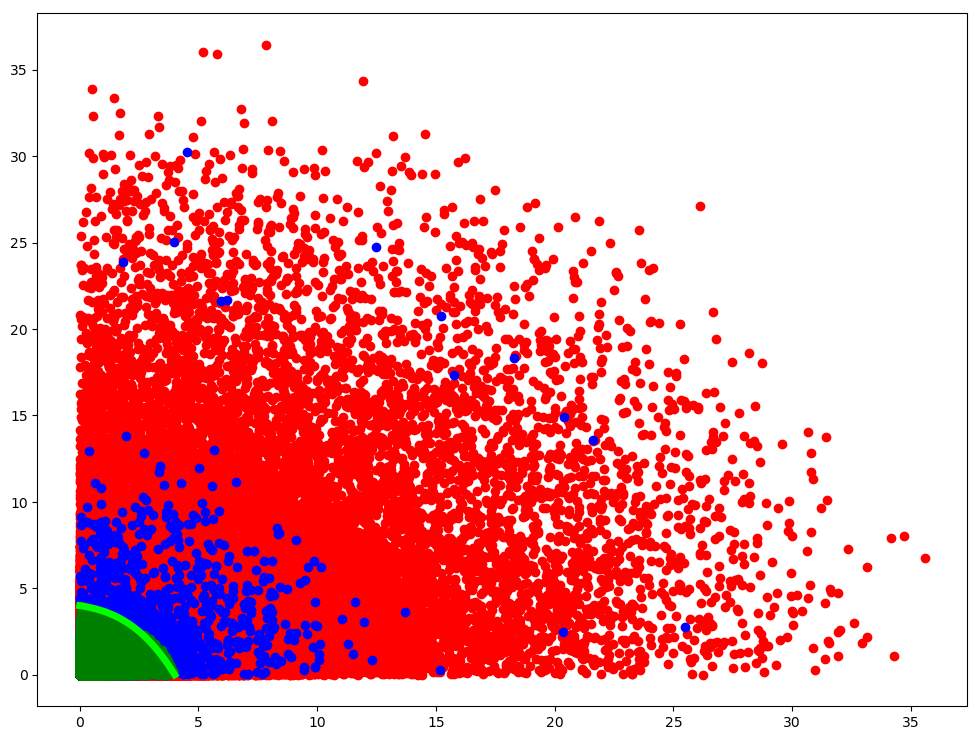

In [155]:
XX = [0.0,2.5,4.0]
z = np.polyfit(XX, [4.0,2.5,0.0], 3)
p = np.poly1d(z)

tt = len(tracks_val[true_track])
ff = len(tracks_val[~true_track])

tt_cut = tracks_val[true_track & (tracks_val["zy"]<=p(tracks_val["zx"]))].shape[0]
ff_cut = tracks_val[~true_track & (tracks_val["zy"]>p(tracks_val["zx"]))].shape[0]

print("Eff: %.3f" % (tt_cut/tt))
print("Rej: %.3f" % (ff_cut/ff))

plt.figure(figsize=(12,9))

cut = (tracks_val["zy"]<p(tracks_val["zx"]))

plt.plot(tracks_val[~true_track]["zy"].values,tracks_val[~super_true_track]["zx"].values,"o",color="red")
plt.plot(tracks_val[true_track]["zy"].values,tracks_val[super_true_track]["zx"].values,"o",color="blue")
plt.plot(tracks_val[true_track & cut]["zy"].values,tracks_val[true_track & cut]["zx"].values,"o",color="green")
#plt.plot(tracks_val[fake_bad]["zr"].values,tracks_val[fake_bad]["zx"].values,"o",color="purple")

dots = np.linspace(0,max(XX),100)

plt.plot(dots,p(dots),"-",color="lime",lw=5)




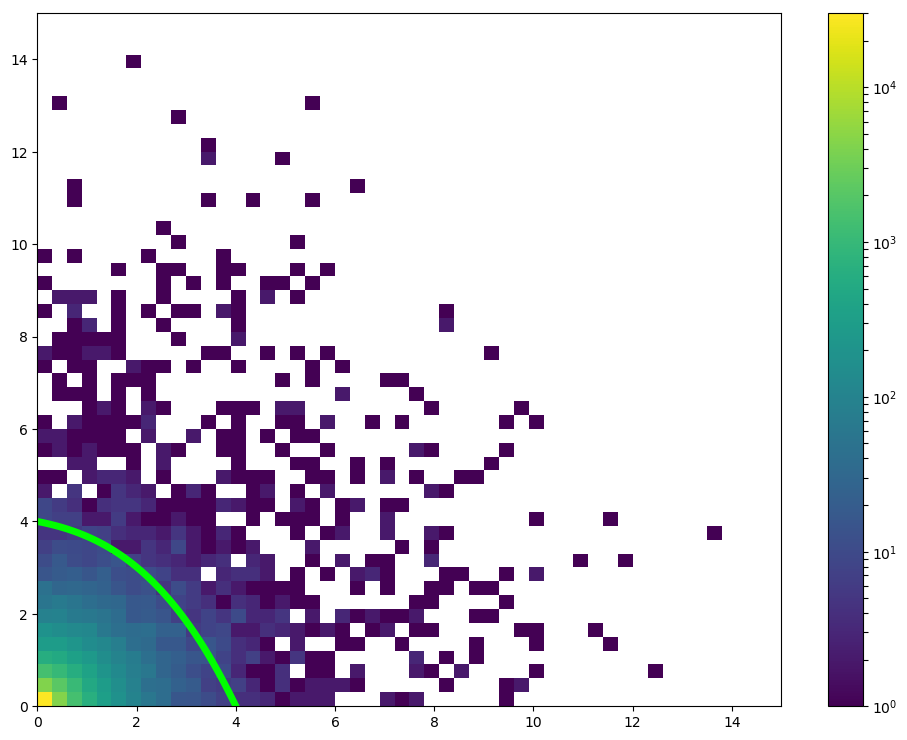

In [156]:
plt.figure(figsize=(12,9))
plt.hist2d(tracks_val[true_track]["zy"].values,tracks_val[true_track]["zx"].values,bins=50,range=((0.0,15),(0.0,15.0)),norm=mpl.colors.LogNorm());

plt.plot(dots,p(dots),"-",color="lime",lw=5)

plt.colorbar()


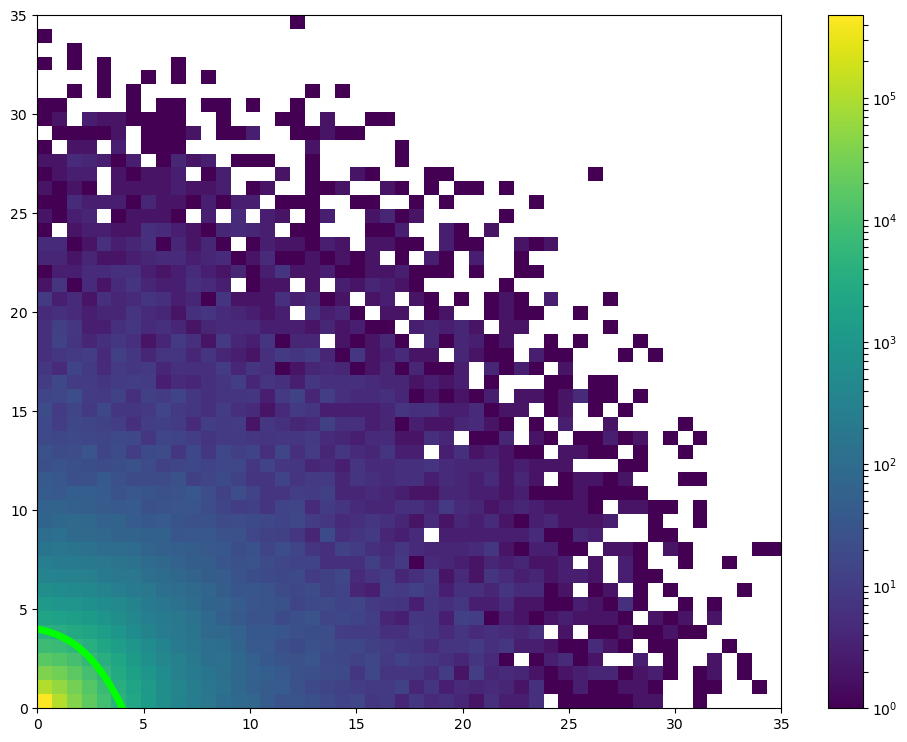

In [157]:
plt.figure(figsize=(12,9))
plt.hist2d(tracks_val[~true_track]["zy"].values,tracks_val[~true_track]["zx"].values,bins=50,range=((0.0,35),(0.0,35.0)),norm=mpl.colors.LogNorm());

plt.plot(dots,p(dots),"-",color="lime",lw=5)

plt.colorbar()

### DeltaZs

In [325]:
tracks_val["deltaz_0"] = tracks_val["z_1"] - tracks_val["z_0"]
tracks_val["deltaz_1"] = tracks_val["z_2"] - tracks_val["z_1"]
tracks_val["deltaz_2"] = tracks_val["z_2"] - tracks_val["z_0"]

Eff = 76.623
Reh = 24.467


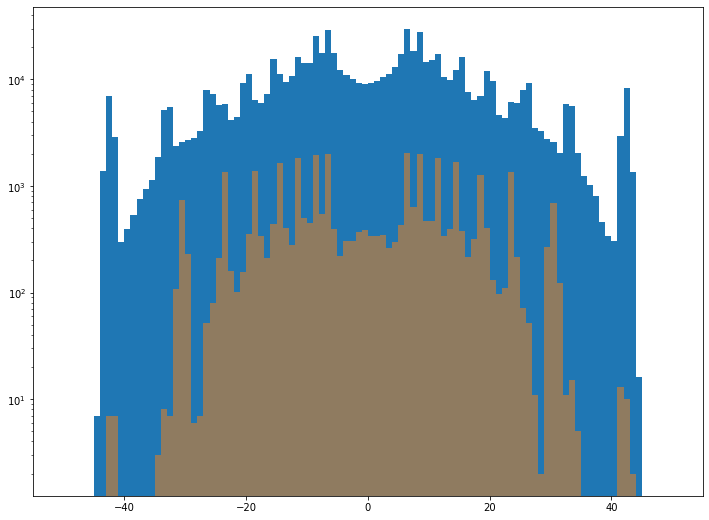

In [328]:
VAR = "deltaz_0"
CUT = 12
R = 50 
plt.figure(figsize=(12,9))
plt.hist(tracks_val[~true_track][VAR].values,bins=100,log=True,range=(-R,R));
plt.hist(tracks_val[true_track][VAR].values,alpha=0.5,bins=100,log=True,range=(-R,R));

TS = len(tracks_val[true_track & (tracks_val[VAR]<CUT)])
T = len(tracks_val[true_track])

FR = len(tracks_val[~true_track & (tracks_val[VAR]>CUT)])
F = len(tracks_val[~true_track])

print("Eff = %.3f"%(TS/T*100.))
print("Reh = %.3f"%(FR/F*100.))


Eff = 73.258
Reh = 31.166


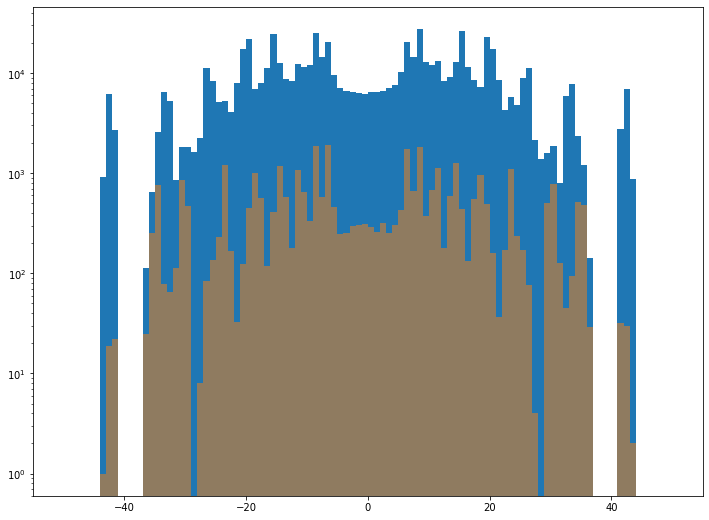

In [329]:
VAR = "deltaz_1"
CUT = 12
R = 50 
plt.figure(figsize=(12,9))
plt.hist(tracks_val[~true_track][VAR].values,bins=100,log=True,range=(-R,R));
plt.hist(tracks_val[true_track][VAR].values,alpha=0.5,bins=100,log=True,range=(-R,R));

TS = len(tracks_val[true_track & (tracks_val[VAR]<CUT)])
T = len(tracks_val[true_track])

FR = len(tracks_val[~true_track & (tracks_val[VAR]>CUT)])
F = len(tracks_val[~true_track])

print("Eff = %.3f"%(TS/T*100.))
print("Reh = %.3f"%(FR/F*100.))



In [477]:
delta_z1_cut = (tracks_val[VAR].abs()<CUT)

Eff = 54.471
Reh = 45.002


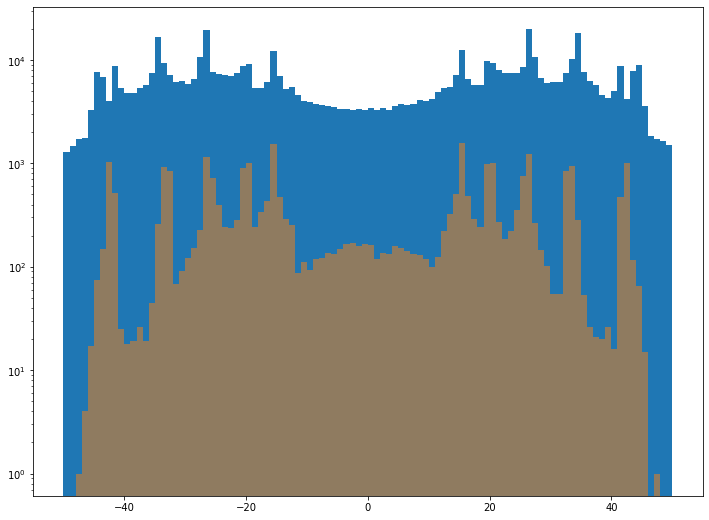

In [330]:
VAR = "deltaz_2"
CUT = 12
R = 50 
plt.figure(figsize=(12,9))
plt.hist(tracks_val[~true_track][VAR].values,bins=100,log=True,range=(-R,R));
plt.hist(tracks_val[true_track][VAR].values,alpha=0.5,bins=100,log=True,range=(-R,R));

TS = len(tracks_val[true_track & (tracks_val[VAR]<CUT)])
T = len(tracks_val[true_track])

FR = len(tracks_val[~true_track & (tracks_val[VAR]>CUT)])
F = len(tracks_val[~true_track])

print("Eff = %.3f"%(TS/T*100.))
print("Reh = %.3f"%(FR/F*100.))

In [482]:
delta_z2_cut = (tracks_val[VAR].abs()<CUT)

## Chi Cuts

In [158]:
tracks_val["chinorm"] = tracks_val["chi2"].values/tracks_val["n"].values

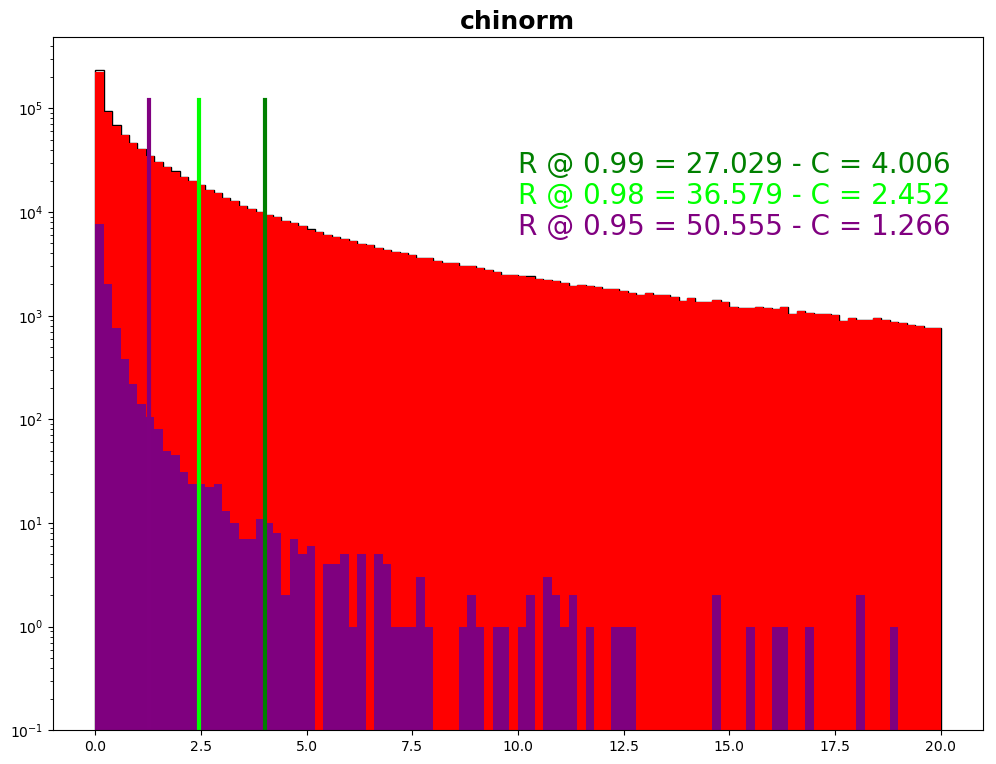

In [240]:
selection = (PTs>0)
VAR="chinorm"
plt.figure(figsize=(12,9))
maxx = 20
plt.hist(tracks_val[selection][VAR].values,bins=100,log=True,range=(0.0,maxx),color="black",histtype="step");
plt.hist(tracks_val[selection & ~true_track][VAR].values,bins=100,log=True,range=(0.0,maxx),color="red");
plt.hist(tracks_val[selection & true_track][VAR].values,alpha=0.5,bins=100,log=True,range=(0.0,maxx),color="blue");

plt.title(VAR,fontsize=18,fontweight="bold")

T = len(tracks_val[selection & true_track])
F = len(tracks_val[selection & ~true_track])

quad_cuts[VAR] = []

for C in np.linspace(0.0,maxx,80):

    TS = len(tracks_val[selection & true_track & (tracks_val[VAR]<C)])
    if (TS/T) <0.95:
        continue
    FR = len(tracks_val[selection & ~true_track & (tracks_val[VAR]>C)])
    cs = C
    plt.text(maxx*0.5,n_tuples/200,"R @ 0.95 = %.3f - C = %.3f"%(FR/F*100.,C),fontsize=20,color="purple")
    plt.plot([C,C],[0,n_tuples/10],color="purple",lw=3)
    quad_cuts[VAR].append(C)
    break

for C in np.linspace(cs,maxx,80):

    TS = len(tracks_val[selection & true_track & (tracks_val[VAR]<C)])
    if (TS/T) <0.98:
        continue
    FR = len(tracks_val[selection & ~true_track & (tracks_val[VAR]>C)])
    cs = C
    plt.text(maxx*0.5,n_tuples/100,"R @ 0.98 = %.3f - C = %.3f"%(FR/F*100.,C),fontsize=20,color="lime")
    plt.plot([C,C],[0,n_tuples/10],color="lime",lw=3)
    quad_cuts[VAR].append(C)
    break

for C in np.linspace(cs,maxx,80):

    TS = len(tracks_val[selection & true_track & (tracks_val[VAR]<C)])
    if (TS/T) <0.99:
        continue
    FR = len(tracks_val[selection & ~true_track & (tracks_val[VAR]>C)])
    cs = C
    plt.text(maxx*0.5,n_tuples/50,"R @ 0.99 = %.3f - C = %.3f"%(FR/F*100.,C),fontsize=20,color="green")
    plt.plot([C,C],[0,n_tuples/10],color="green",lw=3)
    quad_cuts[VAR].append(C)
    break
        
c_all = cs   
    
    #plt.text(maxx*0.8,n_tuples/100,"Eff = %.3f"%(TS/T*100.),fontsize=20)
    
    #plt.text(maxx*0.8,n_tuples/400,"C = %.3f"%(C),fontsize=20)

#### Quads

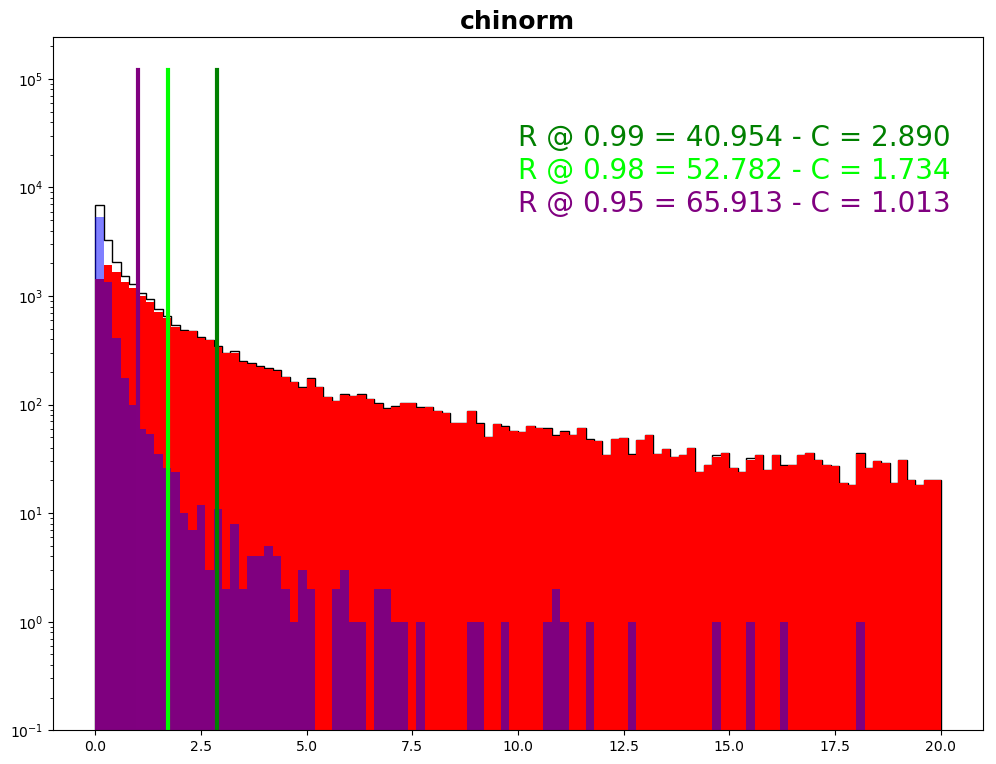

In [237]:
selection = quads & (PTs>0)
VAR="chinorm"
plt.figure(figsize=(12,9))
maxx = 20
plt.hist(tracks_val[selection][VAR].values,bins=100,log=True,range=(0.0,maxx),color="black",histtype="step");
plt.hist(tracks_val[selection & ~true_track][VAR].values,bins=100,log=True,range=(0.0,maxx),color="red");
plt.hist(tracks_val[selection & true_track][VAR].values,alpha=0.5,bins=100,log=True,range=(0.0,maxx),color="blue");

plt.title(VAR,fontsize=18,fontweight="bold")

T = len(tracks_val[selection & true_track])
F = len(tracks_val[selection & ~true_track])

quad_cuts[VAR] = []

for C in np.linspace(0.0,maxx,80):

    TS = len(tracks_val[selection & true_track & (tracks_val[VAR]<C)])
    if (TS/T) <0.95:
        continue
    FR = len(tracks_val[selection & ~true_track & (tracks_val[VAR]>C)])
    cs = C
    plt.text(maxx*0.5,n_tuples/200,"R @ 0.95 = %.3f - C = %.3f"%(FR/F*100.,C),fontsize=20,color="purple")
    plt.plot([C,C],[0,n_tuples/10],color="purple",lw=3)
    quad_cuts[VAR].append(C)
    break

for C in np.linspace(cs,maxx,80):

    TS = len(tracks_val[selection & true_track & (tracks_val[VAR]<C)])
    if (TS/T) <0.98:
        continue
    FR = len(tracks_val[selection & ~true_track & (tracks_val[VAR]>C)])
    cs = C
    plt.text(maxx*0.5,n_tuples/100,"R @ 0.98 = %.3f - C = %.3f"%(FR/F*100.,C),fontsize=20,color="lime")
    plt.plot([C,C],[0,n_tuples/10],color="lime",lw=3)
    quad_cuts[VAR].append(C)
    break

for C in np.linspace(cs,maxx,80):

    TS = len(tracks_val[selection & true_track & (tracks_val[VAR]<C)])
    if (TS/T) <0.99:
        continue
    FR = len(tracks_val[selection & ~true_track & (tracks_val[VAR]>C)])
    cs = C
    plt.text(maxx*0.5,n_tuples/50,"R @ 0.99 = %.3f - C = %.3f"%(FR/F*100.,C),fontsize=20,color="green")
    plt.plot([C,C],[0,n_tuples/10],color="green",lw=3)
    quad_cuts[VAR].append(C)
    break
        
c_quads = cs   
    
    #plt.text(maxx*0.8,n_tuples/100,"Eff = %.3f"%(TS/T*100.),fontsize=20)
    
    #plt.text(maxx*0.8,n_tuples/400,"C = %.3f"%(C),fontsize=20)

#### Trips

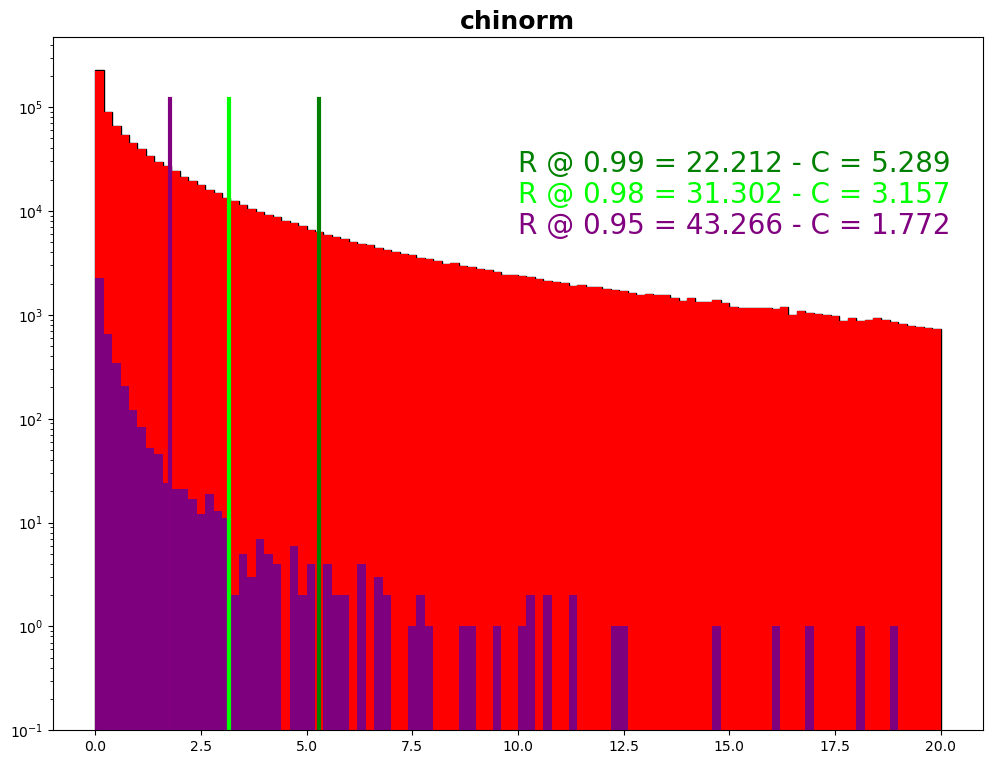

In [206]:
selection = (trips) & (PTs>0)
VAR="chinorm"
plt.figure(figsize=(12,9))
maxx = 20
plt.hist(tracks_val[selection][VAR].values,bins=100,log=True,range=(0.0,maxx),color="black",histtype="step");
plt.hist(tracks_val[selection & ~semi_true][VAR].values,bins=100,log=True,range=(0.0,maxx),color="red");
plt.hist(tracks_val[selection & semi_true][VAR].values,alpha=0.5,bins=100,log=True,range=(0.0,maxx),color="blue");

plt.title(VAR,fontsize=18,fontweight="bold")

T = len(tracks_val[selection & semi_true])
F = len(tracks_val[selection & ~semi_true])

quad_cuts[VAR] = []

for C in np.linspace(0.0,maxx,80):

    TS = len(tracks_val[selection & semi_true & (tracks_val[VAR]<C)])
    if (TS/T) <0.95:
        continue
    FR = len(tracks_val[selection & ~semi_true & (tracks_val[VAR]>C)])
    cs = C
    plt.text(maxx*0.5,n_tuples/200,"R @ 0.95 = %.3f - C = %.3f"%(FR/F*100.,C),fontsize=20,color="purple")
    plt.plot([C,C],[0,n_tuples/10],color="purple",lw=3)
    quad_cuts[VAR].append(C)
    break


for C in np.linspace(cs,maxx,80):

    TS = len(tracks_val[selection & semi_true & (tracks_val[VAR]<C)])
    if (TS/T) <0.98:
        continue
    FR = len(tracks_val[selection & ~semi_true & (tracks_val[VAR]>C)])
    cs = C
    plt.text(maxx*0.5,n_tuples/100,"R @ 0.98 = %.3f - C = %.3f"%(FR/F*100.,C),fontsize=20,color="lime")
    plt.plot([C,C],[0,n_tuples/10],color="lime",lw=3)
    quad_cuts[VAR].append(C)
    break



for C in np.linspace(cs,maxx,80):

    TS = len(tracks_val[selection & semi_true & (tracks_val[VAR]<C)])
    if (TS/T) <0.99:
        continue
    FR = len(tracks_val[selection & ~semi_true & (tracks_val[VAR]>C)])
    cs = C
    plt.text(maxx*0.5,n_tuples/50,"R @ 0.99 = %.3f - C = %.3f"%(FR/F*100.,C),fontsize=20,color="green")
    plt.plot([C,C],[0,n_tuples/10],color="green",lw=3)
    quad_cuts[VAR].append(C)
    break
        
c_trip = cs  
    
    #plt.text(maxx*0.8,n_tuples/100,"Eff = %.3f"%(TS/T*100.),fontsize=20)
    
    #plt.text(maxx*0.8,n_tuples/400,"C = %.3f"%(C),fontsize=20)

In [162]:
fake_bad = (frac>=0.75) & (QUAL==0)

In [163]:
def f(pt):
    coeffs = [-0.01712807,0.19422566,-0.70225201,0.76515225,0.45288349]
    ret = 30.0 * (coeffs[0] * pt*pt*pt*pt +
                    coeffs[1] * pt*pt*pt +
                    coeffs[2] * pt*pt +
                    coeffs[3] * pt
                    +coeffs[4]
                    ) -7.0
    return ret

array([-0.00422594,  0.04850895, -0.18204364,  0.23016353, -0.00627644])

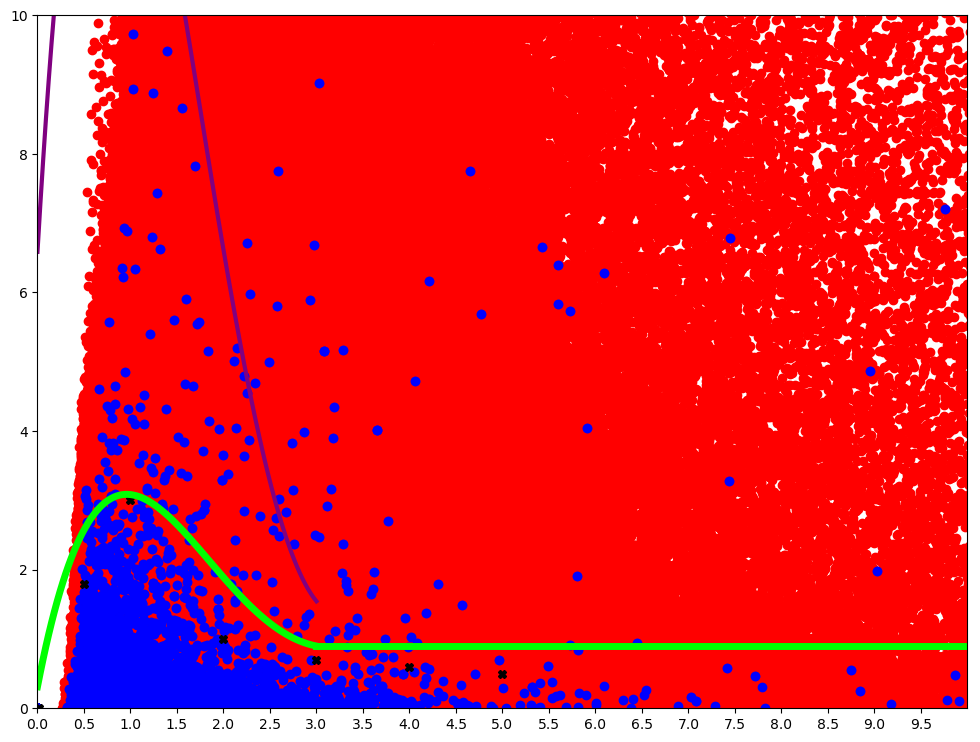

In [234]:
plt.figure(figsize=(12,9))

ptMax = 3.0

plt.plot(tracks_val[~true_track]["pt"].values,tracks_val[~true_track]["chinorm"].values,"o",color="red")

plt.plot(tracks_val[fake_bad]["pt"].values,tracks_val[fake_bad]["chinorm"].values,"o",color="purple")

plt.plot(tracks_val[true_track]["pt"].values,tracks_val[true_track]["chinorm"].values,"o",color="blue")

dots = np.linspace(0,ptMax,100)
plt.plot(dots,chiCut(dots),lw=3,color="orange")
plt.plot(dots,f(dots),lw=3,color="purple")

X_fit = np.array([0.02,0.5,1.0,2.0,3.0,4.0,5.0])
Y_fit = np.array([0.0,1.8,3.0,1.0,0.7,0.6,0.5])

z = np.polyfit(X_fit, Y_fit, 4)
p = np.poly1d(z)+0.5

plt.plot(X_fit,Y_fit,"X",color="black")
plt.plot(dots,p(dots),"-",color="lime",lw=5)
dots = np.linspace(ptMax,20,100)
plt.plot(dots,np.full(len(dots),p(ptMax)),"-",color="lime",lw=5)
plt.xlim(0.0,10.0)
plt.ylim(0.0,10.0)

plt.xticks(np.arange(0.0, 10.0, 0.5));

z/30.0

In [241]:
tracks_val["all_cut"] = c_all # p(tracks_val["pt"])
tracks_val.loc[tracks_val["pt"]>ptMax,"all_cut"] = p(ptMax)

In [242]:
selection = PTs>0 ##avoid unfitted duplicates
tt = np.zeros(len(tracks_val[true_track & selection]["chinorm"].values))
ff = np.zeros(len(tracks_val[~true_track & selection]["chinorm"].values))
tt[tracks_val[true_track & selection]["all_cut"].values >= tracks_val[true_track & selection]["chinorm"].values] = 1.0
ff[tracks_val[~true_track & selection]["all_cut"].values < tracks_val[~true_track & selection]["chinorm"].values] = 1.0
print("> Poly cut")
print("Eff: %.4f" % (tt.sum()/len(tt)))
print("Rej: %.4f" % (ff.sum()/len(ff)))


> Poly cut
Eff: 0.9873
Rej: 0.3022


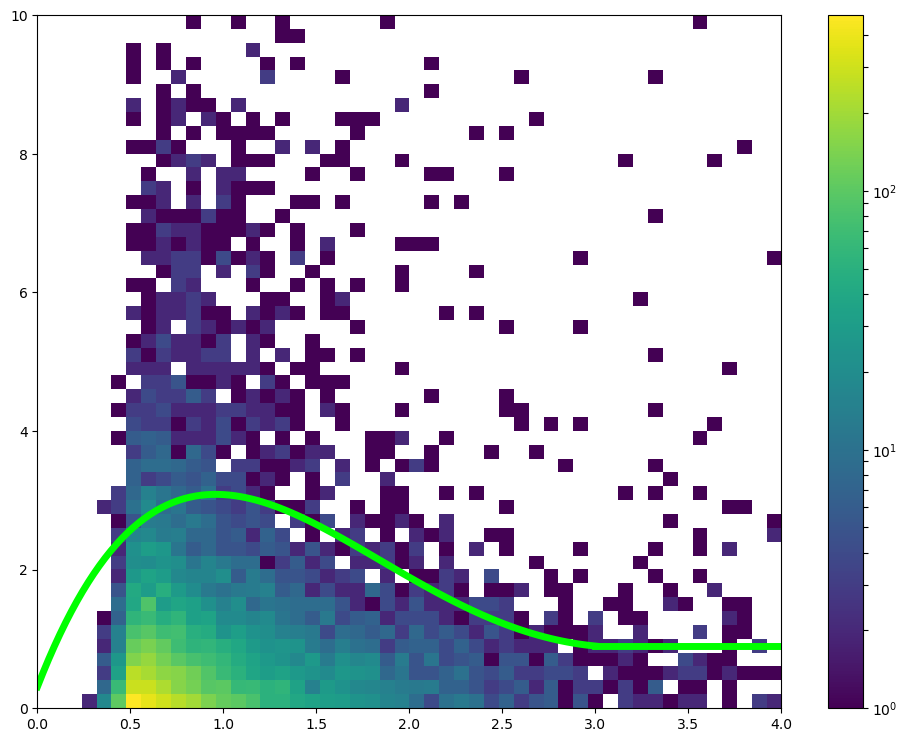

In [183]:
plt.figure(figsize=(12,9))
plt.hist2d(tracks_val[selection & true_track]["pt"].values,tracks_val[selection & super_true_track]["chi2"].values,bins=50,range=((0.0001,4),(0.0001,10.0)),norm=mpl.colors.LogNorm());
dots = np.linspace(0,3,100)
plt.plot(dots,p(dots),"-",color="lime",lw=5)
dots = np.linspace(3,20,100)
plt.plot(dots,np.full(len(dots),p(3)),"-",color="lime",lw=5)

plt.colorbar()

#### Trips

array([-0.00148115,  0.01221793, -0.02151726, -0.04292893,  0.12978092])

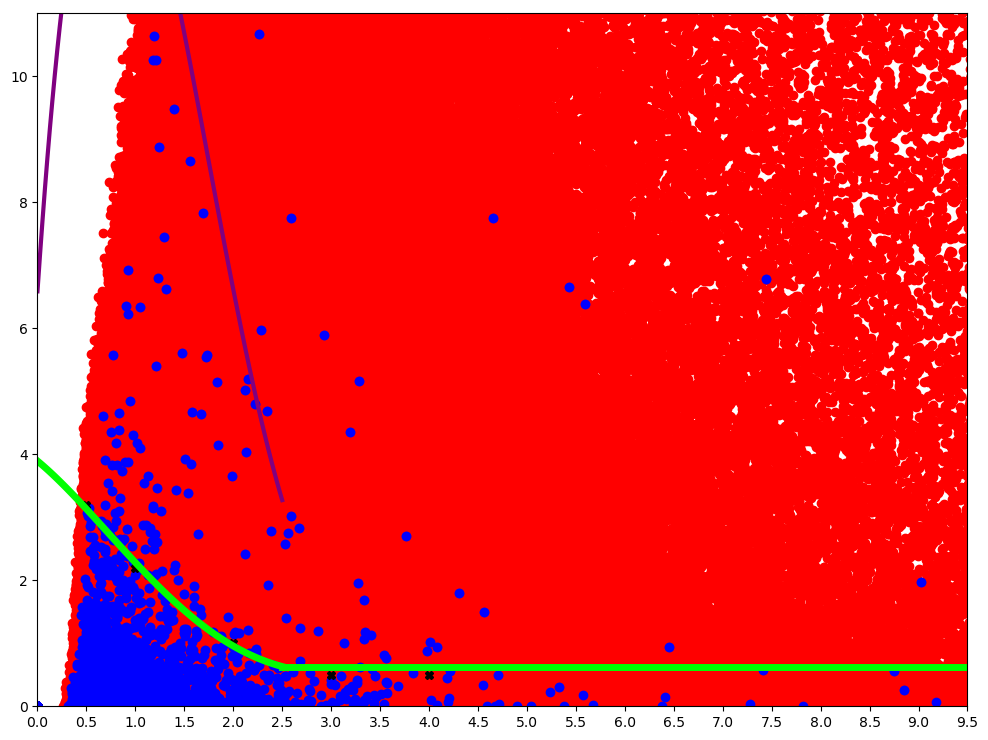

In [308]:
plt.figure(figsize=(12,9))
selection = trips

ptMax = 2.5

plt.plot(tracks_val[selection & ~super_true_track]["pt"].values,tracks_val[selection & ~super_true_track]["chinorm"].values,"o",color="red")

plt.plot(tracks_val[selection & fake_bad]["pt"].values,tracks_val[selection & fake_bad]["chinorm"].values,"o",color="purple")

plt.plot(tracks_val[selection & super_true_track]["pt"].values,tracks_val[selection & super_true_track]["chinorm"].values,"o",color="blue")

dots = np.linspace(0,ptMax,100)
plt.plot(dots,chiCut(dots),lw=3,color="orange")
plt.plot(dots,f(dots),lw=3,color="purple")

X_fit = np.array([-0.1,0.5,1.0,2.0,3.0,4.0])
Y_fit = np.array([4.0,3.2,2.2,1.0,0.5,0.5])

z = np.polyfit(X_fit, Y_fit, 4)
p_trips = np.poly1d(z)

plt.plot(X_fit,Y_fit,"X",color="black")
plt.plot(dots,p_trips(dots),"-",color="lime",lw=5)
dots = np.linspace(ptMax,20,100)
plt.plot(dots,np.full(len(dots),p_trips(ptMax)),"-",color="lime",lw=5)
plt.xlim(0.0,4.0)
plt.ylim(0.0,11.0)

plt.xticks(np.arange(0.0, 10.0, 0.5));

z/30.0

In [338]:
tracks_val["trip_cut"] = 3.5 #p(tracks_val["pt"])
tracks_val.loc[tracks_val["pt"]>ptMax,"trip_cut"] = 0.7#p_trips(ptMax)

In [336]:
p_trips(ptMax)

0.6307022607937331

In [339]:
selection = (trips) & (PTs>0) ##avoid unfitted duplicates
tt = np.zeros(len(tracks_val[true_track & selection]["chinorm"].values))
ff = np.zeros(len(tracks_val[~true_track & selection]["chinorm"].values))
tt[tracks_val[true_track & selection]["trip_cut"].values >= tracks_val[true_track & selection]["chinorm"].values] = 1.0
ff[tracks_val[~true_track & selection]["trip_cut"].values < tracks_val[~true_track & selection]["chinorm"].values] = 1.0
print("> Poly cut")
print("Eff: %.4f" % (tt.sum()/len(tt)))
print("Rej: %.4f" % (ff.sum()/len(ff)))

> Poly cut
Eff: 0.9749
Rej: 0.3336


In [317]:
tt = np.zeros(len(tracks_val[true_track & selection]["chinorm"].values))
ff = np.zeros(len(tracks_val[~true_track & selection]["chinorm"].values))
tt[tracks_val[true_track & selection]["chinorm"].values <= c_trip] = 1.0
ff[tracks_val[~true_track & selection]["chinorm"].values > c_trip] = 1.0
print("> Linear cut")
print("Eff: %.4f" % (tt.sum()/len(tt)))
print("Rej: %.4f" % (ff.sum()/len(ff)))

> Linear cut
Eff: 0.9989
Rej: 0.2477


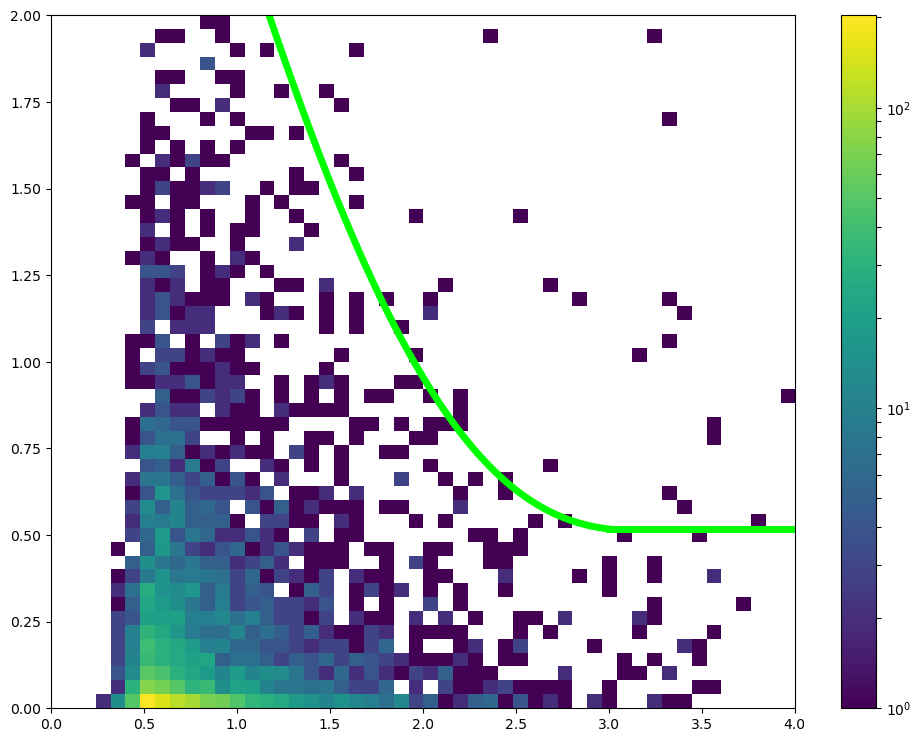

In [249]:
plt.figure(figsize=(12,9))
plt.hist2d(tracks_val[selection & true_track]["pt"].values,tracks_val[selection & true_track]["chinorm"].values,bins=50,range=((0.0001,4),(0.0001,2.0)),norm=mpl.colors.LogNorm());
dots = np.linspace(0,ptMax,100)
plt.plot(dots,p_trips(dots),"-",color="lime",lw=5)
dots = np.linspace(ptMax,20,100)
plt.plot(dots,np.full(len(dots),p_trips(ptMax)),"-",color="lime",lw=5)
plt.colorbar()

#### Quads

array([-0.00026114,  0.00649631, -0.03731305,  0.03936967,  0.09792659])

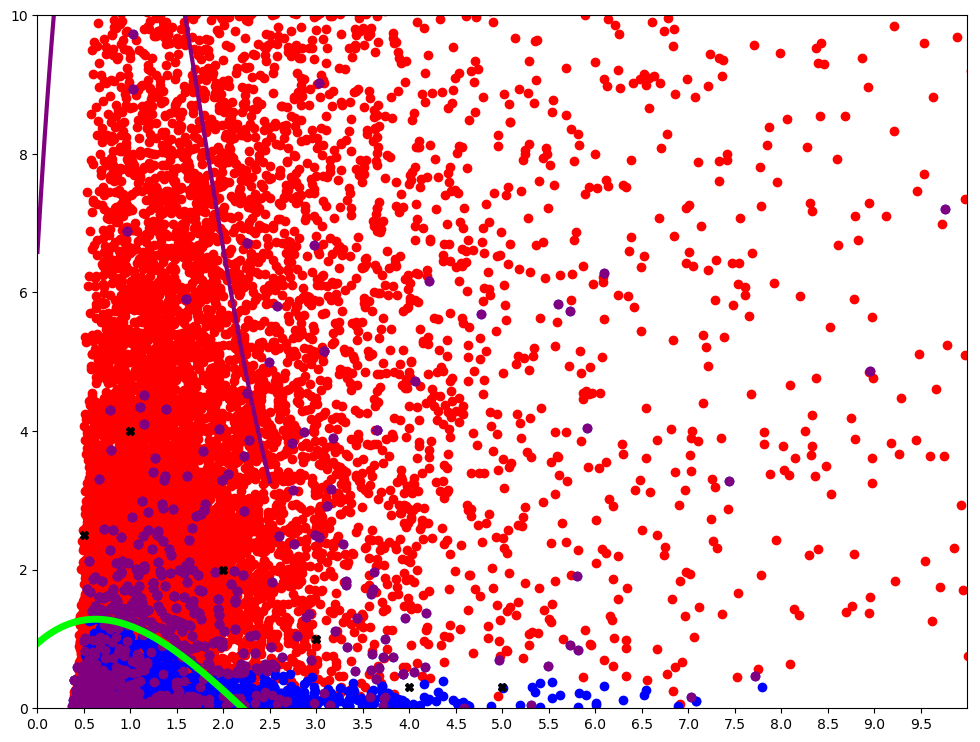

In [310]:
plt.figure(figsize=(12,9))
selection = quads & (PTs>0)

ptMax = 2.5

plt.plot(tracks_val[selection & ~true_track]["pt"].values,tracks_val[selection & ~true_track]["chinorm"].values,"o",color="red")
plt.plot(tracks_val[selection & true_track]["pt"].values,tracks_val[selection & true_track]["chinorm"].values,"o",color="blue")
plt.plot(tracks_val[selection & fake_bad]["pt"].values,tracks_val[selection & fake_bad]["chinorm"].values,"o",color="purple")
dots = np.linspace(0,ptMax,100)
plt.plot(dots,chiCut(dots),lw=3,color="orange")
plt.plot(dots,f(dots),lw=3,color="purple")

X_fit = np.array([-0.1,0.5,1.0,2.0,3.0,4.0,5.0])
Y_fit = np.array([3.0,2.5,4.0,2.0,1.0,0.3,0.3])

z = np.polyfit(X_fit, Y_fit, 4)
p_quads = np.poly1d(z) - 2

plt.plot(X_fit,Y_fit,"X",color="black")
plt.plot(dots,p_quads(dots),"-",color="lime",lw=5)
dots = np.linspace(ptMax,20,100)
plt.plot(dots,np.full(len(dots),p_quads(ptMax)),"-",color="lime",lw=5)
plt.xlim(0.0,10.0)
plt.ylim(0.0,10.0)

plt.xticks(np.arange(0.0, 10.0, 0.5));

z/30.0

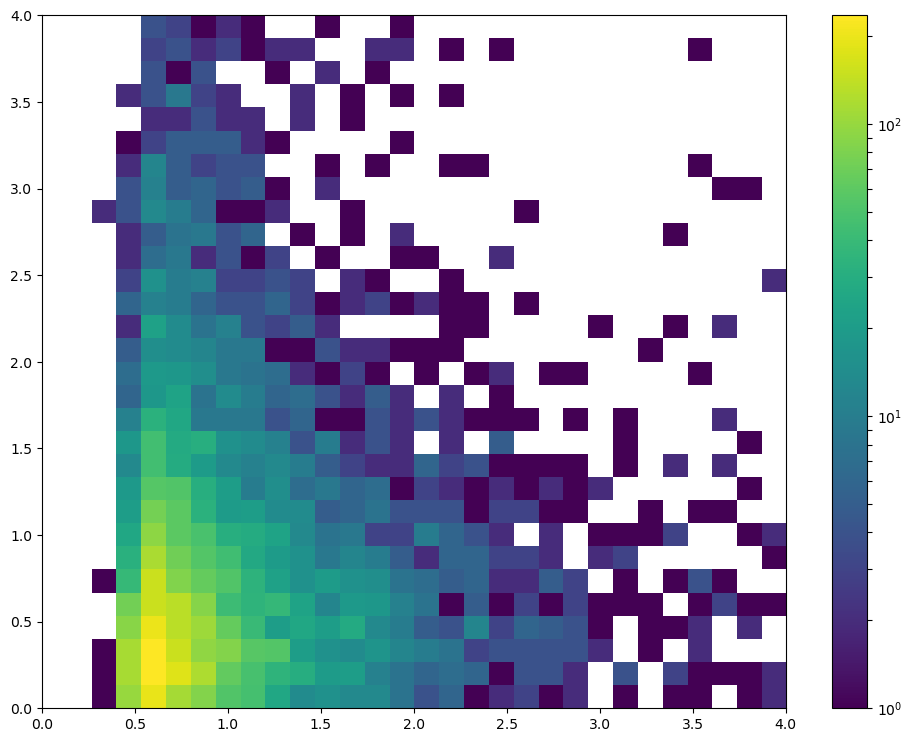

In [299]:
plt.figure(figsize=(12,9))
plt.hist2d(tracks_val[selection & true_track]["pt"].values,tracks_val[selection & true_track]["chi2"].values,bins=30,range=((0.0001,4),(0.0001,4.0)),norm=mpl.colors.LogNorm());
plt.colorbar()

In [341]:
tracks_val["quad_cut"] = 2.9 #p(tracks_val["pt"])
tracks_val.loc[tracks_val["pt"]>ptMax,"quad_cut"] = 0.5#p_quads(ptMax)

In [340]:
c_quads

2.889791679765698

In [312]:
ptMax

2.5

In [342]:
selection = quads
tt = np.zeros(len(tracks_val[true_track & selection]["chinorm"].values))
ff = np.zeros(len(tracks_val[~true_track & selection]["chinorm"].values))
tt[tracks_val[true_track & selection]["quad_cut"].values > tracks_val[true_track & selection]["chinorm"].values] = 1.0
ff[tracks_val[~true_track & selection]["quad_cut"].values <= tracks_val[~true_track & selection]["chinorm"].values] = 1.0
print("> Poly cut")
print("Eff: %.4f" % (tt.sum()/len(tt)))
print("Rej: %.4f" % (ff.sum()/len(ff)))

> Poly cut
Eff: 0.9962
Rej: 0.3668


In [325]:
tt = np.zeros(len(tracks_val[true_track & selection]["chinorm"].values))
ff = np.zeros(len(tracks_val[~true_track & selection]["chinorm"].values))
tt[tracks_val[true_track & selection]["chinorm"].values <= c_quads] = 1.0
ff[tracks_val[~true_track & selection]["chinorm"].values > c_quads] = 1.0
print("> Linear cut")
print("Eff: %.4f" % (tt.sum()/len(tt)))
print("Rej: %.4f" % (ff.sum()/len(ff)))

> Linear cut
Eff: 0.9976
Rej: 0.3477


### ROC Curve

_Trips_

Eff 0.990
T   5.250
Rej 0.777


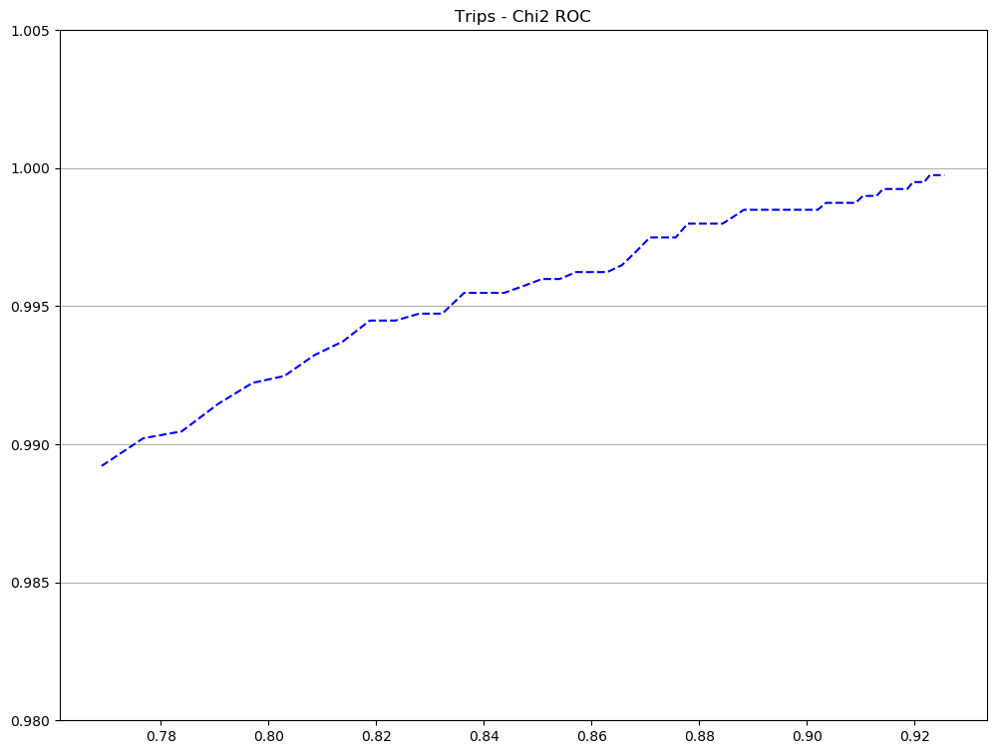

In [398]:
fpr = []
tpr = []

selection = trips & (PTs>0)

plt.figure(figsize=(12,9))
low = True
for t in np.arange(5.0,20.0,0.25):
    TS = len(tracks_val[selection & true_track & (tracks_val["chinorm"]<t)])
    T = len(tracks_val[selection & true_track])

    FR = len(tracks_val[selection & ~true_track & (tracks_val["chinorm"]>t)])
    F = len(tracks_val[selection & ~true_track])
    
    if(TS/T>=0.99 and low):
        print("Eff %.3f" %(TS/T))
        print("T   %.3f" %t)
        print("Rej %.3f" %(1.0-FR/F))
        low=False
    tpr.append(TS/T)
    fpr.append(1.0-FR/F)

plt.ylim(0.98,1.005)
plt.grid(axis="y")
plt.title("Trips - Chi2 ROC")

plt.plot(fpr,tpr,"--",color="blue")

_Quads_

Eff 0.991
T   3.000
Rej 0.599


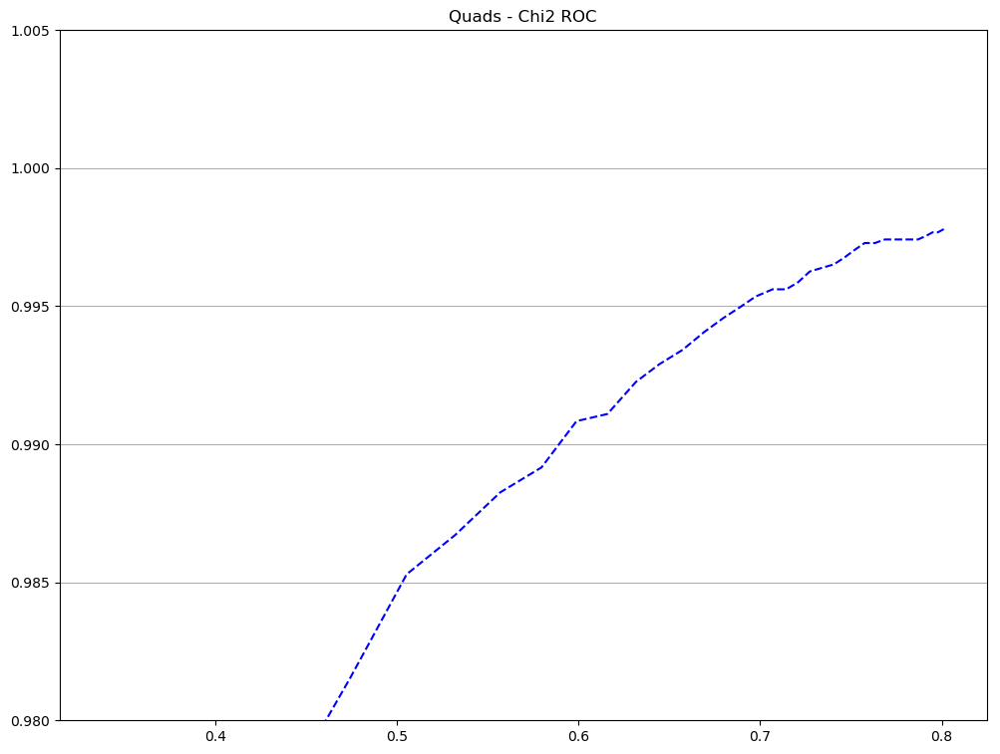

In [399]:
fpr = []
tpr = []

selection = quads & (PTs>0)

plt.figure(figsize=(12,9))
low = True
for t in np.arange(1.0,10.0,0.25):
    TS = len(tracks_val[selection & true_track & (tracks_val["chinorm"]<t)])
    T = len(tracks_val[selection & true_track])

    FR = len(tracks_val[selection & ~true_track & (tracks_val["chinorm"]>t)])
    F = len(tracks_val[selection & ~true_track])
    
    if(TS/T>=0.99 and low):
        print("Eff %.3f" %(TS/T))
        print("T   %.3f" %t)
        print("Rej %.3f" %(1.0-FR/F))
        low=False
    tpr.append(TS/T)
    fpr.append(1.0-FR/F)

plt.title("Quads - Chi2 ROC")
plt.ylim(0.98,1.005)
plt.grid(axis="y")

plt.plot(fpr,tpr,"--",color="blue")

### Tip & Zip

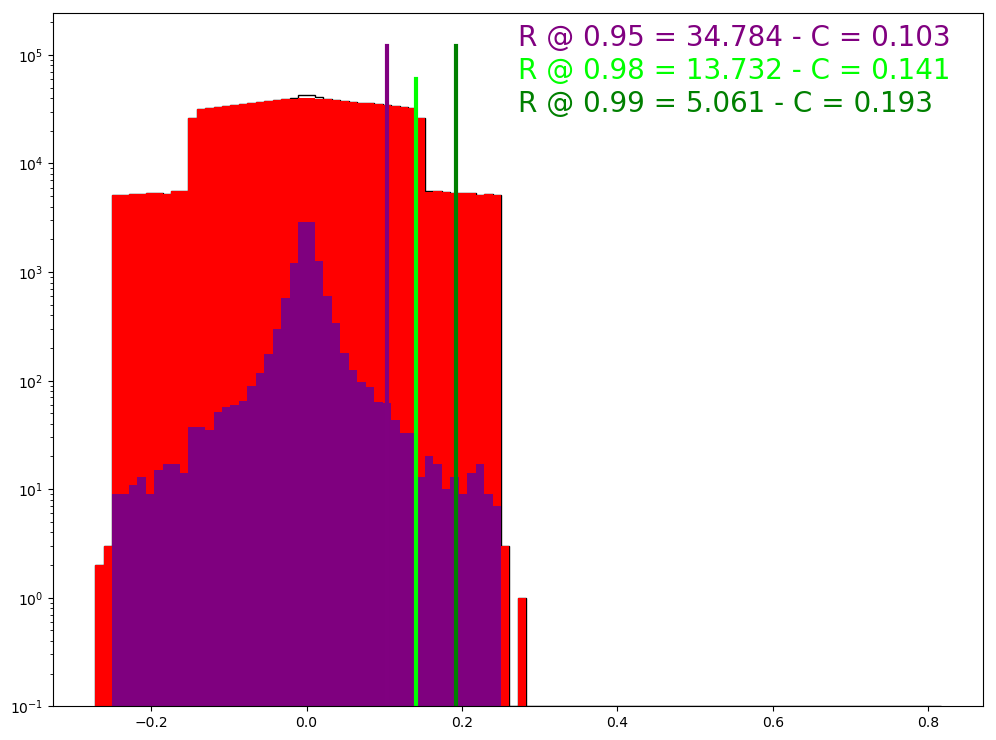

In [270]:
selection = tracks_val["pt"]>0.0
VAR="tip"
plt.figure(figsize=(12,9))
maxx = tracks_val[VAR].max()
plt.hist(tracks_val[selection][VAR].values,bins=100,log=True,range=(-maxx,maxx*3.0),color="black",histtype="step");
plt.hist(tracks_val[selection & ~true_track][VAR].values,bins=100,log=True,range=(-maxx,maxx*3),color="red");
plt.hist(tracks_val[selection & true_track][VAR].values,alpha=0.5,bins=100,log=True,range=(-maxx,maxx*3),color="blue");

T = len(tracks_val[selection & true_track])
F = len(tracks_val[selection & ~true_track])

quad_cuts[VAR] = []
for C in np.linspace(0.0,maxx,80):

    TS = len(tracks_val[selection & true_track & (tracks_val[VAR].abs()<C)])
    if (TS/T) <0.95:
        continue
    FR = len(tracks_val[selection & ~true_track & (tracks_val[VAR].abs()>C)])
    cs = C
    plt.text(maxx,n_tuples/10,"R @ 0.95 = %.3f - C = %.3f"%(FR/F*100.,C),fontsize=20,color="purple")
    plt.plot([C,C],[0,n_tuples/10],color="purple",lw=3)
    quad_cuts[VAR].append(C)
    break

for C in np.linspace(0.0,maxx,80):

    TS = len(tracks_val[selection & true_track & (tracks_val[VAR].abs()<C)])
    if (TS/T) <0.975:
        continue
    FR = len(tracks_val[selection & ~true_track & (tracks_val[VAR].abs()>C)])
    cs = C
    plt.text(maxx,n_tuples/20,"R @ 0.98 = %.3f - C = %.3f"%(FR/F*100.,C),fontsize=20,color="lime")
    plt.plot([C,C],[0,n_tuples/20],color="lime",lw=3)
    quad_cuts[VAR].append(C)
    break

for C in np.linspace(0.0,maxx,80):

    TS = len(tracks_val[selection & true_track & (tracks_val[VAR].abs()<C)])
    if (TS/T) <0.99:
        continue
    FR = len(tracks_val[selection & ~true_track & (tracks_val[VAR].abs()>C)])
    cs = C
    plt.text(maxx,n_tuples/40,"R @ 0.99 = %.3f - C = %.3f"%(FR/F*100.,C),fontsize=20,color="green")
    plt.plot([C,C],[0,n_tuples/10],color="green",lw=3)
    quad_cuts[VAR].append(C)
    break


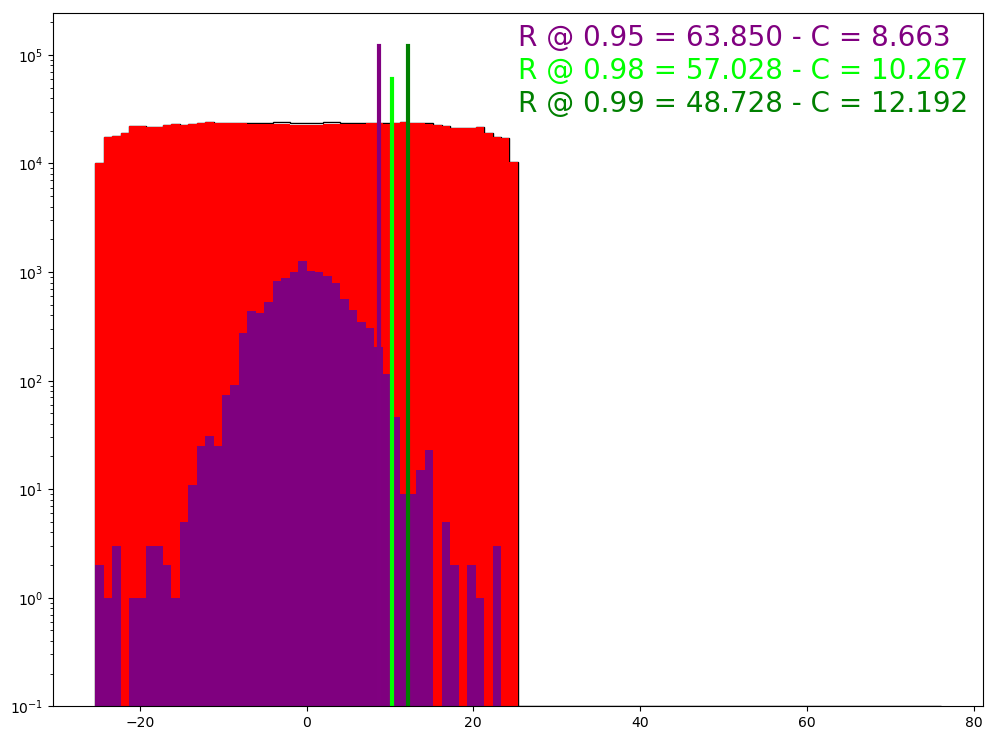

In [269]:
selection = tracks_val["pt"]>0.0
VAR="zip"
plt.figure(figsize=(12,9))
maxx = tracks_val[VAR].max()
plt.hist(tracks_val[selection][VAR].values,bins=100,log=True,range=(-maxx,maxx*3.0),color="black",histtype="step");
plt.hist(tracks_val[selection & ~true_track][VAR].values,bins=100,log=True,range=(-maxx,maxx*3),color="red");
plt.hist(tracks_val[selection & true_track][VAR].values,alpha=0.5,bins=100,log=True,range=(-maxx,maxx*3),color="blue");

T = len(tracks_val[selection & true_track])
F = len(tracks_val[selection & ~true_track])

quad_cuts[VAR] = []
for C in np.linspace(0.0,maxx,80):

    TS = len(tracks_val[selection & true_track & (tracks_val[VAR].abs()<C)])
    if (TS/T) <0.95:
        continue
    FR = len(tracks_val[selection & ~true_track & (tracks_val[VAR].abs()>C)])
    cs = C
    plt.text(maxx,n_tuples/10,"R @ 0.95 = %.3f - C = %.3f"%(FR/F*100.,C),fontsize=20,color="purple")
    plt.plot([C,C],[0,n_tuples/10],color="purple",lw=3)
    quad_cuts[VAR].append(C)
    break

for C in np.linspace(0.0,maxx,80):

    TS = len(tracks_val[selection & true_track & (tracks_val[VAR].abs()<C)])
    if (TS/T) <0.98:
        continue
    FR = len(tracks_val[selection & ~true_track & (tracks_val[VAR].abs()>C)])
    cs = C
    plt.text(maxx,n_tuples/20,"R @ 0.98 = %.3f - C = %.3f"%(FR/F*100.,C),fontsize=20,color="lime")
    plt.plot([C,C],[0,n_tuples/20],color="lime",lw=3)
    quad_cuts[VAR].append(C)
    break

for C in np.linspace(0.0,maxx,80):

    TS = len(tracks_val[selection & true_track & (tracks_val[VAR].abs()<C)])
    if (TS/T) <0.99:
        continue
    FR = len(tracks_val[selection & ~true_track & (tracks_val[VAR].abs()>C)])
    cs = C
    plt.text(maxx,n_tuples/40,"R @ 0.99 = %.3f - C = %.3f"%(FR/F*100.,C),fontsize=20,color="green")
    plt.plot([C,C],[0,n_tuples/10],color="green",lw=3)
    quad_cuts[VAR].append(C)
    break



#### Trips

Text(0.5,1,'3.0 - tip')

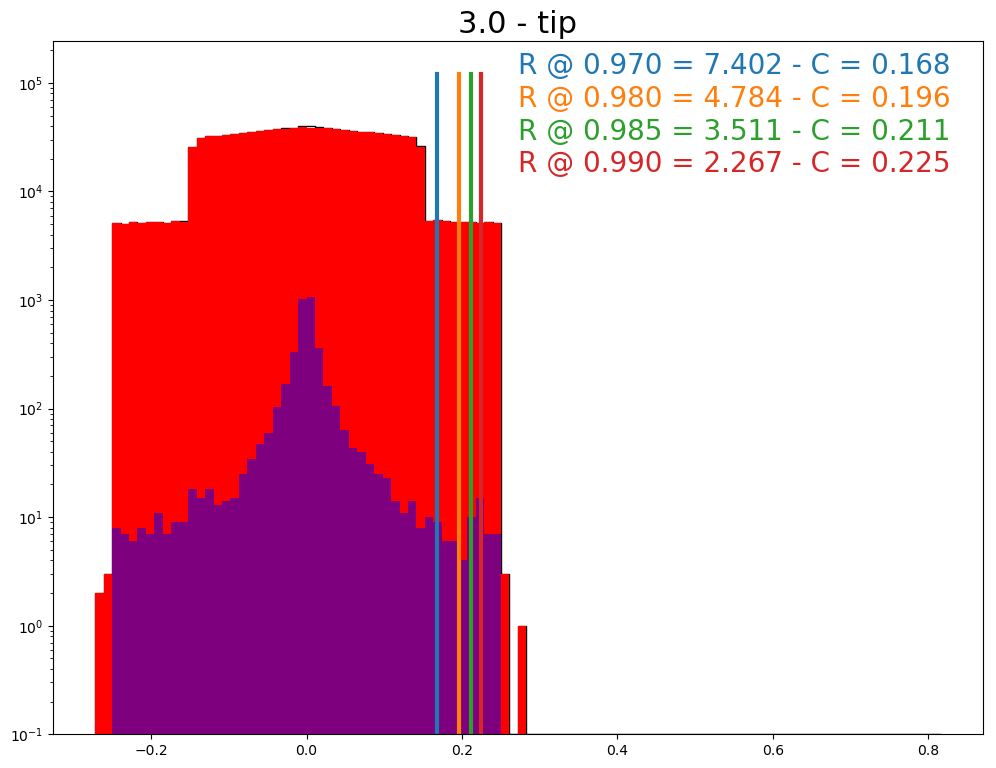

In [260]:
selection = trips & (tracks_val["pt"]>0.0)
da_true = super_true_track
VAR="tip"
plt.figure(figsize=(12,9))
maxx = tracks_val[VAR].max()
plt.hist(tracks_val[selection][VAR].values,bins=100,log=True,range=(-maxx,maxx*3.0),color="black",histtype="step");
plt.hist(tracks_val[selection & ~da_true][VAR].values,bins=100,log=True,range=(-maxx,maxx*3),color="red");
plt.hist(tracks_val[selection & da_true][VAR].values,alpha=0.5,bins=100,log=True,range=(-maxx,maxx*3),color="blue");

T = len(tracks_val[selection & da_true])
F = len(tracks_val[selection & ~da_true])

quad_cuts[VAR] = []

selex = [0.97,0.98,0.985,0.99]
cs = 0.0
pos = n_tuples/10
for s in selex:
       
    for C in np.linspace(cs,maxx,100):

        TS = len(tracks_val[selection & da_true & (tracks_val[VAR].abs()<C)])
        if (TS/T) <s:
            continue
        FR = len(tracks_val[selection & ~da_true & (tracks_val[VAR].abs()>C)])
        C = float(np.round(C,decimals=3))
        TS = len(tracks_val[selection & da_true & (tracks_val[VAR].abs()<C)])
        cs = C
        
        lll = plt.plot([C,C],[0,n_tuples/10],lw=3)
        
        plt.text(maxx,pos,"R @ %.3f = %.3f - C = %.3f"%(TS/T,FR/F*100.,C),fontsize=20,color=lll[0].get_color())
        pos = pos / 2
        
        quad_cuts[VAR].append(C)
        break

plt.title(str(tracks_val[selection]["n"].min()) + " - " + str(VAR),fontsize=22)



Text(0.5,1,'3.0 - zip')

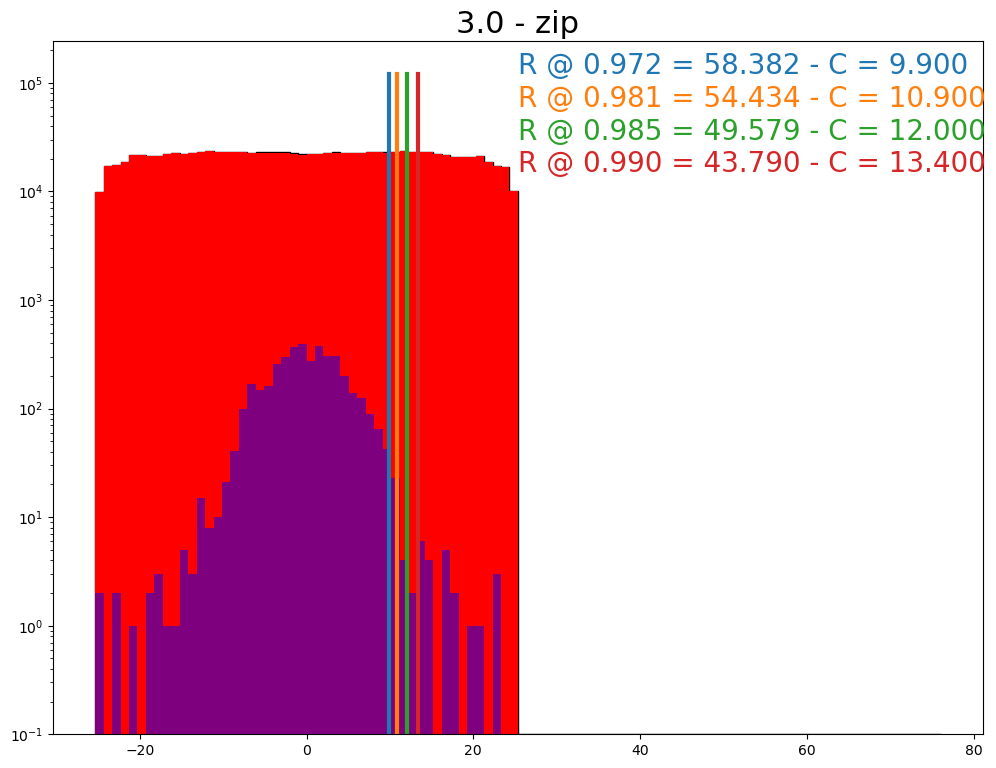

In [261]:
selection = trips & (tracks_val["pt"]>0.0)
da_true = super_true_track
VAR="zip"
plt.figure(figsize=(12,9))
maxx = tracks_val[VAR].max()
plt.hist(tracks_val[selection][VAR].values,bins=100,log=True,range=(-maxx,maxx*3.0),color="black",histtype="step");
plt.hist(tracks_val[selection & ~da_true][VAR].values,bins=100,log=True,range=(-maxx,maxx*3),color="red");
plt.hist(tracks_val[selection & da_true][VAR].values,alpha=0.5,bins=100,log=True,range=(-maxx,maxx*3),color="blue");

T = len(tracks_val[selection & da_true])
F = len(tracks_val[selection & ~da_true])

quad_cuts[VAR] = []

selex = [0.97,0.98,0.985,0.99]
cs = 0.0
pos = n_tuples/10
for s in selex:
       
    for C in np.linspace(cs,maxx,80):

        TS = len(tracks_val[selection & da_true & (tracks_val[VAR].abs()<C)])
        if (TS/T) <s:
            continue
        FR = len(tracks_val[selection & ~da_true & (tracks_val[VAR].abs()>C)])
        C = float(np.round(C,decimals=1))
        TS = len(tracks_val[selection & da_true & (tracks_val[VAR].abs()<C)])
        cs = C
        
        lll = plt.plot([C,C],[0,n_tuples/10],lw=3)
        
        plt.text(maxx,pos,"R @ %.3f = %.3f - C = %.3f"%(TS/T,FR/F*100.,C),fontsize=20,color=lll[0].get_color())
        pos = pos / 2
        
        quad_cuts[VAR].append(C)
        break

plt.title(str(tracks_val[selection]["n"].min()) + " - " + str(VAR),fontsize=22)


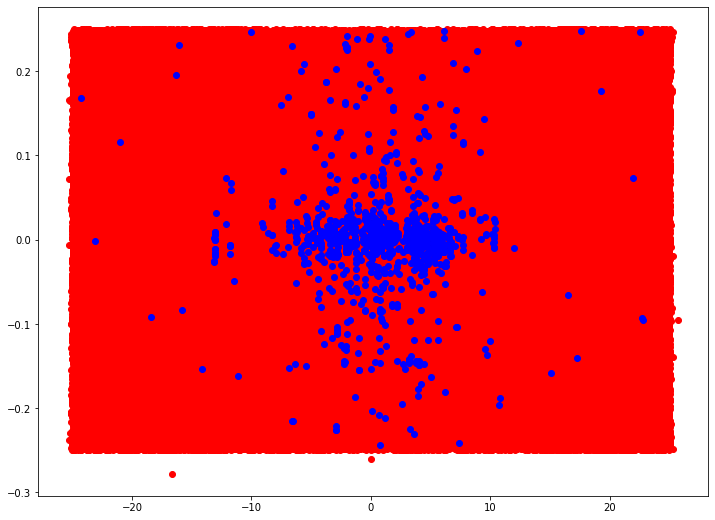

In [332]:
plt.figure(figsize=(12,9))
selection = trips
da_true = true_track

ptMax = 2.2

plt.plot(tracks_val[selection & ~da_true]["zip"].values,tracks_val[selection & ~da_true]["tip"].values,"o",color="red")
plt.plot(tracks_val[selection & da_true]["zip"].values,tracks_val[selection & da_true]["tip"].values,"o",color="blue")



#### Quads

Text(0.5,1,'4.0 - tip')

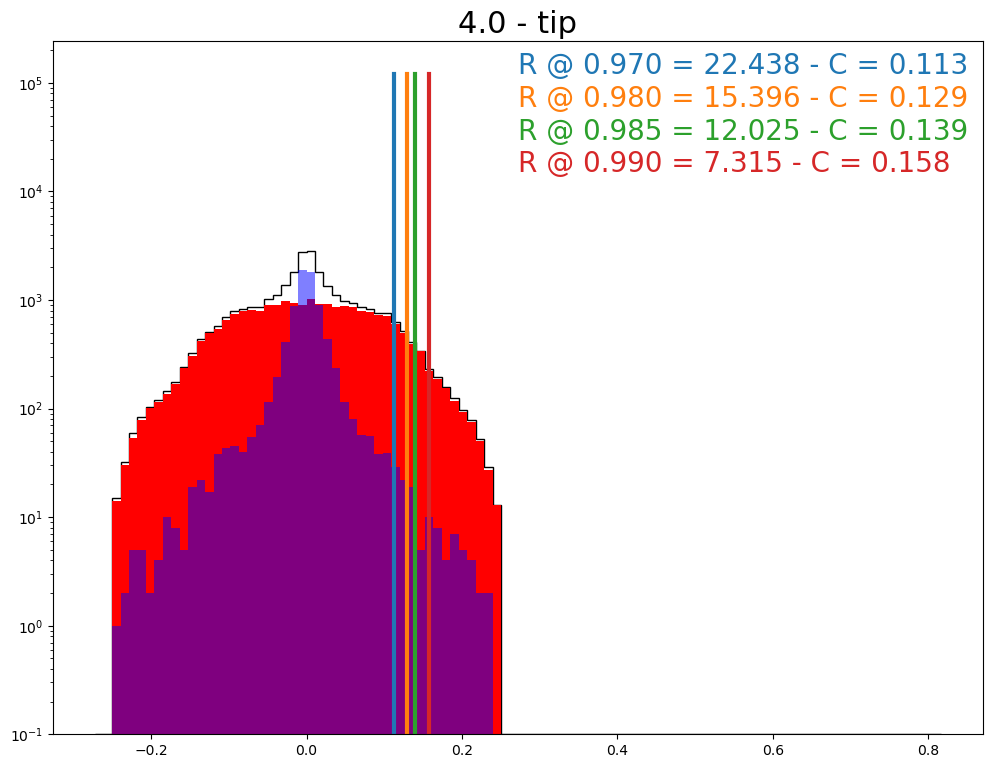

In [266]:
selection = quads & (tracks_val["pt"]>0.0)
da_true = true_track
VAR="tip"
plt.figure(figsize=(12,9))
maxx = tracks_val[VAR].max()
plt.hist(tracks_val[selection][VAR].values,bins=100,log=True,range=(-maxx,maxx*3.0),color="black",histtype="step");
plt.hist(tracks_val[selection & ~da_true][VAR].values,bins=100,log=True,range=(-maxx,maxx*3),color="red");
plt.hist(tracks_val[selection & da_true][VAR].values,alpha=0.5,bins=100,log=True,range=(-maxx,maxx*3),color="blue");

T = len(tracks_val[selection & da_true])
F = len(tracks_val[selection & ~da_true])

quad_cuts[VAR] = []

selex = [0.97,0.98,0.985,0.99]
cs = 0.0
pos = n_tuples/10
for s in selex:
       
    for C in np.linspace(cs,maxx,100):

        TS = len(tracks_val[selection & da_true & (tracks_val[VAR].abs()<C)])
        if (TS/T) <s:
            continue
        FR = len(tracks_val[selection & ~da_true & (tracks_val[VAR].abs()>C)])
        C = float(np.round(C,decimals=3))
        TS = len(tracks_val[selection & da_true & (tracks_val[VAR].abs()<C)])
        cs = C
        
        lll = plt.plot([C,C],[0,n_tuples/10],lw=3)
        
        plt.text(maxx,pos,"R @ %.3f = %.3f - C = %.3f"%(TS/T,FR/F*100.,C),fontsize=20,color=lll[0].get_color())
        pos = pos / 2
        
        quad_cuts[VAR].append(C)
        break

plt.title(str(tracks_val[selection]["n"].min()) + " - " + str(VAR),fontsize=22)




Text(0.5,1,'4.0 - zip')

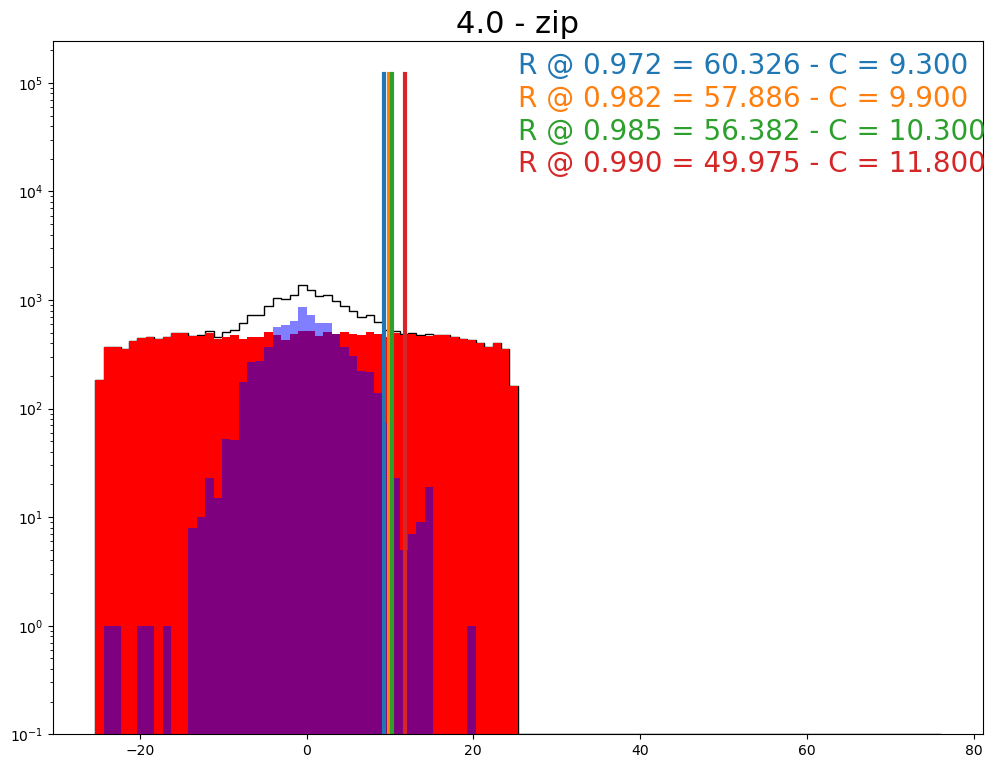

In [267]:
selection = quads & (tracks_val["pt"]>0.0)
da_true = true_track
VAR="zip"
plt.figure(figsize=(12,9))
maxx = tracks_val[VAR].max()
plt.hist(tracks_val[selection][VAR].values,bins=100,log=True,range=(-maxx,maxx*3.0),color="black",histtype="step");
plt.hist(tracks_val[selection & ~da_true][VAR].values,bins=100,log=True,range=(-maxx,maxx*3),color="red");
plt.hist(tracks_val[selection & da_true][VAR].values,alpha=0.5,bins=100,log=True,range=(-maxx,maxx*3),color="blue");

T = len(tracks_val[selection & da_true])
F = len(tracks_val[selection & ~da_true])

quad_cuts[VAR] = []

selex = [0.97,0.98,0.985,0.99]
cs = 0.0
pos = n_tuples/10
for s in selex:
       
    for C in np.linspace(cs,maxx,80):

        TS = len(tracks_val[selection & da_true & (tracks_val[VAR].abs()<C)])
        if (TS/T) <s:
            continue
        FR = len(tracks_val[selection & ~da_true & (tracks_val[VAR].abs()>C)])
        C = float(np.round(C,decimals=1))
        TS = len(tracks_val[selection & da_true & (tracks_val[VAR].abs()<C)])
        cs = C
        
        lll = plt.plot([C,C],[0,n_tuples/10],lw=3)
        
        plt.text(maxx,pos,"R @ %.3f = %.3f - C = %.3f"%(TS/T,FR/F*100.,C),fontsize=20,color=lll[0].get_color())
        pos = pos / 2
        
        quad_cuts[VAR].append(C)
        break

plt.title(str(tracks_val[selection]["n"].min()) + " - " + str(VAR),fontsize=22)



### Slopes & Deltas

In [168]:
tracks_val["deltax_0"] = tracks_val["x_1"] - tracks_val["x_0"]
tracks_val["deltax_1"] = tracks_val["x_2"] - tracks_val["x_1"]

In [169]:
tracks_val["deltay_0"] = tracks_val["y_1"] - tracks_val["y_0"]
tracks_val["deltay_1"] = tracks_val["y_2"] - tracks_val["y_1"]

In [170]:
tracks_val["deltaz_0"] = tracks_val["z_1"] - tracks_val["z_0"]
tracks_val["deltaz_1"] = tracks_val["z_2"] - tracks_val["z_1"]

In [171]:
tracks_val["deltar_0"] = tracks_val["r_1"] - tracks_val["r_0"]
tracks_val["deltar_1"] = tracks_val["r_2"] - tracks_val["r_1"]

In [172]:
tracks_val["slope_0"] = tracks_val["deltaz_0"]/tracks_val["deltar_0"]
tracks_val["slope_1"] = tracks_val["deltaz_1"]/tracks_val["deltar_1"]

True
Eff = 100.000
Reh = 0.000
SuperTrue
Eff = 100.000
Reh = 0.000


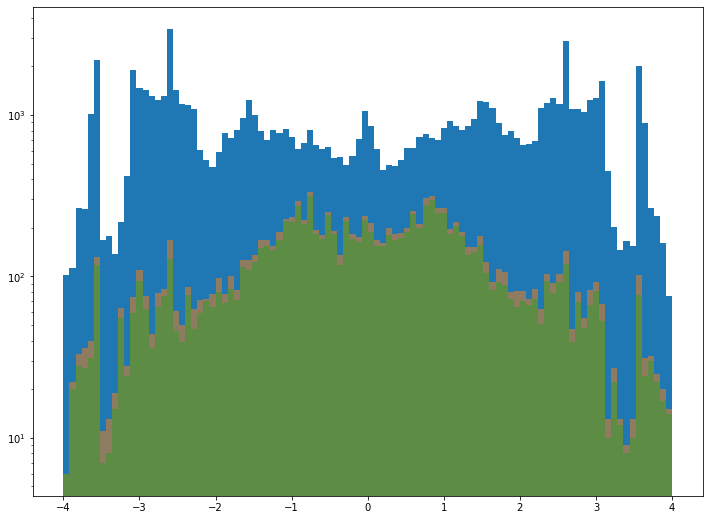

In [173]:
VAR = "deltax_0"
CUT = 30

plt.figure(figsize=(12,9))
plt.hist(tracks_val[~true_track][VAR].values,bins=100,log=True,range=(-4.0,4));
plt.hist(tracks_val[true_track][VAR].values,alpha=0.5,bins=100,log=True,range=(-4.0,4));
plt.hist(tracks_val[super_true_track][VAR].values,alpha=0.5,bins=100,log=True,range=(-4.0,4));

print("True")
TS = len(tracks_val[true_track & (tracks_val[VAR]<CUT)])
T = len(tracks_val[true_track])

FR = len(tracks_val[~true_track & (tracks_val[VAR]>CUT)])
F = len(tracks_val[~true_track])

print("Eff = %.3f"%(TS/T*100.))
print("Reh = %.3f"%(FR/F*100.))

print("SuperTrue")
TS = len(tracks_val[super_true_track & (tracks_val[VAR].abs()<CUT)])
T = len(tracks_val[super_true_track])

FR = len(tracks_val[~super_true_track & (tracks_val[VAR].abs()>CUT)])
F = len(tracks_val[~super_true_track])

print("Eff = %.3f"%(TS/T*100.))
print("Reh = %.3f"%(FR/F*100.))

True
Eff = 100.000
Reh = 0.000
SuperTrue
Eff = 100.000
Reh = 0.000


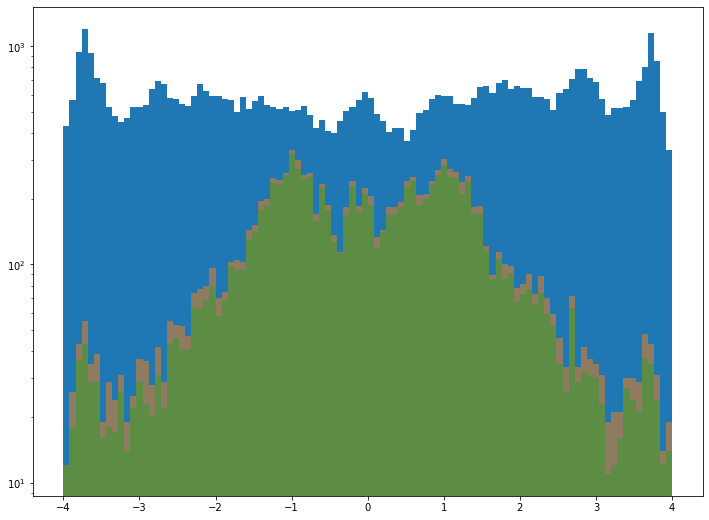

In [174]:
VAR = "deltax_1"
CUT = 30

plt.figure(figsize=(12,9))
plt.hist(tracks_val[~true_track][VAR].values,bins=100,log=True,range=(-4.0,4));
plt.hist(tracks_val[true_track][VAR].values,alpha=0.5,bins=100,log=True,range=(-4.0,4));
plt.hist(tracks_val[super_true_track][VAR].values,alpha=0.5,bins=100,log=True,range=(-4.0,4));

print("True")
TS = len(tracks_val[true_track & (tracks_val[VAR]<CUT)])
T = len(tracks_val[true_track])

FR = len(tracks_val[~true_track & (tracks_val[VAR]>CUT)])
F = len(tracks_val[~true_track])

print("Eff = %.3f"%(TS/T*100.))
print("Reh = %.3f"%(FR/F*100.))

print("SuperTrue")
TS = len(tracks_val[super_true_track & (tracks_val[VAR].abs()<CUT)])
T = len(tracks_val[super_true_track])

FR = len(tracks_val[~super_true_track & (tracks_val[VAR].abs()>CUT)])
F = len(tracks_val[~super_true_track])

print("Eff = %.3f"%(TS/T*100.))
print("Reh = %.3f"%(FR/F*100.))

True
Eff = 100.000
Reh = 0.000
SuperTrue
Eff = 100.000
Reh = 0.000


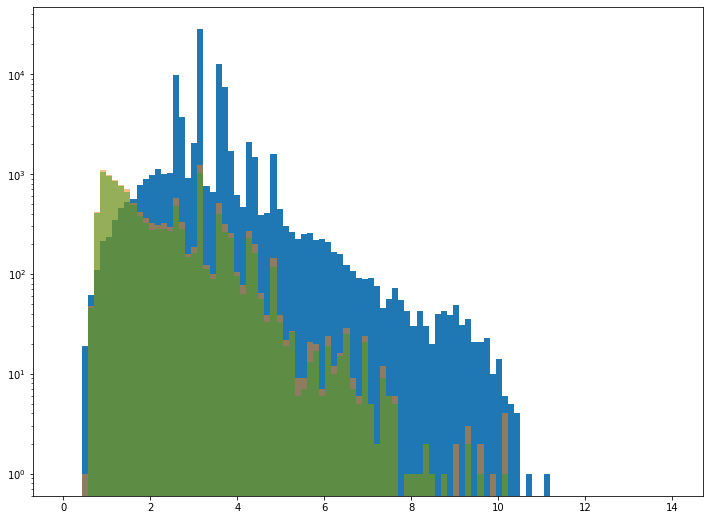

In [175]:
VAR = "deltar_0"
CUT = 30

plt.figure(figsize=(12,9))
plt.hist(tracks_val[~true_track][VAR].values,bins=100,log=True,range=(.0,14));
plt.hist(tracks_val[true_track][VAR].values,alpha=0.5,bins=100,log=True,range=(.0,14));
plt.hist(tracks_val[super_true_track][VAR].values,alpha=0.5,bins=100,log=True,range=(.0,14));

print("True")
TS = len(tracks_val[true_track & (tracks_val[VAR]<CUT)])
T = len(tracks_val[true_track])

FR = len(tracks_val[~true_track & (tracks_val[VAR]>CUT)])
F = len(tracks_val[~true_track])

print("Eff = %.3f"%(TS/T*100.))
print("Reh = %.3f"%(FR/F*100.))

print("SuperTrue")
TS = len(tracks_val[super_true_track & (tracks_val[VAR].abs()<CUT)])
T = len(tracks_val[super_true_track])

FR = len(tracks_val[~super_true_track & (tracks_val[VAR].abs()>CUT)])
F = len(tracks_val[~super_true_track])

print("Eff = %.3f"%(TS/T*100.))
print("Reh = %.3f"%(FR/F*100.))

(-10, 10)

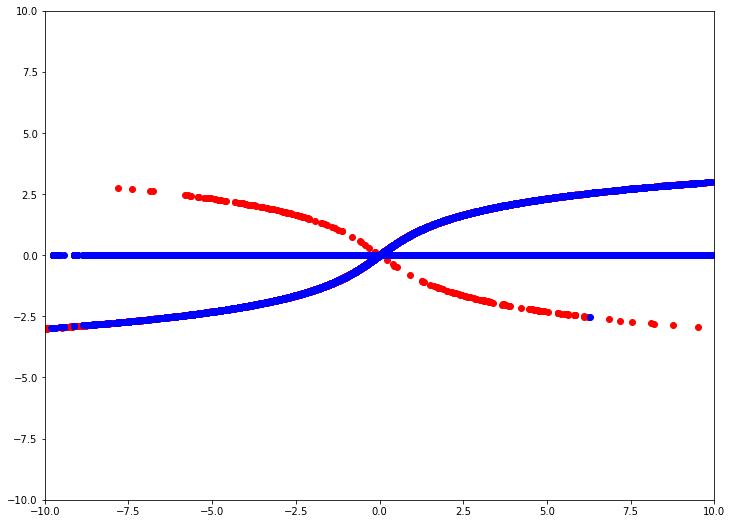

In [180]:
plt.figure(figsize=(12,9))

plt.plot(tracks_val[~true_track]["slope_1"].values,tracks_val[~true_track]["eta"].values,"o",color="red")
plt.plot(tracks_val[true_track]["slope_1"].values,tracks_val[true_track]["eta"].values,"o",color="blue")


plt.xlim(-10,10)
plt.ylim(-10,10)


### ThetaCut

In [257]:
def thetaNtuplet(X,ptmin=0.5):
    r1,z1,ri,zi,ro,zo, = X
    radius_diff = abs(r1 - ro);
    distance_13_squared = radius_diff * radius_diff + (z1 - zo) * (z1 - zo)
    pMin = ptmin * np.sqrt(distance_13_squared); 
    tan_12_13_half_mul_distance_13_squared = abs(z1 * (ri - ro) + zi * (ro - r1) + zo * (r1 - ri));
    return (tan_12_13_half_mul_distance_13_squared * pMin)/(distance_13_squared * radius_diff);

In [258]:
DETIDs = tracks_val[["det_id" + str(i) for i in range(0,13)]].values.astype(float)

In [271]:
ZZZs = np.full(3,99999.0).reshape(1,3)
RRRs = np.full(3,99999.0).reshape(1,3)
DDDs = np.full(1,99999.0)
PDGs = np.full(3,99999.0).reshape(1,3)
KEYs = np.full(3,99999.0).reshape(1,3)
for n in tracks_val["n"].value_counts().keys():

    cut = (tracks_val["n"]==n)
    zzz = np.array(Zs[cut,:int(n)])
    rrr = np.array(Rs[cut,:int(n)])
    ddd = np.array(DETIDs[cut,:int(n)])
    ppp = np.array(pdgS[cut,:int(n)])
    kkk = np.array(keyS[cut,:int(n)])
    if n==3:
        ZZZs = np.vstack([ZZZs,zzz])
        RRRs = np.vstack([RRRs,rrr])
        PDGs = np.vstack([PDGs,ppp])
        KEYs = np.vstack([KEYs,kkk])
        DDDs = np.concatenate([DDDs,ddd[:,1].flatten()])
    else:
        for k in range(0,int(n)-3):
            thisZ = zzz[:,k:k+3]
            thisR = rrr[:,k:k+3]
            thisP = ppp[:,k:k+3]
            thisK = kkk[:,k:k+3]
            
            ZZZs = np.vstack([ZZZs,thisZ])
            RRRs = np.vstack([RRRs,thisR])
            PDGs = np.vstack([PDGs,thisP])
            KEYs = np.vstack([KEYs,thisK])
            DDDs = np.concatenate([DDDs,ddd[:,k+1].flatten()])
            
ZZZs = ZZZs[1:]
RRRs = RRRs[1:]
PDGs = PDGs[1:]
KEYs = KEYs[1:]
DDDs = DDDs[1:].reshape(-1,1)

In [272]:
thetaCuts = pd.DataFrame(np.hstack([ZZZs,RRRs,DDDs,PDGs,KEYs]),columns=["z1","zi","zo","r1","ri","ro","d","pdg1","pdgi","pdgo","key1","keyi","keyo"])

In [273]:
cut = (thetaCuts["pdg1"] == thetaCuts["pdgo"]) & (thetaCuts["pdg1"] == thetaCuts["pdgi"])
cut = cut & (thetaCuts["key1"] == thetaCuts["keyo"]) & (thetaCuts["key1"] == thetaCuts["keyi"])
cut = cut & (thetaCuts["pdg1"] != -999.9) & (thetaCuts["key1"] != -999.9)

In [274]:
thetaCuts["true"] = 0.0
thetaCuts.loc[cut,"true"] = 1.0
cut = thetaCuts["true"] == 1.0
barr = thetaCuts["d"] <4

In [275]:
thetaCuts["theta"] = thetaCuts[["r1","z1","ri","zi","ro","zo"]].apply(lambda x : thetaNtuplet(x),axis=1)

In [276]:
thetaCuts.head()

,z1,zi,zo,r1,ri,ro,d,pdg1,pdgi,pdgo,key1,keyi,keyo,true,theta
0,-11.33030,-4.48779,13.82450,2.753770,5.920934,14.400102,1.0,211.0,-11.0,321.0,120349.0,136074.0,140861.0,0.0,0.000032
1,32.57600,41.49900,51.71100,9.602341,12.227629,15.221807,6.0,-321.0,-321.0,-321.0,128446.0,128446.0,128446.0,1.0,0.000412
2,5.04816,-9.99406,-24.40000,2.792431,5.904825,8.877232,1.0,211.0,321.0,-11.0,133555.0,131705.0,97564.0,0.0,0.000343
3,25.60000,41.09900,51.71100,5.237569,9.998309,13.271537,6.0,211.0,211.0,211.0,147153.0,126237.0,122502.0,0.0,0.000480
4,-6.81008,-7.76090,-9.96617,2.796558,6.413529,14.984397,1.0,-211.0,211.0,-211.0,153192.0,142606.0,81086.0,0.0,0.000564


0.016714899163717687


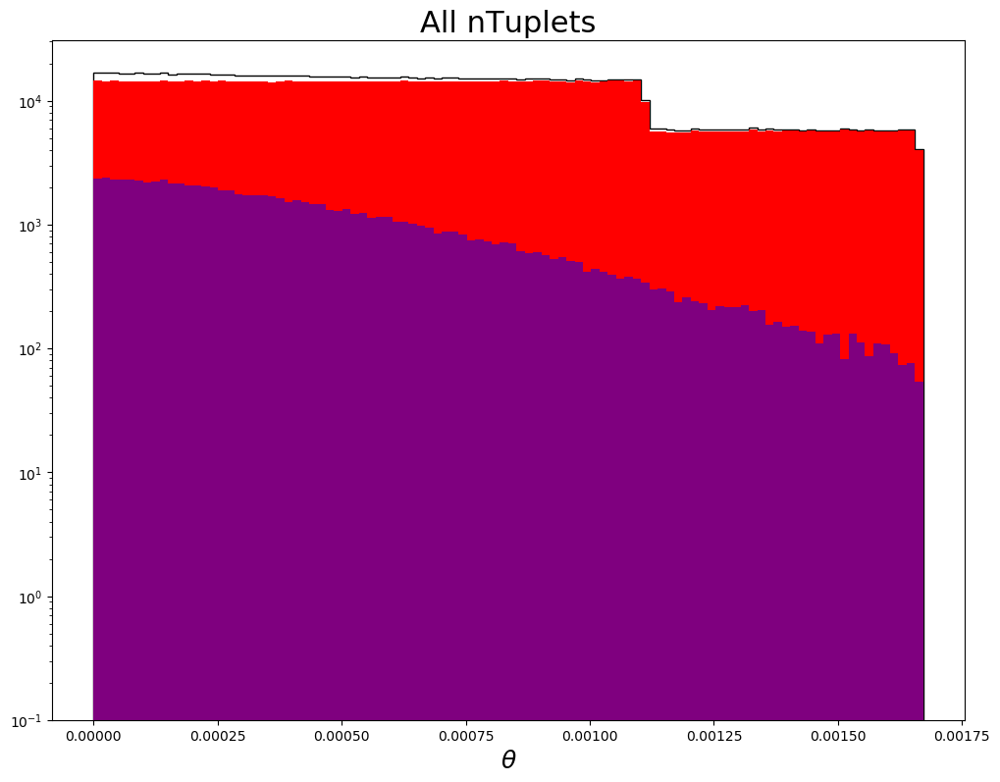

In [277]:
VAR = "theta"
maxx = thetaCuts[VAR].values.max()
print(maxx*10)
plt.title("All nTuplets",fontsize=22)

plt.hist(thetaCuts[VAR].values,bins=100,log=True,range=(0.0,maxx),color="black",histtype="step");
plt.hist(thetaCuts[~cut][VAR].values,bins=100,log=True,range=(0.0,maxx),color="red");
plt.hist(thetaCuts[cut][VAR].values,alpha=0.5,bins=100,log=True,range=(0.0,maxx),color="blue");

plt.xlabel(r"$\theta$",fontsize=18);

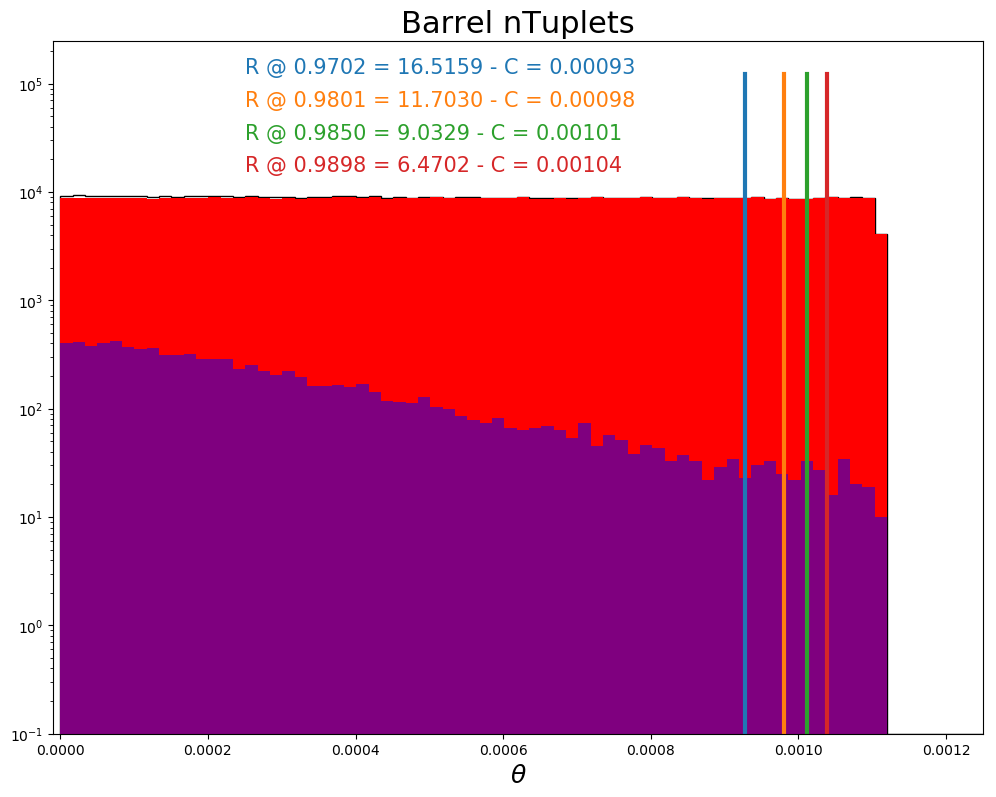

In [348]:
VAR = "theta"
maxx = thetaCuts[VAR].values.max()

selection = barr
da_true = cut

plt.title("Barrel nTuplets",fontsize=22)
plt.xlabel(r"$\theta$",fontsize=18);

selex = [0.97,0.98,0.985,0.99]
cs = maxx/2
pos = len(thetaCuts)/10

T = len(thetaCuts[selection & da_true])
F = len(thetaCuts[selection & ~da_true])

for s in selex:

    for C in np.linspace(cs,maxx,1000):

        TS = len(thetaCuts[selection & da_true & (thetaCuts[VAR]<C)])
        if (TS/T) <s:
            continue
        FR = len(thetaCuts[selection & ~da_true & (thetaCuts[VAR]>C)])
        C = float(np.round(C,decimals=6))
        TS = len(thetaCuts[selection & da_true & (thetaCuts[VAR]<C)])
        cs = C
                
        lll = plt.plot([C,C],[0,len(thetaCuts)/10],lw=3)
        
        plt.text(0.00025,pos,"R @ %.4f = %.4f - C = %.5f"%(TS/T,FR/F*100.,C),fontsize=15,color=lll[0].get_color())
        pos = pos / 2
        
        break
plt.xlim(-0.00001,0.00125)
plt.hist(thetaCuts[barr][VAR].values,bins=100,log=True,range=(0.0,maxx),color="black",histtype="step");
plt.hist(thetaCuts[~cut & barr][VAR].values,bins=100,log=True,range=(0.0,maxx),color="red");
plt.hist(thetaCuts[cut & barr][VAR].values,alpha=0.5,bins=100,log=True,range=(0.0,maxx),color="blue");

In [349]:
maxx

0.0016714899163717686

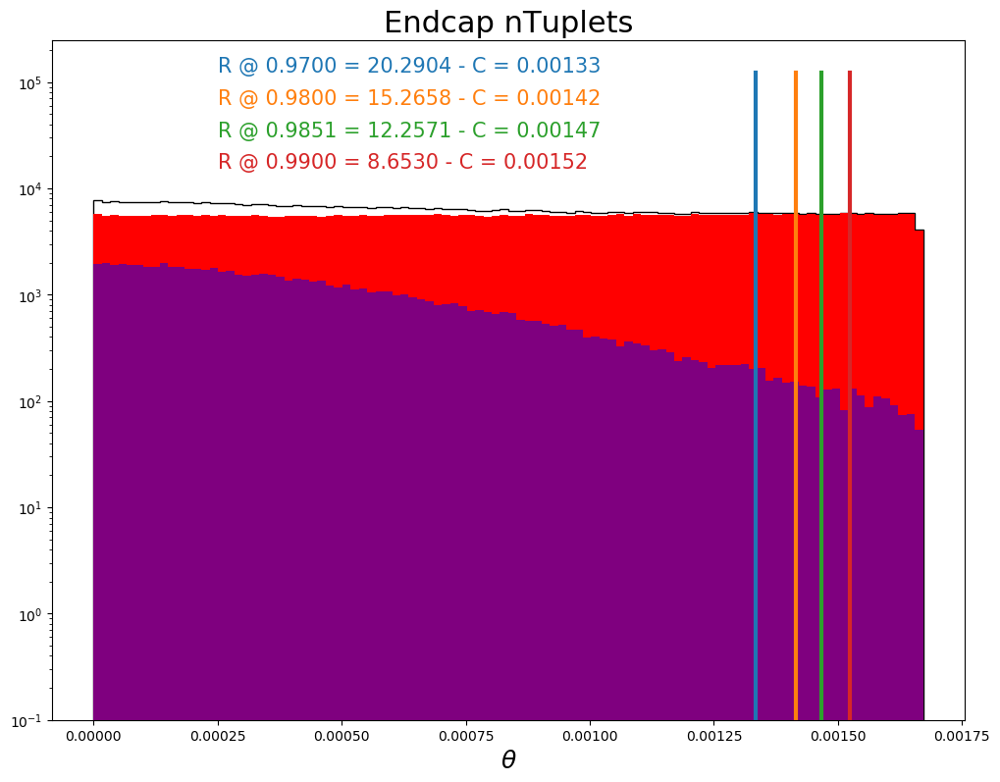

In [346]:
VAR = "theta"
maxx = thetaCuts[VAR].values.max()

selection = ~barr
da_true = cut

plt.title("Endcap nTuplets",fontsize=22)
plt.xlabel(r"$\theta$",fontsize=18);

selex = [0.97,0.98,0.985,0.99]
cs = maxx/2
pos = len(thetaCuts)/10

T = len(thetaCuts[selection & da_true])
F = len(thetaCuts[selection & ~da_true])

for s in selex:

    for C in np.linspace(cs,maxx,1000):

        TS = len(thetaCuts[selection & da_true & (thetaCuts[VAR]<C)])
        if (TS/T) <s:
            continue
        FR = len(thetaCuts[selection & ~da_true & (thetaCuts[VAR]>C)])
        C = float(np.round(C,decimals=6))
        TS = len(thetaCuts[selection & da_true & (thetaCuts[VAR]<C)])
        cs = C
                
        lll = plt.plot([C,C],[0,len(thetaCuts)/10],lw=3)
        
        plt.text(0.00025,pos,"R @ %.4f = %.4f - C = %.5f"%(TS/T,FR/F*100.,C),fontsize=15,color=lll[0].get_color())
        pos = pos / 2
        
        break
      
plt.hist(thetaCuts[~barr][VAR].values,bins=100,log=True,range=(0.0,maxx),color="black",histtype="step");
plt.hist(thetaCuts[~cut & ~barr][VAR].values,bins=100,log=True,range=(0.0,maxx),color="red");
plt.hist(thetaCuts[cut & ~barr][VAR].values,alpha=0.5,bins=100,log=True,range=(0.0,maxx),color="blue");

In [197]:
print([25.0 for f in range(51)])

[25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0]
